In [1]:
from IPython.core.interactiveshell import InteractiveShell
import time

old_run_cell = InteractiveShell.run_cell

def timing_run_cell(self, raw_cell, *args, **kwargs):
    t0 = time.time()
    result = old_run_cell(self, raw_cell, *args, **kwargs)
    t1 = time.time()
    print(f"Execution time: {t1 - t0:.4f} seconds")
    return result

InteractiveShell.run_cell = timing_run_cell

In [2]:
import os
os.environ["JAX_PLATFORMS"] = "cpu"
# os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=1"
os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=8"
#os.environ["CUDA_VISIBLE_DEVICES"] = ""

import jax
print("backend:", jax.default_backend())
print("devices:", jax.devices())

backend: cpu
devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
Execution time: 2.8712 seconds


# Import packages

In [3]:
from matplotlib.pyplot import figure, show
import matplotlib.pyplot as plt
import numpy as np
#import sys
import emcee
from functools import partial
import corner
import os
#import pickle
import scipy.integrate as spint
from scipy.special import gammainc, gamma
import scipy.interpolate as spl
# import scipy.special as special
from scipy.stats import gaussian_kde
# import itertools
import jax.numpy as jnp
import jax.lax as lax
import jax.random as random
#import jax.scipy as jsp
import blackjax
from multiprocessing import Pool
from jax import config
config.update("jax_enable_x64", True)
import pandas as pd
from decimal import Decimal, getcontext
import scipy.optimize as optimize
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation, PillowWriter
from fractions import Fraction
# import multiprocessing as mp
from concurrent.futures import ProcessPoolExecutor
from concurrent.futures import ThreadPoolExecutor
import multiprocess as mp
from loky import get_reusable_executor

/Users/andreacosta/venvs/mlenv/lib/python3.11/site-packages/arviz/__init__.py:39: FutureWarning: 
ArviZ is undergoing a major refactor to improve flexibility and extensibility while maintaining a user-friendly interface.
Some upcoming changes may be backward incompatible.
For details and migration guidance, visit: https://python.arviz.org/en/latest/user_guide/migration_guide.html
  warn(


Execution time: 4.3233 seconds


In [4]:
# show JAX device that is being used
print(jax.devices())

[CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
Execution time: 0.0003 seconds


# Load Observational Data

In [5]:
BARY = pd.read_csv('../data/baryons1.csv')
TOTAL = pd.read_csv('../data/galaxies_total_sample.csv')
GAS = pd.read_csv('../data/gasses.csv')
STAR = pd.read_csv('../data/stars.csv')

common_names = set(BARY['Name']) & set(GAS['Name']) & set(STAR['Name'])
print(f"BARY: {len(BARY)}, GAS: {len(GAS)}, STAR: {len(STAR)}, common: {len(common_names)}")

b = BARY[BARY['Name'].isin(common_names)][['Name', 'Mass(Msun)', 'e_Mass(Msun)', 'j', 'e_j', 'fgas', 'e_fgas']].copy()
b.columns = ['Name', 'Mbar', 'e_Mbar', 'jbar', 'e_jbar', 'fgas', 'e_fgas']

g = GAS[GAS['Name'].isin(common_names)][['Name', 'Mass', 'e_Mass', 'j', 'e_j']].copy()
g.columns = ['Name', 'Mgas', 'e_Mgas', 'jgas', 'e_jgas']

s = STAR[STAR['Name'].isin(common_names)][['Name', 'Mass', 'e_Mass', 'j', 'e_j']].copy()
s.columns = ['Name', 'Mstar', 'e_Mstar', 'jstar', 'e_jstar']

CONVERGED = b.merge(g, on='Name').merge(s, on='Name')

# Update Mstar and jstar with improved photometry from Pavel+2025 where available
P25 = pd.read_csv('../data/pavel2025_stellar.csv')
p25_in_conv = P25[P25['Name'].isin(CONVERGED['Name'])].set_index('Name')
n_updated = 0
for name, row in p25_in_conv.iterrows():
    mask = CONVERGED['Name'] == name
    CONVERGED.loc[mask, 'Mstar'] = 10**row['logMstar']
    CONVERGED.loc[mask, 'e_Mstar'] = 10**row['logMstar'] * np.log(10) * row['e_logMstar']
    CONVERGED.loc[mask, 'jstar'] = row['jstar']
    CONVERGED.loc[mask, 'e_jstar'] = row['e_jstar']
    n_updated += 1
print(f"Updated stellar properties for {n_updated}/{len(P25)} Pavel+2025 galaxies")

# Recompute Mbar, fgas, jbar and their errors for ALL galaxies
Mgas = CONVERGED['Mgas'].values.astype(float)
Mstar = CONVERGED['Mstar'].values.astype(float)
e_Mgas = CONVERGED['e_Mgas'].values.astype(float)
e_Mstar = CONVERGED['e_Mstar'].values.astype(float)
jgas = CONVERGED['jgas'].values.astype(float)
jstar = CONVERGED['jstar'].values.astype(float)
e_jgas = CONVERGED['e_jgas'].values.astype(float)
e_jstar = CONVERGED['e_jstar'].values.astype(float)

Mbar = Mgas + Mstar
e_Mbar = np.sqrt(e_Mgas**2 + e_Mstar**2)

fgas = Mgas / Mbar
# error propagation: fgas = Mgas/(Mgas+Mstar)
e_fgas = np.sqrt((Mstar * e_Mgas)**2 + (Mgas * e_Mstar)**2) / Mbar**2

jbar = (Mgas * jgas + Mstar * jstar) / Mbar
# error propagation for mass-weighted average
e_jbar = (1.0 / Mbar) * np.sqrt(
    (jgas * e_Mgas)**2 + (Mgas * e_jgas)**2 +
    (jstar * e_Mstar)**2 + (Mstar * e_jstar)**2 +
    (jbar * e_Mbar)**2
)

CONVERGED['Mbar'] = Mbar
CONVERGED['e_Mbar'] = e_Mbar
CONVERGED['fgas'] = fgas
CONVERGED['e_fgas'] = e_fgas
CONVERGED['jbar'] = jbar
CONVERGED['e_jbar'] = e_jbar
print("Recomputed Mbar, fgas, jbar and their errors for all (updated) galaxies")

print(f"CONVERGED: {len(CONVERGED)} galaxies")
CONVERGED.to_csv('../data/common_sample.csv', index=False)
CONVERGED.head()

BARY: 105, GAS: 87, STAR: 130, common: 77
Updated stellar properties for 20/49 Pavel+2025 galaxies
Recomputed Mbar, fgas, jbar and their errors for all (updated) galaxies
CONVERGED: 77 galaxies


,Name,Mbar,e_Mbar,jbar,e_jbar,fgas,e_fgas,Mgas,e_Mgas,jgas,e_jgas,Mstar,e_Mstar,jstar,e_jstar
0,DDO064,3.210000e+08,1.584330e+08,63.916822,50.345403,0.753894,0.166049,242000000.0,150000000.0,71.3,25.1,7.900000e+07,5.100000e+07,41.30,21.60
1,DDO101,8.070000e+07,9.449910e+07,52.004957,92.399002,0.261462,0.406264,21100000.0,31200000.0,63.6,50.6,5.960000e+07,8.920000e+07,47.90,47.80
2,DDO126,1.701189e+08,3.326747e+07,60.527332,18.271083,0.852345,0.061435,145000000.0,31400000.0,62.5,8.3,2.511886e+07,1.098928e+07,49.14,4.92
3,DDO133,2.478257e+08,9.269165e+07,62.991441,35.733796,0.468071,0.191868,116000000.0,77000000.0,64.8,26.0,1.318257e+08,5.160177e+07,61.40,4.17
4,DDO154,2.764815e+08,4.117591e+07,148.726031,32.805292,0.958473,0.017604,265000000.0,40900000.0,154.0,8.5,1.148154e+07,4.758699e+06,27.00,2.48


Execution time: 0.0203 seconds


In [6]:
obs_log_Mbar = np.log10(CONVERGED['Mbar'].values.copy())
obs_log_Mbar_errors = CONVERGED['e_Mbar'].values.copy()/CONVERGED['Mbar'].values.copy()
obs_log_Mgas = np.log10(CONVERGED['Mgas'].values.copy())
obs_log_Mgas_errors = CONVERGED['e_Mgas'].values.copy()/CONVERGED['Mgas'].values.copy()
obs_log_Mstar = np.log10(CONVERGED['Mstar'].values.copy())
obs_log_Mstar_errors = CONVERGED['e_Mstar'].values.copy()/CONVERGED['Mstar'].values.copy()
obs_log_jbar = np.log10(CONVERGED['jbar'].values.copy())
obs_log_jbar_errors = CONVERGED['e_jbar'].values.copy()/CONVERGED['jbar'].values.copy()
obs_log_jgas = np.log10(CONVERGED['jgas'].values.copy())
obs_log_jgas_errors = CONVERGED['e_jgas'].values.copy()/CONVERGED['jgas'].values.copy()
obs_log_jstar = np.log10(CONVERGED['jstar'].values.copy())
obs_log_jstar_errors = CONVERGED['e_jstar'].values.copy()/CONVERGED['jstar'].values.copy()
obs_fgas = CONVERGED['fgas'].values.copy()
obs_fgas_errors = CONVERGED['e_fgas'].values.copy()
# obs_fgas_but_for_stars_and_gas = CONVERGED['Mgas'].values.copy()/(CONVERGED['Mgas'].values.copy() + CONVERGED['Mstar'].values.copy())
# obs_fgas_but_for_stars_and_gas_errors = np.sqrt( (CONVERGED['e_Mgas'].values.copy()/(CONVERGED['Mgas'].values.copy() + CONVERGED['Mstar'].values.copy()))**2 + (CONVERGED['Mgas'].values.copy()*CONVERGED['e_Mstar'].values.copy()/((CONVERGED['Mgas'].values.copy() + CONVERGED['Mstar'].values.copy())**2))**2 )

pavel_dir = '../data/compilation_AM_others/'

pavel_data = {}
for filename in os.listdir(pavel_dir):
    if filename.endswith('.csv'):
        filepath = os.path.join(pavel_dir, filename)
        df = pd.read_csv(filepath)
        df_name = os.path.splitext(filename)[0]
        print(df_name)
        pavel_data[df_name] = df

HIX_data = pavel_data['HIX']

# HIX_logMstar = np.array([10.5, 10.7, 10.5, 10.5, 10.3, 10.2,  9.8, 10.1, 10.1, 10.1, 10.6, 10.5])
# HIX_logMHI = np.log10(1.4 * 10**np.array([10.6, 10.7, 10.5, 10.5, 10.4, 10.3,  9.9, 10.3, 10.4, 10.3, 10.9, 10.5]))
# HIX_logMbar = np.log10(10**HIX_logMstar + 10**HIX_logMHI)
# HIX_fgas = (10**HIX_logMHI)/(10**HIX_logMbar)
# HIX_jbar = np.array([4125.6, 3523.8, 5453.1, 4092.4, 3522.7, 3749.8, 1993. , 3196.7, 3388.2, 6377.8, 9764. , 4117.7])

Superthin
Superspirals
HIX
Dwarfs
Execution time: 0.0046 seconds


# Model definition

$j_{acc}(t) = 2v_{rot}(t)r_{acc}(t) \rightarrow r_{acc}(t) = \frac{j_{acc}(t)}{2 v_{rot}(t)}$ where $j_{acc}(t)=j_{min}+ k\cdot (j_{max}-j_{min}) \left( \frac{t}{t_0} \right)^n$ (start with n=1), and $v_{rot}(t) = \left( \frac{M_{bar}(t_0)}{A_G} \right)^{1/4}$

1) Determine $r_{acc}$ by determining $j_{acc}(t)$ and $v_{rot}(t)$:

   a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$.  This gives $v_{rot}(t)$.
   
   b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$ (as $j_{max}$ is when $f_{gas}=1 \rightarrow \log(f_{gas})=0$)
   
   c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$
   
2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from above

## 1) Determine $𝑟_{𝑎𝑐𝑐}$  by determining  $𝑗_{𝑎𝑐𝑐}(𝑡)$  and  $𝑣_{𝑟𝑜𝑡}(𝑡)$

### a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$

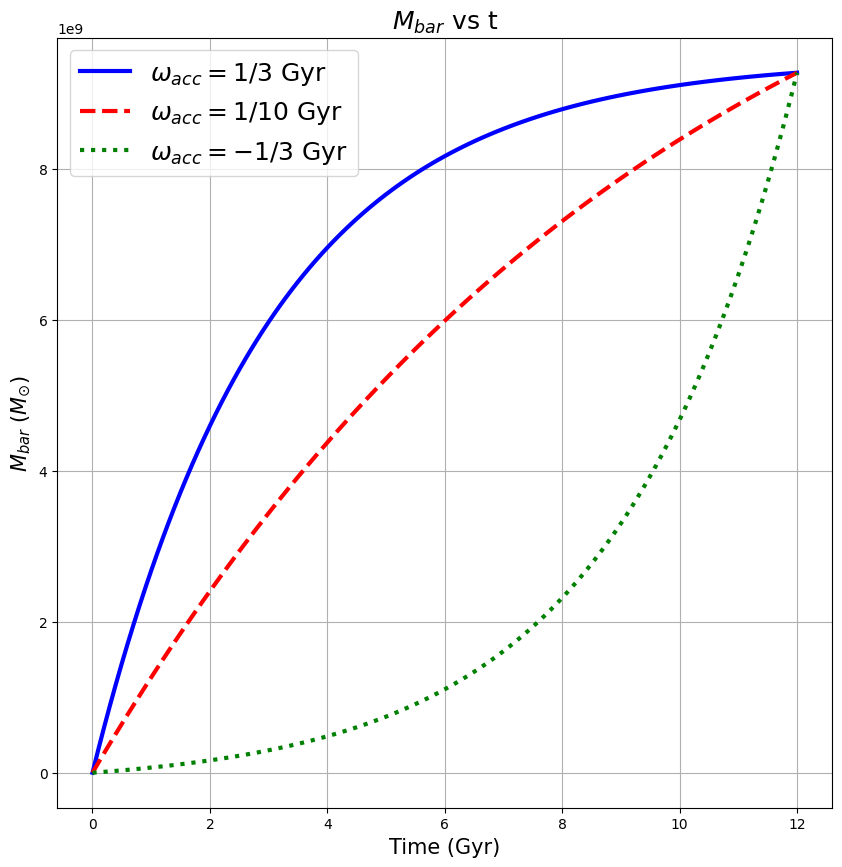

Execution time: 0.1877 seconds


In [7]:
dt=0.1
M_times = np.arange(0,12.1,dt)

def C_def(M_bar, t_acc, t0=12.):
    """Returns the normalization constant by imposing a value of the baryonic mass at a given
    time and accretion timescale. Default time is taken as today, t_0 = 12Gyr."""
    if (t_acc==np.inf):
        return M_bar/t0
    elif (t_acc<0):
        return M_bar/(abs(t_acc)*(np.exp(t0/abs(t_acc))-1))
    else:
        return M_bar/(t_acc*(1-np.exp(-t0/t_acc)))

def M_def(M_bar, t_acc, t=M_times, dt=dt):
    """Returns the baryonic mass predicted from the accreting mass having an exponential form in time."""
    C = C_def(M_bar, t_acc)
    if (t_acc==np.inf):
        return C*t
    elif (t_acc<0):
        return C*abs(t_acc)*(np.exp(t/abs(t_acc))-1)
    else:
        return C*t_acc*(1-np.exp(-t/t_acc))

t_acc = np.array([3.,10.,-3.]) #GYr
colors = ['b', 'r', 'g']
styles = ['solid', 'dashed', 'dotted']

M_bar_t0 = 9.27e9
M_bar_array = np.zeros((len(t_acc),len(M_times)))
for i, t_accr in enumerate(t_acc):
    M_bar_array[i] = M_def(M_bar_t0, t_accr)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    frame.plot(M_times, M_bar_array[i], label = fr"$\omega_{{acc}} = {Fraction(1,int(t_accr))}$ Gyr", color=col, linestyle=sty, lw=3)
frame.set_title(r"$M_{bar}$ vs t", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
pd.DataFrame(M_bar_array.T, columns=['t_acc=3Gyr', 't_acc=10Gyr', 't_acc=25Gyr']).to_csv('../data/data9_JAX_aKSL/M_bar_vs_'+f'{np.log10(M_bar_t0)}'+'.csv')
fig.savefig('../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation).png')

### a) i) Find $v_{BTFR}$ from $M_{bar}$ (constant in time)

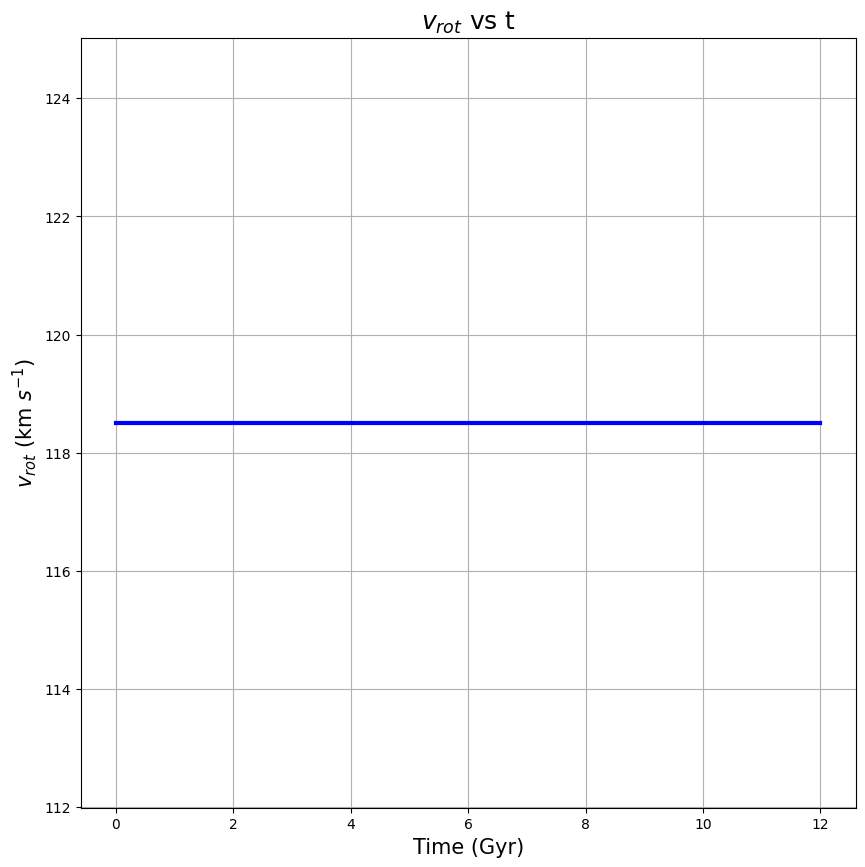

Execution time: 0.0531 seconds


In [8]:
def v_btfr_def(M_bar, Ag=47):
    """Returns the value of the velocity from the baryonic Tully-Fisher relation. The default constant
    value Ag is taken from McGaugh (2012)."""
    return (M_bar/Ag)**0.25

Ag = 47 #M_{\odot} km^{-4} s^{-4}
M_bar_allsame = np.full(M_bar_array[0].shape, M_bar_t0)
v_btfr_array = v_btfr_def(M_bar_allsame)
#print(v_rot_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, v_btfr_array, color="blue", lw=3)
frame.set_title(r"$v_{rot}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$v_{rot}$ (km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/v_rot_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', v_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/v_btfr vs time (t_acc variation).png')

### b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$

In [9]:
def j_maxer(Mbar):
    """Returns the maximum value of the accreting angular momentum. This is determined empirically, by 
    utilizing the fit found by Mancera-Piña et al. (2021), and setting f_gas = 1. This is because the
    theoretical maximum accreting angular momentum should fall where there is maximum gas, in the outer-most
    regions of the galaxy."""
    return (Mbar**0.73)*10**(-4.25)

j_max = (M_bar_t0**0.73)*10**(-4.25)
print(j_max)

1061.6178348386752
Execution time: 0.0005 seconds


### c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$


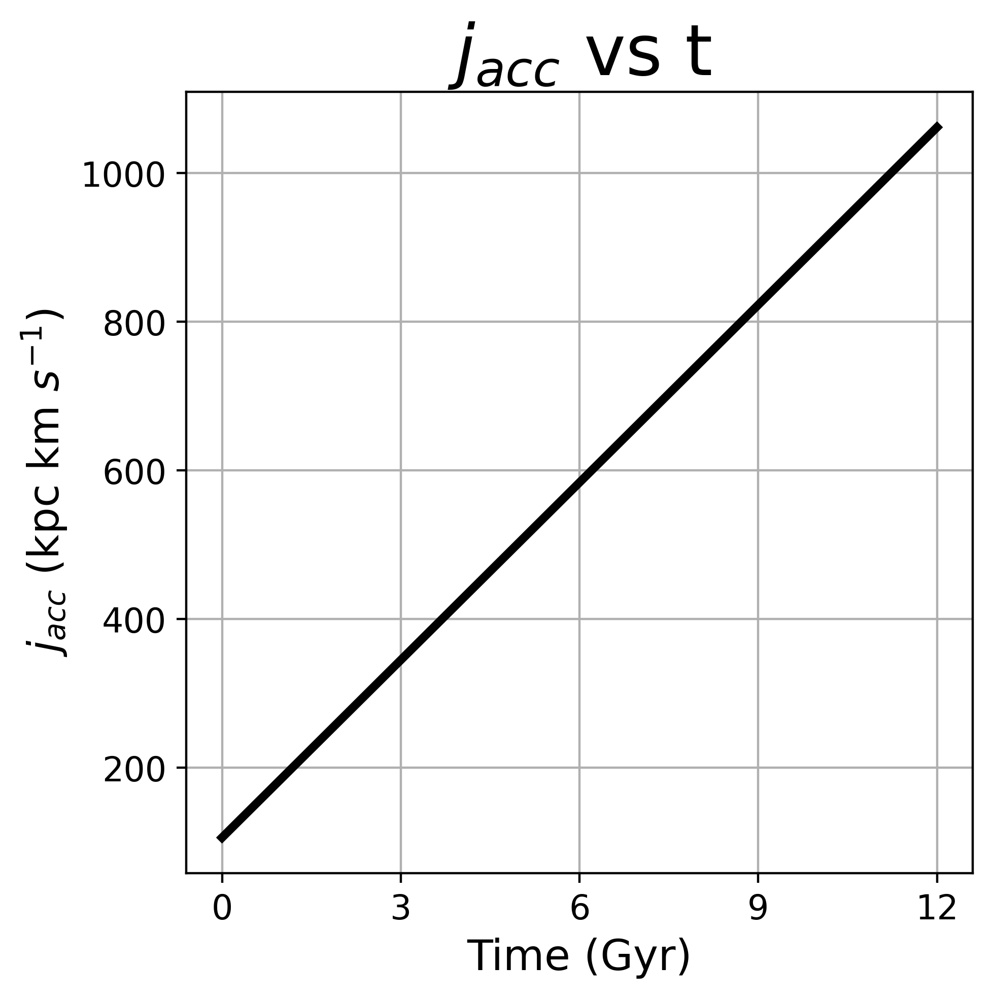

Execution time: 0.1356 seconds


In [10]:
def j_acc_def(j_max, t, t0=12, n=1, con=1, lambda_ratio=1.0):
    """Determines the accreting specific angular momentum given j_max, the velocity from the BTFR, at any
    given time. The minimum angular momentum is determined by dividing j_max by 10,
    then scaled by lambda_ratio to account for halo spin parameter scatter.
    
    lambda_ratio: ratio of this halo's λ to the median λ (default=1.0, i.e., median spin)
    """
    j_min = (j_max/10.)*lambda_ratio
    return j_min+(con*j_max-j_min)*(t/t0)**n

ki=1
j_acc_array = j_acc_def(j_max, M_times, con=ki)

fig = figure(figsize=(5,5), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, j_acc_array, color="k", lw=3)
frame.set_title(r"$j_{acc}$ vs t", fontsize = 25)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{acc}$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.tick_params(labelsize=12)
frame.set_xticks([0, 3, 6, 9, 12])
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/j_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', j_acc_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/j_acc vs time (t_acc variation).png')

### d) Determine $r_{BTFR}(t)$ from $j_{acc}(t) = 2v_{flat} \left( r_{acc} - \frac{R_v^3 r_{acc}}{(R_v+r_{acc})^3} \right)$

In [11]:

def rv_def(M_bar, kpc=True):
    if kpc:
        return -0.005034150233993362*v_btfr_def(M_bar)+2.6658196850679956
    else:
        return -5.034150233993362*v_btfr_def(M_bar)+2665.8196850679956

rv_def(10**10)

2.0578223054087963

Execution time: 0.0010 seconds


In [12]:
def interp1d_jax(x_grid, y_grid, x):
    """
    Simple linear interpolation in JAX, assuming x_grid is 1D and sorted.
    Extrapolation: clamp slope using the edge segments.
    """
    x_grid = jnp.asarray(x_grid)
    y_grid = jnp.asarray(y_grid)

    # Find index i so that x_grid[i] <= x < x_grid[i+1]
    idx = jnp.searchsorted(x_grid, x, side="right") - 1
    idx = jnp.clip(idx, 0, x_grid.size - 2)

    x0 = x_grid[idx]
    x1 = x_grid[idx + 1]
    y0 = y_grid[idx]
    y1 = y_grid[idx + 1]

    w = (x - x0) / (x1 - x0)
    return y0 + w * (y1 - y0)

Execution time: 0.0005 seconds


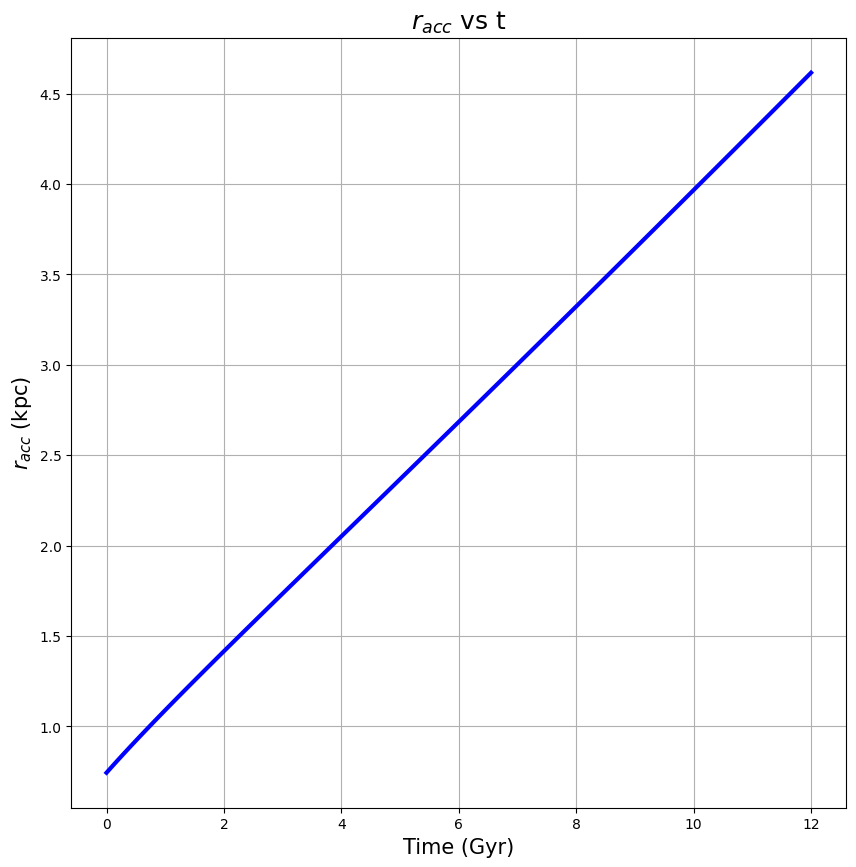

Execution time: 0.1091 seconds


In [13]:
def analytical_r(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def r_btfr_def(M_bar, j_acc, init=1.0):
    
    rv = rv_def(M_bar, kpc=True)
    yer = j_acc / (2*v_btfr_def(M_bar))
    if hasattr(yer, '__len__'):
        r_acc = []
        for i in range(len(j_acc)):
            r_acc.append(optimize.newton(analytical_r, init, args=(rv[i], yer[i])))
        return np.array(r_acc)
    else:
        return optimize.newton(analytical_r, init, args=(rv, yer))

r_btfr_array = r_btfr_def(M_bar_allsame, j_acc_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, r_btfr_array, color="blue", lw=3)
frame.set_title(r"$r_{acc}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{acc}$ (kpc)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data9_JAX_aKSL/r_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', r_btfr_array)
fig.savefig('../outputs/graphs10_JAX_aKSL/r_acc vs time (t_acc variation).png')

### e) Analytical $j_{bar}$

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/3087275908.py:5: RuntimeWarning: divide by zero encountered in divide
  return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass


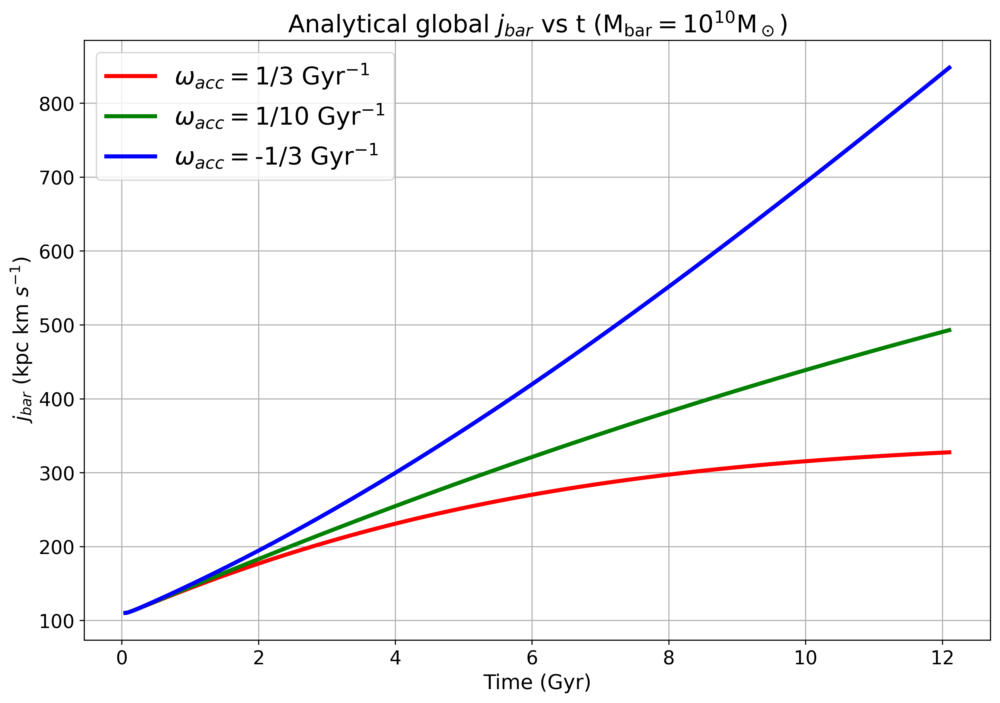

Execution time: 0.4543 seconds


In [14]:
def j_bar_analytical(t, Mbar, t_acc, dt=0.1):
    bar_mass = M_def(Mbar, t_acc, t)
    M_dot_bar = C_def(Mbar, t_acc)*np.exp(-t/t_acc)
    acc_j = j_acc_def(j_maxer(Mbar), t)
    return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass

colorz = ['r', 'g', 'b']
stylez = ['dashed', 'dotted', 'solid']

M_times1 = np.arange(0,12.2,0.1)
M_times2 = np.arange(0, 12.101, 0.001)
j_bar_array_analytical = np.zeros((len(t_acc),len(M_times2)))
for i, t_accr in enumerate(t_acc):
    j_bar_array_analytical[i] = j_bar_analytical(M_times2, M_bar_t0, t_accr, dt=0.001)
    
fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colorz, stylez):
    frame.plot(M_times2[53:], j_bar_array_analytical[i][53:], label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
frame.set_title(r"Analytical global $j_{bar}$ vs t ($\mathrm{M}_{\mathrm{bar}}=10^{10}\mathrm{M}_\odot$)", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/Analytical j_bar vs time (t_acc variation).png')

np.savetxt('data7/j_bar_analytical (-3)', j_bar_array_analytical[-1])

### f) $\Omega$

In [15]:
def exp_vrot(r, Mbar, kpc=False):
    rv = rv_def(Mbar, kpc=kpc)
    return v_btfr_def(Mbar)*(1-np.exp(-r/rv))

def exp_vrot_jax(r_pc, M_bar):
    rv = rv_def(M_bar, kpc=False)
    return v_btfr_def(M_bar) * (1.0 - jnp.exp(-r_pc / rv))

def omega(R, M_bar, rv):
    if hasattr(R, '__len__'):
        omega_list = []
        for r in R:
            if r == 0:
                omega_list.append(v_btfr_def(M_bar)/rv)
            else:
                omega_list.append((v_btfr_def(M_bar)*(1-np.exp(-r/rv)))/r)

        return np.array(omega_list)
    else:
        if R == 0:
            return v_btfr_def(M_bar)/rv
        else:
            return (v_btfr_def(M_bar)*(1-np.exp(-R/rv)))/R
        
@jax.jit
def omega_kms_per_pc_jax(R_pc, Mbar):
    """
    Units: (km/s)/pc
    """
    R_pc = jnp.asarray(R_pc)

    v0 = v_btfr_def(Mbar)
    rv_pc = rv_def(Mbar, kpc=False)

    vR = exp_vrot_jax(R_pc, Mbar)

    return jnp.where(R_pc == 0.0, v0/rv_pc, vR/R_pc)

r = np.arange(0,1000*100.1,120)
M_bar_allsame1 = np.full(M_times1.shape, M_bar_t0)
# omegas = omega(r, M_bar_t0, rv_def(M_bar_t0, kpc=False))
#print(omegas)

Execution time: 0.0020 seconds


In [16]:
def find_nearest(array, value):
    """
    Finds nearest element in an array with wanted value
    
    Inputs:
    array(np.array): array to extract closest element to wanted value
    value(int): wanted value to find closest element to
    
    Returns:
    array[idx](np.array): indexed array with index of closest value
    """
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

index_r1 = np.argwhere(r == find_nearest(r, 25000.))[0][0]
index_r2 = np.argwhere(r == find_nearest(r, 50000.))[0][0]
index_r3 = np.argwhere(r == find_nearest(r, 75000.))[0][0]
index_r4 = np.argwhere(r == find_nearest(r, 100000.))[0][0]
index_r5 = np.argwhere(r == find_nearest(r, 60000.))[0][0]

Execution time: 0.0024 seconds


### g) $r_{acc}$ Matrix

In [17]:
M_times1_jax = jnp.array(M_times1, dtype=jnp.float64)
log_M_bar_array = np.linspace(8.0, 11.5, 50)
t_end = float(M_times1[-1])
n_t = M_times1_jax.shape[0]
log_M_bar_array_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.0489 seconds


In [18]:
log_M_bar_array = np.linspace(8,11.5,50)
j_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))

for i, Mbar_value in enumerate(log_M_bar_array):
    j_acc_matrix[i] = j_acc_def(j_maxer(10**Mbar_value), M_times1)
    
print(j_acc_matrix)

[[3.89045145e+00 4.18223531e+00 4.47401917e+00 ... 3.86127306e+01
  3.89045145e+01 3.91962984e+01]
 [4.38674972e+00 4.71575595e+00 5.04476218e+00 ... 4.35384910e+01
  4.38674972e+01 4.41965034e+01]
 [4.94635992e+00 5.31733691e+00 5.68831391e+00 ... 4.90926222e+01
  4.94635992e+01 4.98345762e+01]
 ...
 [1.09828306e+03 1.18065429e+03 1.26302552e+03 ... 1.09004594e+04
  1.09828306e+04 1.10652018e+04]
 [1.23838916e+03 1.33126835e+03 1.42414754e+03 ... 1.22910124e+04
  1.23838916e+04 1.24767708e+04]
 [1.39636836e+03 1.50109599e+03 1.60582362e+03 ... 1.38589560e+04
  1.39636836e+04 1.40684112e+04]]
Execution time: 0.0008 seconds


r_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times1)))
for i, Mbar_value in enumerate(log_M_bar_array):
    r_acc_matrix[i] = r_btfr_def(np.full(M_times1.shape, 10**Mbar_value), j_acc_matrix[i])

np.savetxt('../data/data9_JAX_aKSL/r_acc_matrix_'+f'{np.log10(M_bar_t0)}'+'.txt', r_acc_matrix)

print(r_acc_matrix.shape)
r_acc_matrix

r_acc_interpolators = np.array([
    spl.interp1d(M_times1, r_acc_matrix[Mbar_index, :], fill_value="extrapolate")
    for Mbar_index in range(r_acc_matrix.shape[0])
])

print(r_acc_interpolators.shape)

In [19]:
seed = 42
key = random.PRNGKey(seed)

# Fixed λ ratios: 5 values uniformly spaced in log-space within ±1σ (σ_ln(λ) ≈ 0.5)
LAMBDA_OFFSETS = np.array([-0.5, -0.25, 0.0, 0.25, 0.5])  # ln(λ) offsets
LAMBDA_RATIOS = np.exp(LAMBDA_OFFSETS)  # [0.607, 0.779, 1.0, 1.284, 1.649]
N_LAMBDA = len(LAMBDA_RATIOS)

# def build_r_acc_matrix_for_all_M(ns, ks, seed=None, sigma_lambda=0.5756):
#     """
#     Build r_acc(M_bar, t) with optional λ scatter.
    
#     Parameters:
#     -----------
#     seed : int or None
#         Random seed for λ draws. If None, no scatter (lambda_ratio=1 for all).
#     sigma_lambda : float
#         Scatter in ln(λ), default 0.25*ln(10) from sigma_log lambda = 0.25.
#     """
#     n_M = len(log_M_bar_array)
#     n_t = len(M_times1)
#     r_acc_matrix = np.zeros((n_M, n_t), dtype=float)

#     # Draw λ ratios if seed provided
#     if seed is not None:
#         rng = np.random.default_rng(seed)
#         lambda_ratios = np.exp(sigma_lambda * rng.standard_normal(n_M))
#     else:
#         lambda_ratios = np.ones(n_M)

#     for i, logM in enumerate(log_M_bar_array):
#         Mbar = 10.0**logM
#         j_max = j_maxer(Mbar)
#         j_acc = j_acc_def(j_max, M_times1, n=ns, con=ks, lambda_ratio=lambda_ratios[i])
#         r_acc = r_btfr_def(np.full_like(j_acc, Mbar), j_acc)
#         r_acc_matrix[i, :] = r_acc

#     return r_acc_matrix

def build_r_acc_matrix_for_all_M(ns, ks, seed=None, sigma_lambda=0.5756):
    """
    Build r_acc(M_bar, t) on the same time grid M_times1 and mass grid log_M_bar_array.
    
    Returns: numpy array of shape (len(log_M_bar_array), len(M_times1)) in kpc.
    """
    n_M = len(log_M_bar_array)
    n_t = len(M_times1)
    r_acc_matrix = np.zeros((n_M, n_t), dtype=float)

    for i, logM in enumerate(log_M_bar_array):
        Mbar = 10.0**logM
        j_max = j_maxer(Mbar)
        j_acc = j_acc_def(j_max, M_times1, n=ns, con=ks)
        r_acc = r_btfr_def(np.full_like(j_acc, Mbar), j_acc)
        r_acc_matrix[i, :] = r_acc

    return r_acc_matrix

def build_r_acc_matrix_for_all_M_lambda(ns, ks):
    """
    Build r_acc(M_bar, λ, t) with 5 fixed λ values per mass.
    
    Uses 5 λ ratios uniformly spaced in log-space within ±1σ:
    λ_ratio = exp([-0.5, -0.25, 0, 0.25, 0.5]) ≈ [0.61, 0.78, 1.0, 1.28, 1.65]
    
    Parameters:
    -----------
    ns : float
        Power parameter n for j_acc(t).
    ks : float
        Slope parameter k for j_acc(t).
    
    Returns:
    --------
    r_acc_matrix : ndarray, shape (n_M, n_lambda, n_t)
        3D array of accretion radii for all (mass, λ, time) combinations.
    """
    n_M = len(log_M_bar_array)
    n_t = len(M_times1)
    r_acc_matrix = np.zeros((n_M, N_LAMBDA, n_t), dtype=float)
    
    for i, logM in enumerate(log_M_bar_array):
        Mbar = 10.0**logM
        j_max = j_maxer(Mbar)
        for j, lambda_ratio in enumerate(LAMBDA_RATIOS):
            j_acc = j_acc_def(j_max, M_times1, n=ns, con=ks, lambda_ratio=lambda_ratio)
            r_acc = r_btfr_def(np.full_like(j_acc, Mbar), j_acc)
            r_acc_matrix[i, j, :] = r_acc

    return r_acc_matrix


def r_acc_factory(t_grid_gyr, nl, kl):
    """
    Returns a function factory(Mbar, ns, ks) -> r_acc_interp(t) in *kpc*,
    implementing j_acc(t) = j_min + ks*(j_max - j_min) * (t/t0)**ns.
    Here j_min=0 (disc center), j_max computed from j(r) out to Rmax_kpc.
    """

    log_M_bar_array = np.linspace(8,11.5,50)
    j_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))

    for i, Mbar_value in enumerate(log_M_bar_array):
        j_acc_matrics[i] = j_acc_def(j_maxer(10**Mbar_value), t_grid_gyr, n=nl, con=kl)
        
    # def _solve_row(args):
    #     i, Mbar_value = args
    #     return r_btfr_def(np.full(t_grid_gyr.shape, 10.0**Mbar_value), j_acc_matrics[i])

    # with ProcessPoolExecutor() as ex:
    #     rows = list(ex.map(_solve_row, enumerate(log_M_bar_array)))
        
    # r_acc_matrics = np.vstack(rows)
        
    r_acc_matrics = np.zeros((len(log_M_bar_array), len(t_grid_gyr)))
    for i, Mbar_value in enumerate(log_M_bar_array):
        r_acc_matrics[i] = r_btfr_def(np.full(t_grid_gyr.shape, 10**Mbar_value), j_acc_matrics[i])
    
    return np.array([spl.interp1d(t_grid_gyr, r_acc_matrics[Mbar_index, :], fill_value="extrapolate") for Mbar_index in range(r_acc_matrics.shape[0])])

Execution time: 0.0280 seconds


In [20]:
# JAX-ified r_acc utilities for vectorized/sharded MCMC
def analytical_r_jax(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def analytical_r_prime_jax(x, c):
    return 1.0 - (c**3 * (c - 2.0 * x)) / (c + x)**4

def newton_solve_r_jax(c, y, x0=1.0, n_iter=30):
    def body(_, x):
        f = analytical_r_jax(x, c, y)
        fp = analytical_r_prime_jax(x, c)
        fp = jnp.where(jnp.abs(fp) < 1e-12, jnp.sign(fp) * 1e-12, fp)
        x_new = x - f / fp
        return jnp.where(jnp.isfinite(x_new), x_new, x)
    return jax.lax.fori_loop(0, n_iter, body, jnp.asarray(x0, dtype=jnp.float64))

def r_btfr_def_jax(M_bar, j_acc, init=1.0, n_iter=30):
    rv = rv_def(M_bar, kpc=True)
    y = j_acc / (2.0 * v_btfr_def(M_bar))
    solve_one = lambda y_val: newton_solve_r_jax(rv, y_val, x0=init, n_iter=n_iter)
    return jax.vmap(solve_one)(y)

# @partial(jax.jit, static_argnames=('sigma_lambda',))
# def build_r_acc_matrix_for_all_M_jax(ns, ks, key, sigma_lambda=0.5756):
#     Mbar = 10.0 ** log_M_bar_array_jax
#     n_masses = len(log_M_bar_array_jax)
#     if key is not None:
#         lambda_ratios = jnp.exp(sigma_lambda * jax.random.normal(key, shape=(n_masses,)))
#     else:
#         lambda_ratios = jnp.ones(n_masses)
#     def per_mass(Mbar_val, lambda_ratio):
#         j_max = j_maxer(Mbar_val)
#         j_acc = j_acc_def(j_max, M_times1_jax, n=ns, con=ks, lambda_ratio=lambda_ratio)
#         r_acc = r_btfr_def_jax(Mbar_val, j_acc, init=1.0, n_iter=30)
#         return r_acc
#     return jax.vmap(per_mass)(Mbar, lambda_ratios)

@jax.jit
def build_r_acc_matrix_for_all_M_jax(ns, ks, key, sigma_lambda=0.5756):
    Mbar = 10.0 ** log_M_bar_array_jax
    def per_mass(Mbar_val):
        j_max = j_maxer(Mbar_val)
        j_acc = j_acc_def(j_max, M_times1_jax, n=ns, con=ks)
        r_acc = r_btfr_def_jax(Mbar_val, j_acc, init=1.0, n_iter=30)
        return r_acc
    return jax.vmap(per_mass)(Mbar)

# JAX λ ratios (same as numpy version)
LAMBDA_RATIOS_JAX = jnp.exp(jnp.array([-0.5, -0.25, 0.0, 0.25, 0.5]))  # [0.607, 0.779, 1.0, 1.284, 1.649]

@jax.jit
def build_r_acc_matrix_for_all_M_lambda_jax(ns, ks):
    """
    Build r_acc(M_bar, λ, t) with 5 fixed λ values per mass (JAX version).

    Uses 5 λ ratios uniformly spaced in log-space within ±1σ:
    λ_ratio = exp([-0.5, -0.25, 0, 0.25, 0.5]) ≈ [0.61, 0.78, 1.0, 1.28, 1.65]

    Parameters:
    -----------
    ns : float
        Power parameter n for j_acc(t).
    ks : float
        Slope parameter k for j_acc(t).

    Returns:
    --------
    r_acc_matrix : jnp.ndarray, shape (n_M, n_lambda, n_t)
        3D array of accretion radii for all (mass, λ, time) combinations.
    """
    Mbar = 10.0 ** log_M_bar_array_jax

    def per_mass_lambda(Mbar_val, lambda_ratio):
        j_max = j_maxer(Mbar_val)
        j_acc = j_acc_def(j_max, M_times1_jax, n=ns, con=ks, lambda_ratio=lambda_ratio)
        r_acc = r_btfr_def_jax(Mbar_val, j_acc, init=1.0, n_iter=30)
        return r_acc

    def per_mass(Mbar_val):
        # For each mass, compute r_acc for all 5 λ values
        return jax.vmap(lambda lr: per_mass_lambda(Mbar_val, lr))(LAMBDA_RATIOS_JAX)

    # vmap over masses: returns shape (n_masses, n_lambda, n_times)
    return jax.vmap(per_mass)(Mbar)


Execution time: 0.0211 seconds


In [21]:
# run r_acc_factory with different n and k values to generate different r_acc interpolators; construct matrix of r_acc_interpolators that is 3D, with shape (len(n_values), len(k_values), len(log_M_bar_array))

n_values = [0.5, 1.0, 1.5]
k_values = [0.5, 1.0, 1.5, 2.0]

# RUN THIS CELL ONLY ONCE TO SAVE THE r_acc_interpolators_matrix TO A FILE
run = False
if run:
    r_acc_interpolators_matrix = np.zeros((len(n_values), len(k_values), len(log_M_bar_array)), dtype=object)
    for i, n_val in enumerate(n_values):
        for j, k_val in enumerate(k_values):
            r_acc_interpolators_matrix[i, j] = r_acc_factory(n_val, k_val)
            
    r_acc_interpolator_lower_res = r_acc_interpolators_matrix[2, 1]

    np.save(f'../data/data9_JAX_aKSL/r_acc_interpolators_matrix_nk_values_{np.log10(M_bar_t0)}.npy', r_acc_interpolators_matrix)

Execution time: 0.0005 seconds


print(r_acc_interpolators_matrix.shape)
r_acc_interpolators_matrix

In [22]:
r_acc_matrix_np = build_r_acc_matrix_for_all_M(1., 1., seed=seed) # numpy
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

Execution time: 0.1422 seconds


## 2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from (1)

In [23]:
Rf = 0.3
threshold_sigma_SFR = 0.9493446421959616

def SFL(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)

    # Enforce physical domain: negative gas is set 0
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFL_val = (1 - Rf) * A * (sigma_pos**N)

    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        SFL_val = (1 - Rf) * A_ksl * (sigma_pos**N_ksl)

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFL_val = ((1 - Rf)
                    * A_boissier
                    * (sigma_pos**N_boissier)
                    * omega(R, Mbar, rv_def(Mbar, kpc=False))
                    * 1022.0)  # km/s/pc → 1/Gyr

    elif sfl_type == "cutoff_ksl":
        thr = threshold_sigma_SFR

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg  = (1 - Rf) * 1.59e-3 * (sigma_pos**3.25)
        high_reg = (1 - Rf) * 6.68e-2 * (sigma_pos**1.54)

        SFL_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFL_val = np.where(np.isfinite(SFL_val), SFL_val, 0.0)

    if np.isscalar(sigma):
        return float(SFL_val)
    return SFL_val

def SFL_jax(sigma, sfl_type, R, Mbar):
    Rf = 0.3
    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        return (1.0 - Rf) * A * (sigma**N)
    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        return (1.0 - Rf) * A_ksl * (sigma**N_ksl)
    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        Omega_Gyr = omega_kms_per_pc_jax(R, Mbar) * 1022.712165
        return (1.0 - Rf) * A_boissier * (sigma**N_boissier) * Omega_Gyr
    elif sfl_type == "cutoff_ksl":
        # piecewise, same as your cutoff KSL
        log_sigma = jnp.log10(jnp.clip(sigma, a_min=1e-99))  # just to avoid log(0), not a floor on sigma itself
        A1, N1 = 1.59e-3, 3.25
        A2, N2 = 6.68e-2, 1.54
        cond = log_sigma < threshold_sigma_SFR
        sfl1 = (1.0 - Rf) * A1 * (sigma**N1)
        sfl2 = (1.0 - Rf) * A2 * (sigma**N2)
        return jnp.where(cond, sfl1, sfl2)
    else:
        raise ValueError(f"Unknown sfl_type '{sfl_type}' in SFL_jax")

def SFE(sigma, sfl_type, R, Mbar):
    sigma_arr = np.asarray(sigma, dtype=float)
    sigma_pos = np.where(sigma_arr > 0.0, sigma_arr, 0.0)

    if sfl_type == "old_ksl":
        N = 1.54
        A = 6.68e-2
        SFE_val = A * (sigma_pos**(N - 1.0))

    elif sfl_type == "new_ksl":
        A_ksl = 1.59e-3
        N_ksl = 3.25
        SFE_val = A_ksl * (sigma_pos**(N_ksl - 1.0))

    elif sfl_type == "boissier":
        A_boissier = 5.74e-4
        N_boissier = 2.14
        SFE_val = (A_boissier
                   * (sigma_pos**(N_boissier - 1.0))
                   * omega(R, Mbar, rv_def(Mbar, kpc=False))
                   * 1022.0)

    elif sfl_type == "cutoff_ksl":
        thr = threshold_sigma_SFR

        with np.errstate(divide='ignore', invalid='ignore'):
            log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

        mask = log_sigma < thr

        low_reg = 1.59e-3 * (sigma_pos**(3.25 - 1.0))
        high_reg = 6.68e-2 * (sigma_pos**(1.54 - 1.0))

        SFE_val = np.where(mask, low_reg, high_reg)

    else:
        raise ValueError(f"Unknown sfl_type: {sfl_type}")

    SFE_val = np.where(np.isfinite(SFE_val), SFE_val, 0.0)

    if np.isscalar(sigma):
        return float(SFE_val)
    return SFE_val

Execution time: 0.0027 seconds


In [24]:
def get_dt_params_from_r_acc(r_acc_vec, times, t_acc=None):
    # Factor 1: r_acc change rate
    dr_rel = (r_acc_vec[1] - r_acc_vec[0]) / jnp.maximum(r_acc_vec[0], 1e-10)
    dt_early = times[1] - times[0]
    rate = jnp.abs(dr_rel) / jnp.maximum(dt_early, 1e-10)
    scale_r = 1.0 / (1.0 + (rate / 5.0)**1.5)
    
    base_dt = 0.01 + 0.09 * scale_r
    dt_min = 1e-4 + (1e-3 - 1e-4) * scale_r
    safety = 5.0 - 3.0 * scale_r
    
    # Factor 2: t_acc magnitude (small t_acc = fast dynamics)
    # ensure dt < t_acc
    if t_acc is not None:
        abs_t_acc = jnp.abs(t_acc)
        base_dt = jnp.minimum(base_dt, 0.5 * abs_t_acc)
        base_dt = jnp.maximum(base_dt, 1e-5)  # floor
        dt_min = jnp.minimum(dt_min, 0.05 * abs_t_acc)
        dt_min = jnp.maximum(dt_min, 1e-7)
    
    return base_dt, dt_min, safety


# Test the function with different n AND t_acc values
print("Testing get_dt_params_from_r_acc with r_acc change AND t_acc:")
print("-" * 70)

times_test = M_times1_jax

# Test different combinations of n (affects r_acc change) and t_acc
print("\nEffect of n (r_acc change rate) with t_acc=1.0 Gyr (normal):")
for n_test in [0.5, 0.75, 1.0, 1.5, 2.0]:
    j_min_test, j_max_test = 100.0, 2000.0
    j_acc_test = j_min_test + (j_max_test - j_min_test) * (times_test / 12.0) ** n_test
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=1.0)
    dr_rel = (r_acc_test[1] - r_acc_test[0]) / r_acc_test[0] * 100
    print(f"  n={n_test}: dr_rel={dr_rel:6.1f}% | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

print("\nEffect of t_acc with n=1.0 (slow r_acc change):")
for t_acc_test in [0.007, 0.01, 0.033, 0.05, 0.1, 0.5, 1.0, 5.0]:
    j_acc_test = 100.0 + (2000.0 - 100.0) * (times_test / 12.0) ** 1.0
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=t_acc_test)
    omega = 1.0/t_acc_test
    print(f"  t_acc={t_acc_test:.3f} Gyr (omega={omega:6.1f}) | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

print("\nCombined: n=0.5 (fast r_acc) + small t_acc:")
for t_acc_test in [0.007, 0.033, 0.1, 1.0]:
    j_acc_test = 100.0 + (2000.0 - 100.0) * (times_test / 12.0) ** 0.5
    r_acc_test = (j_acc_test / (200.0 * 1.33)) ** 0.5
    
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_test, times_test, t_acc=t_acc_test)
    dr_rel = (r_acc_test[1] - r_acc_test[0]) / r_acc_test[0] * 100
    omega = 1.0/t_acc_test
    print(f"  n=0.5, t_acc={t_acc_test:.3f} (omega={omega:6.1f}) | base_dt={base_dt:.5f}, dt_min={dt_min:.2e}, safety={safety:.2f}")

Testing get_dt_params_from_r_acc with r_acc change AND t_acc:
----------------------------------------------------------------------

Effect of n (r_acc change rate) with t_acc=1.0 Gyr (normal):
  n=0.5: dr_rel=  65.4% | base_dt=0.04608, dt_min=4.61e-04, safety=3.80
  n=0.75: dr_rel=  23.5% | base_dt=0.07812, dt_min=7.81e-04, safety=2.73
  n=1.0: dr_rel=   7.6% | base_dt=0.09494, dt_min=9.49e-04, safety=2.17
  n=1.5: dr_rel=   0.7% | base_dt=0.09984, dt_min=9.98e-04, safety=2.01
  n=2.0: dr_rel=   0.1% | base_dt=0.10000, dt_min=1.00e-03, safety=2.00

Effect of t_acc with n=1.0 (slow r_acc change):
  t_acc=0.007 Gyr (omega= 142.9) | base_dt=0.00350, dt_min=3.50e-04, safety=2.17
  t_acc=0.010 Gyr (omega= 100.0) | base_dt=0.00500, dt_min=5.00e-04, safety=2.17
  t_acc=0.033 Gyr (omega=  30.3) | base_dt=0.01650, dt_min=9.49e-04, safety=2.17
  t_acc=0.050 Gyr (omega=  20.0) | base_dt=0.02500, dt_min=9.49e-04, safety=2.17
  t_acc=0.100 Gyr (omega=  10.0) | base_dt=0.05000, dt_min=9.49e-04, sa

In [25]:
def sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec):
    r_acc = 1000.0 * interp1d_jax(M_times1_jax, r_acc_vec, t)   # kpc -> pc like your code
    return (C / (2.0 * jnp.pi * r_acc**2.0)) * jnp.exp(-t / t_acc) * jnp.exp(-r_value / r_acc)

def choose_dt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec,
                  base_dt=0.1, dt_min=1e-3, safety=2.0):
    S = jnp.asarray(S)

    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)

    t_sup = jnp.where((S > 0.0) & (Sigma_acc > 0.0), S / Sigma_acc, jnp.inf)
    t_dep = jnp.where((S > 0.0) & (Sigma_sfr > 0.0), S / Sigma_sfr, jnp.inf)

    t_char = jnp.minimum(t_sup, t_dep)
    dt_raw = jnp.minimum(base_dt, t_char/safety)
    dt_raw = jnp.maximum(dt_raw, dt_min)

    # if Sigma == 0, just use base_dt (like your "both timescales inf" case)
    dt = jnp.where(S <= 0.0, base_dt, dt_raw)
    return dt

def dydt_jax(t, S, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    Sigma_acc = sigma_acc_jax(t, r_value, C, t_acc, r_acc_vec)
    Sigma_sfr = SFL_jax(S, sfl_type, r_value, M_bar)
    return Sigma_acc - Sigma_sfr

def RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec):
    k1 = dydt_jax(t,            S,             r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k2 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k1, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k3 = dydt_jax(t + 0.5*dt,   S + 0.5*dt*k2, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)
    k4 = dydt_jax(t + dt,       S + dt*k3,     r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

    S_new = S + (dt/6.0)*(k1 + 2.0*k2 + 2.0*k3 + k4)
    t_new = t + dt
    S_new = jnp.maximum(S_new, 0.0)  # just clip tiny negatives
    return t_new, S_new

@partial(jax.jit, static_argnames=("sfl_type",))
def compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc, sfl_type,
                    r_acc_matrix_for_all_M):
    """
    JAX version of compute_row that matches your adaptive RK logic:
    - row[0] = 0 at t=0
    - adaptive dt (now inferred from r_acc_vec behavior)
    - linear interpolation onto M_times1_jax grid
    """
    r_acc_vec = r_acc_matrix_for_all_M[Mbar_index]  # shape (n_t,)
    
    # Get adaptive timestep parameters based on how rapidly r_acc changes
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_vec, M_times1_jax, t_acc=t_acc)

    # initial state
    t0 = 0.0
    S0 = 0.0
    row0 = jnp.zeros(n_t, dtype=jnp.float64).at[0].set(S0)
    save_idx0 = 1  # we already set index 0

    state0 = (t0, S0, save_idx0, row0)

    def cond_fun(state):
        t, S, save_idx, row = state
        return jnp.logical_and(t < t_end, save_idx < n_t)

    def body_fun(state):
        t, S, save_idx, row = state

        dt = choose_dt_jax(t, S, r_value, C, t_acc, M_bar,
                           sfl_type, r_acc_vec,
                           base_dt=base_dt, dt_min=dt_min, safety=safety)

        t_new, S_new = RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

        # pack everything to pass into lax.cond
        carry = (t, S, t_new, S_new, save_idx, row)

        def save_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            t_grid = M_times1_jax[idx]
            denom = jnp.maximum(t_n - t_old, 1e-12)
            theta = (t_grid - t_old) / denom
            S_grid = S_old + theta * (S_n - S_old)
            row_i = row_i.at[idx].set(S_grid)
            return (t_n, S_n, t_n, S_n, idx + 1, row_i)

        def nosave_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            return (t_n, S_n, t_n, S_n, idx, row_i)

        cond_save = jnp.logical_and(
            save_idx < n_t,
            t_new >= M_times1_jax[save_idx]
        )

        t2, S2, _t2, _S2, save_idx2, row2 = lax.cond(cond_save, save_branch, nosave_branch, carry)
        return (t2, S2, save_idx2, row2)

    t_f, S_f, save_idx_f, row_f = lax.while_loop(cond_fun, body_fun, state0)

    # If for some reason we stopped before filling all times, copy last value forward
    def fill_rest(row):
        last_val = row[save_idx_f-1]
        idxs = jnp.arange(n_t)
        mask = idxs >= save_idx_f
        return jnp.where(mask, last_val, row)

    row_f = lax.cond(save_idx_f < n_t, fill_rest, lambda x: x, row_f)

    return row_f

@partial(jax.jit, static_argnames=("sfl_type",))
def Sigma_definer_jax(r, t_acc, M_bar, C, sfl_type,
                      r_acc_matrix_for_all_M, log_M_bar_array):
    """
    JAX equivalent of Sigma_definer:
    returns Σ_gas(R_i, t_j) as a JAX array of shape (len(r), n_t).
    """
    r = jnp.asarray(r, dtype=jnp.float64)
    logM = jnp.log10(M_bar)
    Mbar_index = jnp.argmin(jnp.abs(log_M_bar_array - logM))

    def solve_at_radius(r_value):
        return compute_row_jax(r_value, Mbar_index, M_bar, C, t_acc,
                               sfl_type, r_acc_matrix_for_all_M)

    Sigma = jax.vmap(solve_at_radius)(r)  # (len(r), n_t)
    return Sigma

def compute_row_jax_lambda(r_value, M_bar, C, t_acc, sfl_type, r_acc_vec):
    """
    JAX version of compute_row that takes r_acc_vec directly.
    Used with the λ-scatter 3D r_acc matrix.
    """
    # Get adaptive timestep parameters based on how rapidly r_acc changes
    base_dt, dt_min, safety = get_dt_params_from_r_acc(r_acc_vec, M_times1_jax, t_acc=t_acc)

    # initial state
    t0 = 0.0
    S0 = 0.0
    row0 = jnp.zeros(n_t, dtype=jnp.float64).at[0].set(S0)
    save_idx0 = 1  # we already set index 0

    state0 = (t0, S0, save_idx0, row0)

    def cond_fun(state):
        t, S, save_idx, row = state
        return jnp.logical_and(t < t_end, save_idx < n_t)

    def body_fun(state):
        t, S, save_idx, row = state

        dt = choose_dt_jax(t, S, r_value, C, t_acc, M_bar,
                           sfl_type, r_acc_vec,
                           base_dt=base_dt, dt_min=dt_min, safety=safety)

        t_new, S_new = RungeKutta_jax(t, S, dt, r_value, C, t_acc, M_bar, sfl_type, r_acc_vec)

        # pack everything to pass into lax.cond
        carry = (t, S, t_new, S_new, save_idx, row)

        def save_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            t_grid = M_times1_jax[idx]
            denom = jnp.maximum(t_n - t_old, 1e-12)
            alpha = (t_grid - t_old) / denom
            S_interp = S_old + alpha * (S_n - S_old)
            row_new = row_i.at[idx].set(S_interp)
            return (t_n, S_n, idx + 1, row_new)

        def no_save_branch(c):
            t_old, S_old, t_n, S_n, idx, row_i = c
            return (t_n, S_n, idx, row_i)

        should_save = jnp.logical_and(save_idx < n_t, t_new >= M_times1_jax[save_idx])
        return jax.lax.cond(should_save, save_branch, no_save_branch, carry)

    t_f, S_f, idx_f, row_f = jax.lax.while_loop(cond_fun, body_fun, state0)
    return row_f


def Sigma_definer_jax_lambda(r, t_acc, M_bar, C, sfl_type, r_acc_vec):
    """
    JAX equivalent of Sigma_definer that takes r_acc_vec directly.
    Used with the λ-scatter 3D r_acc matrix.
    
    Parameters:
    -----------
    r : array
        Radius array in pc.
    t_acc : float
        Accretion timescale.
    M_bar : float
        Baryonic mass.
    C : float
        Normalization constant.
    sfl_type : str
        Star formation law type.
    r_acc_vec : array, shape (n_t,)
        Pre-computed r_acc(t) for this specific (mass, λ) combination.
    
    Returns:
    --------
    Sigma : array, shape (len(r), n_t)
        Gas surface density at each (radius, time).
    """
    r = jnp.asarray(r, dtype=jnp.float64)

    def solve_at_radius(r_value):
        return compute_row_jax_lambda(r_value, M_bar, C, t_acc, sfl_type, r_acc_vec)

    Sigma = jax.vmap(solve_at_radius)(r)  # (len(r), n_t)
    return Sigma


Execution time: 0.0047 seconds


In [26]:
Sigma_gas_cutoff_ksl1 = Sigma_definer_jax(r, t_acc[0], M_bar_t0, C_def(M_bar_t0, t_acc[0]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
print(Sigma_gas_cutoff_ksl1)
Sigma_gas_cutoff_ksl2 = Sigma_definer_jax(r, t_acc[1], M_bar_t0, C_def(M_bar_t0, t_acc[1]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
Sigma_gas_cutoff_ksl3 = Sigma_definer_jax(r, t_acc[2], M_bar_t0, C_def(M_bar_t0, t_acc[2]), "cutoff_ksl", r_acc_matrix_jax, logM_grid_jax)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/Sigma_gas_cutoff_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl3)

[[0.00000000e+00 7.94891529e+01 1.43496530e+02 ... 1.58826795e+01
  1.55979419e+01 1.53202127e+01]
 [0.00000000e+00 6.82531648e+01 1.24015349e+02 ... 1.56595599e+01
  1.53807884e+01 1.51088277e+01]
 [0.00000000e+00 5.85978649e+01 1.07141938e+02 ... 1.54366905e+01
  1.51638499e+01 1.48976245e+01]
 ...
 [0.00000000e+00 6.98142235e-54 1.49997150e-51 ... 2.52684693e-10
  2.84582902e-10 3.19855213e-10]
 [0.00000000e+00 6.00220777e-54 1.29748648e-51 ... 2.46222843e-10
  2.77325744e-10 3.11722772e-10]
 [0.00000000e+00 5.16034709e-54 1.12229651e-51 ... 2.39792969e-10
  2.70109715e-10 3.03642021e-10]]
Execution time: 0.3791 seconds


### $log(\dot{\Sigma}_{acc})$ vs r for different t and $t_{acc}$

In [27]:
def Sigma_acc_def(R, t, t_acc, M_bar):
    """
    Defines Sigma_acc rate (dotted), the accretion rate surface density, as a function of r and t
    
    Inputs:
    R(np.array): Radius array
    t(np.array): Time array
    t_acc(float): Accretion timescale value
    M_bar(float): Total baryonic mass value
    
    Returns:
    Sigma_acc_dot(np.array): 2D array of the accretion rate SD, with t in the x-axis and r in the y-axis
    """
    C = M_bar/(t_acc*(1-np.exp(-12./t_acc)))
    jmax = (M_bar**0.73)*10**(-4.25)
    r_acc = np.zeros(len(t))
    for j,ti in enumerate(t):
        r_acc[j] = 1000*r_btfr_def(M_bar, j_acc_def(jmax, ti))
    Sigma_acc_dot = np.zeros((len(R),len(t)))
    for i,r_value in enumerate(R):
        Sigma_acc_dot[i,:] = ((C)/(2*np.pi*r_acc**2))*np.exp((-t)/(t_acc))*np.exp((-r_value)/(r_acc))
    return Sigma_acc_dot

M_sigma_acc_dot1 = Sigma_acc_def(r, M_times1, t_acc[0], M_bar_t0)
M_sigma_acc_dot2 = Sigma_acc_def(r, M_times1, t_acc[1], M_bar_t0)
M_sigma_acc_dot3 = Sigma_acc_def(r, M_times1, t_acc[2], M_bar_t0)
index_t1 = np.argwhere(M_times1 == find_nearest(M_times1, 3.))[0][0]
index_t2 = np.argwhere(M_times1 == find_nearest(M_times1, 6.))[0][0]
index_t3 = np.argwhere(M_times1 == find_nearest(M_times1, 9.))[0][0]
index_t4 = np.argwhere(M_times1 == find_nearest(M_times1, 12.))[0][0]
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc1_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot1)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc2_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot2)
np.savetxt('../data/data9_JAX_aKSL/M_sigma_acc3_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot3)
print(M_sigma_acc_dot1)

[[9.05091191e+02 7.95810964e+02 7.03646408e+02 ... 4.51565342e-01
  4.30622595e-01 4.10690143e-01]
 [7.70268793e+02 6.82371452e+02 6.07430210e+02 ... 4.39896258e-01
  4.19572164e-01 4.00224088e-01]
 [6.55529541e+02 5.85102267e+02 5.24370559e+02 ... 4.28528721e-01
  4.08805304e-01 3.90024750e-01]
 ...
 [4.73220074e-56 2.14933777e-53 5.21705705e-51 ... 1.56531933e-10
  1.74058538e-10 1.93159222e-10]
 [4.02729205e-56 1.84295870e-53 4.50367972e-51 ... 1.52486928e-10
  1.69591931e-10 1.88236740e-10]
 [3.42738656e-56 1.58025267e-53 3.88784919e-51 ... 1.48546451e-10
  1.65239944e-10 1.83439702e-10]]
Execution time: 0.1167 seconds


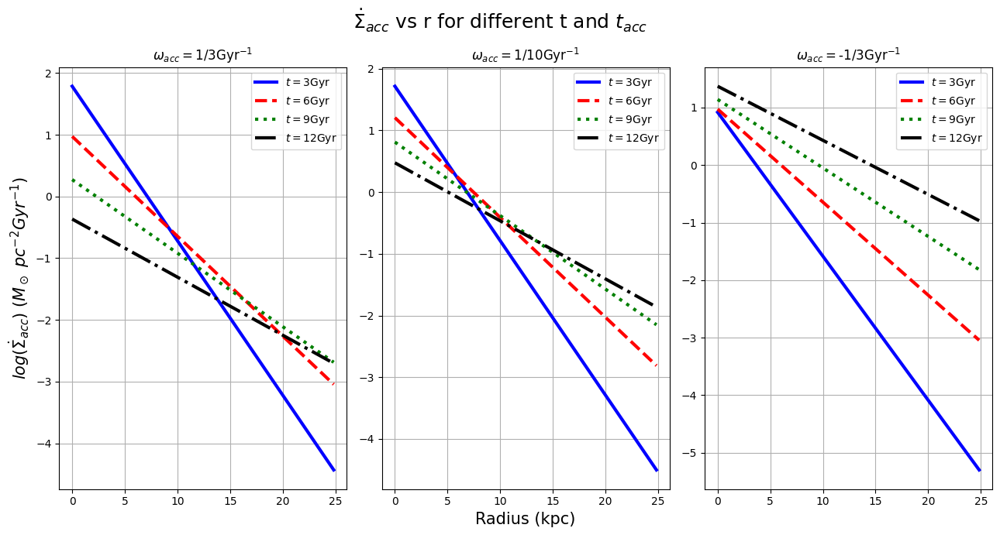

Execution time: 0.1973 seconds


In [28]:
M_sigma_accs = np.array([M_sigma_acc_dot1, M_sigma_acc_dot2, M_sigma_acc_dot3])

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\dot{\Sigma}_{acc}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\dot{\Sigma}_{acc})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sigma_accs, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/dotSigma_acc vs r (t_acc variation, k={ki}).png')

### $\tau_\mathrm{dep}$ and $\tau_\mathrm{sup}$

In [29]:
# Compute SFRs for cutoff_ksl without altering SFL: evaluate per-galaxy and per-radius elementwise
# Compute SFR surface density for cutoff_ksl in a vectorized way (handles array sigma)
def sfl_cutoff_array(sigma):
    Rf = 0.3
    sigma = np.asarray(sigma, dtype=float)

    # enforce physical domain for SFR: if Σ<=0, SFR=0
    sigma_pos = np.where(sigma > 0.0, sigma, 0.0)

    low_reg = (1 - Rf)*1.59e-3*(sigma_pos**3.25)
    high_reg = (1 - Rf)*6.68e-2*(sigma_pos**1.54)

    with np.errstate(divide='ignore', invalid='ignore'):
        log_sigma = np.where(sigma_pos > 0.0, np.log10(sigma_pos), -np.inf)

    mask = log_sigma < threshold_sigma_SFR
    sfr = np.where(mask, low_reg, high_reg)

    sfr[~np.isfinite(sfr)] = 0.0
    return sfr

# define functions for supply and depletion timescales

def t_supply(Sigma_gas, r, t_acc, M_bar):
    """Returns the supply timescale, defined as the ratio of the gas surface density to the accretion rate surface density."""
    Sigma_acc = Sigma_acc_def(r, M_times1, t_acc, M_bar)
    t_supply_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]): #loop over radius
        for j in range(Sigma_gas.shape[1]): #loop over time
            if Sigma_acc[i,j] > 0:
                t_supply_matrix[i,j] = Sigma_gas[i,j]/Sigma_acc[i,j]
            else:
                t_supply_matrix[i,j] = np.inf
    return t_supply_matrix

def t_depletion(Sigma_gas, r, t_acc, M_bar, sfl_type="cutoff_ksl"):
    """Returns the depletion timescale, defined as the ratio of the gas surface density to the star formation rate surface density."""
    if sfl_type == "cutoff_ksl":
        Sigma_sfr = sfl_cutoff_array(Sigma_gas)
    else:
        Sigma_sfr = SFL(Sigma_gas, sfl_type, r[:, np.newaxis], M_bar)
    t_depletion_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]):
        for j in range(Sigma_gas.shape[1]):
            if Sigma_sfr[i,j] > 0:
                t_depletion_matrix[i,j] = Sigma_gas[i,j]/Sigma_sfr[i,j]
            else:
                t_depletion_matrix[i,j] = np.inf
    return t_depletion_matrix


Execution time: 0.0012 seconds


### $log(\Sigma_{gas})$ vs r for different t and $t_{acc}$

warnings.filterwarnings('ignore')

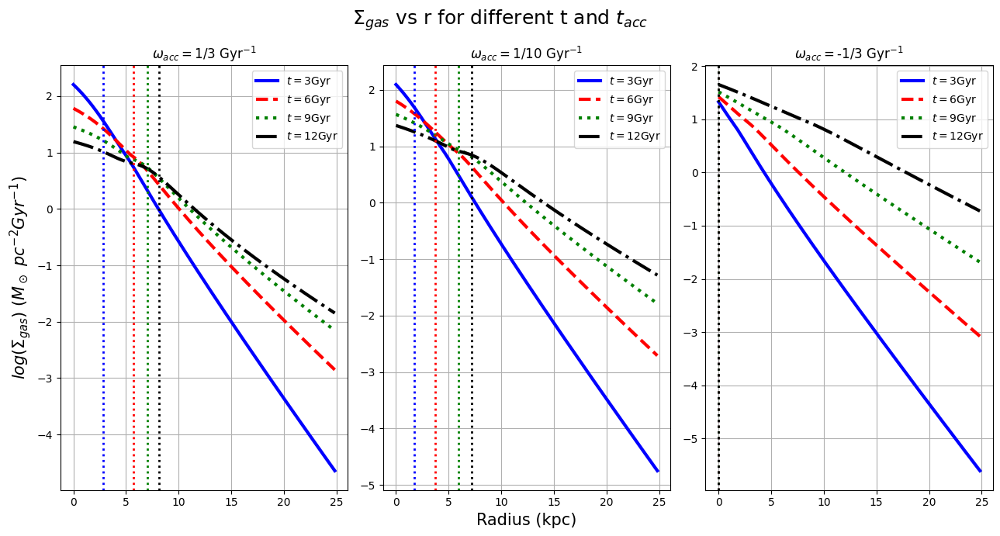

Execution time: 0.3926 seconds


In [30]:
Sigma_gas_cutoff_ksl = np.array([Sigma_gas_cutoff_ksl1, Sigma_gas_cutoff_ksl2, Sigma_gas_cutoff_ksl3])

#find radius where t_dep = t_sup for each t_acc and time
r_eq_list = []
for i, t_accr in enumerate(t_acc):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

    r_eq = np.full(t_sup.shape[1], 0) # 0 = no crossing at that time
    for j in range(t_sup.shape[1]):
        D = (t_sup[:, j] - t_dep[:, j]).astype(float)
        mask = np.isfinite(D) & np.isfinite(r)
        rr, DD = r[mask], D[mask]

        sign = np.sign(DD)
        cross_idx = np.where(np.diff(sign) != 0)[0] # indices k where DD[k]*DD[k+1] < 0
        if cross_idx.size:
            k = cross_idx[0]
            r0, r1 = rr[k], rr[k+1]
            y0, y1 = DD[k], DD[k+1]
            # linear interpolation to Delta=0
            r_eq[j] = r0 - y0 * (r1 - r0) / (y1 - y0)
        else:
            r_eq[j] = 0  # no supply-limited/KS transition at this time

    r_eq_list.append(r_eq)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].axvline(x=r_eq_list[i][index_t1]/1000, color='blue', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t2]/1000, color='red', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t3]/1000, color='green', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t4]/1000, color='black', linestyle=':', lw=2)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))} Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_gas_cutoff_ksl vs r (t_acc variation, k={ki}).png')

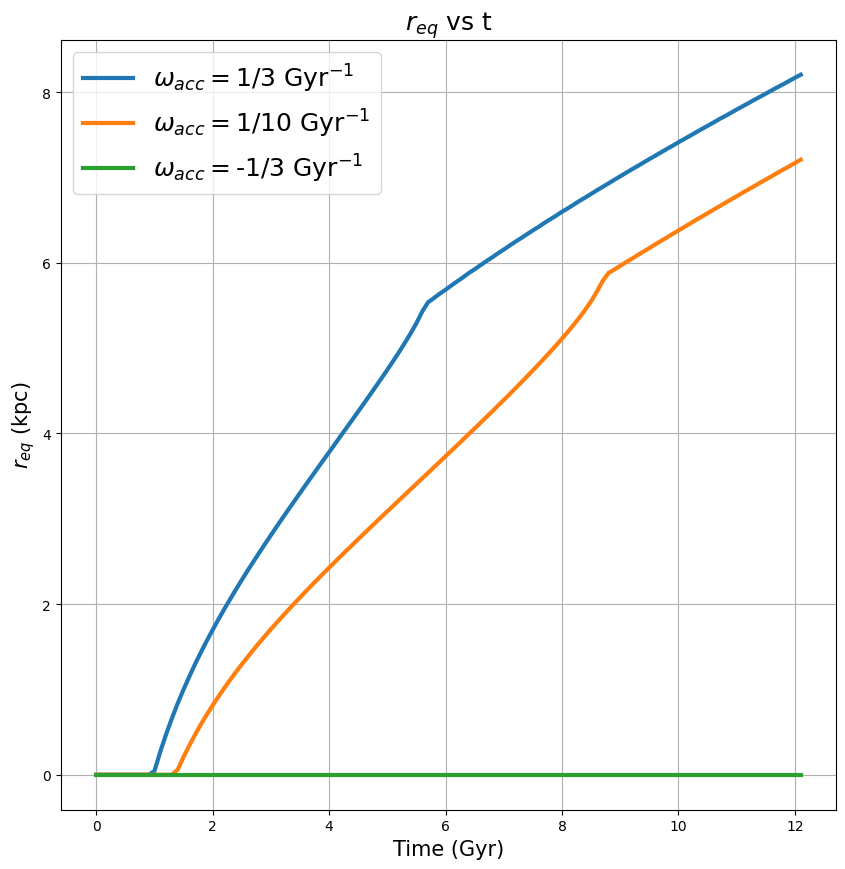

Execution time: 0.0782 seconds


In [31]:
# plot r_eq vs time for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, r_eq, t_accr in zip(range(3), r_eq_list, t_acc):
    frame.plot(M_times1, r_eq/1000, label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", lw=3)
frame.set_title(r"$r_{eq}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{eq}$ (kpc)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/r_eq vs time (t_acc variation, k={ki}).png')

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/3749383311.py:7: RuntimeWarning: divide by zero encountered in log10
  frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)


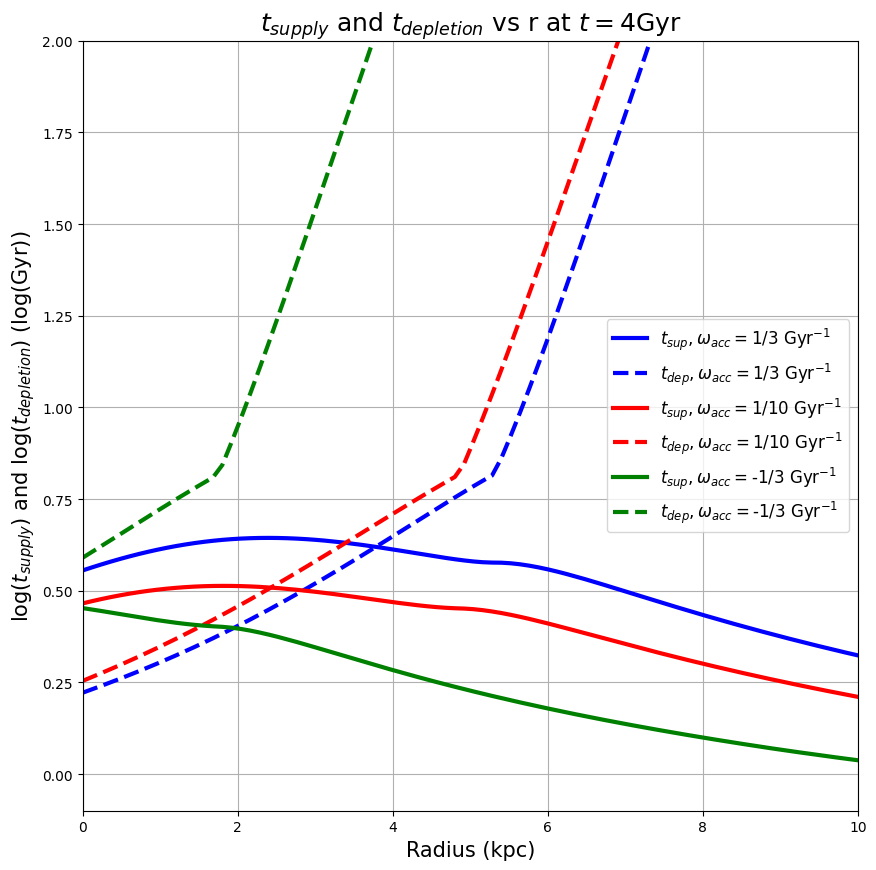

Execution time: 0.2634 seconds


In [32]:
# plot t_supply and t_depletion for cutoff_ksl at t=12Gyr for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")
    frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
    frame.plot(r[:index_r1]/1000, np.log10(t_dep)[:index_r1,np.argwhere(M_times1 == find_nearest(M_times1, 4.))[0][0]], label = r"$t_{dep}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='dashed', lw=3)
frame.set_title(r"$t_{supply}$ and $t_{depletion}$ vs r at $t=4$Gyr", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$\log(t_{supply})$ and $\log(t_{depletion})$ (log(Gyr))", fontsize = 15)
frame.set_xlim(0, 10)
frame.set_ylim(-0.1, 2)
frame.legend(prop={'size': 12})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/t_supply and t_depletion vs r at t=4Gyr (t_acc variation, k={ki}).png')

In [34]:
# ==== precompute full t_sup and t_dep grids for all t ====

# Sigma_gas_cutoff_ksl has shape (3, Nr, Nt) for the three t_acc values
n_acc, n_r, n_t = Sigma_gas_cutoff_ksl.shape

t_sup_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)
t_dep_all = np.zeros_like(Sigma_gas_cutoff_ksl, dtype=float)

for i, t_accr in enumerate(t_acc):
    t_sup_all[i] = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep_all[i] = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")

# choose how many radii and times to show
r_kpc = r[:index_r1]/1000.0
time_indices = np.arange(n_t)   # or e.g. np.arange(0, n_t, 2) to skip every other step

# precompute log10 safely (avoid warnings on inf)
with np.errstate(divide="ignore", invalid="ignore"):
    log_t_sup_all = np.log10(t_sup_all)
    log_t_dep_all = np.log10(t_dep_all)

Execution time: 0.1676 seconds


In [35]:
fig = figure(figsize=(10, 10), dpi=150, facecolor='w')
ax = fig.add_subplot(1,1,1)

# set up lines: one solid + one dashed per t_acc
sup_lines = []
dep_lines = []
for col, sty in zip(colors, styles):
    (l_sup,) = ax.plot([], [], color=col, linestyle='solid', lw=3)
    (l_dep,) = ax.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines.append(l_sup)
    dep_lines.append(l_dep)

# axis labels etc.
ax.set_xlabel("Radius (kpc)", fontsize=15)
ax.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax.set_xlim(0, r_kpc[-1])
ax.set_ylim(-0.1, 12.1)
ax.grid()

# legend (static; only labels once)
labels = []
for t_accr, col in zip(t_acc, colors):
    labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
ax.legend(sup_lines + dep_lines, labels, prop={'size': 9})

# time annotation in the corner
time_text = ax.text(0.02, 0.95, "", transform=ax.transAxes, fontsize=14)

def init():
    for l_sup, l_dep in zip(sup_lines, dep_lines):
        l_sup.set_data([], [])
        l_dep.set_data([], [])
    time_text.set_text("")
    return sup_lines + dep_lines + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i, (l_sup, l_dep) in enumerate(zip(sup_lines, dep_lines)):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]
        l_sup.set_data(r_kpc, y_sup)
        l_dep.set_data(r_kpc, y_dep)

    time_text.set_text(f"t = {t_now:.1f} Gyr")
    return sup_lines + dep_lines + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

# save as GIF (needs pillow installed)
gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved GIF to:", gif_path)

Saved GIF to: ../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution.gif
Execution time: 11.9826 seconds


In [36]:
time_indices = np.arange(n_t)  # or e.g. np.arange(0, n_t, 2)

# global y-limits for the left panel
with np.errstate(invalid="ignore"):
    y_full_min = np.nanmin(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))
    y_full_max = np.nanmax(np.concatenate([
        log_t_sup_all[:, :index_r1, :].ravel(),
        log_t_dep_all[:, :index_r1, :].ravel()
    ]))

# zoom limits for the right panel (tweak these)
x_zoom_min, x_zoom_max = -0.05, 10.0   # kpc
y_zoom_min, y_zoom_max = -0.1, 2.0   # log(Gyr)

fig, (ax_full, ax_zoom) = plt.subplots(
    1, 2, figsize=(14, 6), dpi=150, facecolor='w', sharey=False
)

fig.suptitle(r"Animation of $t_{supply}$ and $t_{depletion}$ vs $r$ at different $t$",
             fontsize=18, y=0.98)

# ---------- set up lines ----------
sup_lines_full, dep_lines_full = [], []
sup_lines_zoom, dep_lines_zoom = [], []

for col, sty in zip(colors, styles):
    # full panel
    (lf_sup,) = ax_full.plot([], [], color=col, linestyle='solid', lw=3)
    (lf_dep,) = ax_full.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_full.append(lf_sup)
    dep_lines_full.append(lf_dep)

    # zoom panel
    (lz_sup,) = ax_zoom.plot([], [], color=col, linestyle='solid', lw=3)
    (lz_dep,) = ax_zoom.plot([], [], color=col, linestyle='dashed', lw=3)
    sup_lines_zoom.append(lz_sup)
    dep_lines_zoom.append(lz_dep)

# ---------- formatting ----------
ax_full.set_title(r"Full view", fontsize=16)
ax_full.set_xlabel("Radius (kpc)", fontsize=15)
ax_full.set_ylabel(r"$\log(t_{supply}), \log(t_{depletion})$ (log(Gyr))", fontsize=15)
ax_full.set_xlim(r_kpc[0], r_kpc[-1])
ax_full.set_ylim(-0.1, 12.1)
ax_full.grid()

ax_zoom.set_title(r"Zoomed view", fontsize=16)
ax_zoom.set_xlabel("Radius (kpc)", fontsize=15)
ax_zoom.set_xlim(x_zoom_min, x_zoom_max)
ax_zoom.set_ylim(y_zoom_min, y_zoom_max)
ax_zoom.grid()

# legend only on the full panel
legend_lines = []
legend_labels = []
for t_accr, col in zip(t_acc, colors):
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='solid', lw=3))
    legend_lines.append(plt.Line2D([], [], color=col, linestyle='dashed', lw=3))
    legend_labels.append(r"$t_{sup}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")
    legend_labels.append(r"$t_{dep}, \omega_{acc} = $" + f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$")

ax_full.legend(legend_lines, legend_labels, prop={'size': 9}, loc='upper right')

# time annotation at top center
time_text = ax_full.text(
    0.15, 0.91, "",
    transform=ax_full.transAxes,
    ha="center", va="bottom",
    fontsize=16
)

def init():
    for l in (sup_lines_full + dep_lines_full +
              sup_lines_zoom + dep_lines_zoom):
        l.set_data([], [])
    time_text.set_text("")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

def update(frame_idx):
    j = time_indices[frame_idx]
    t_now = M_times1[j]

    for i in range(n_acc):
        y_sup = log_t_sup_all[i, :index_r1, j]
        y_dep = log_t_dep_all[i, :index_r1, j]

        # full panel
        sup_lines_full[i].set_data(r_kpc, y_sup)
        dep_lines_full[i].set_data(r_kpc, y_dep)

        # zoom panel (same data, different axes limits)
        sup_lines_zoom[i].set_data(r_kpc, y_sup)
        dep_lines_zoom[i].set_data(r_kpc, y_dep)

    time_text.set_text(rf"$t = {t_now:.1f}\,{{\rm Gyr}}$")
    return sup_lines_full + dep_lines_full + sup_lines_zoom + dep_lines_zoom + [time_text]

anim = FuncAnimation(
    fig,
    update,
    frames=len(time_indices),
    init_func=init,
    blit=True
)

gif_path = f"../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution_dual_with_zoom.gif"
anim.save(gif_path, writer=PillowWriter(fps=5))

plt.close(fig)
print("Saved dual-panel GIF to:", gif_path)

Saved dual-panel GIF to: ../outputs/graphs10_JAX_aKSL/t_supply_t_depletion_evolution_dual_with_zoom.gif
Execution time: 12.4825 seconds


### $log(\Sigma_{SFR})$ vs r for different t and $t_{acc}$

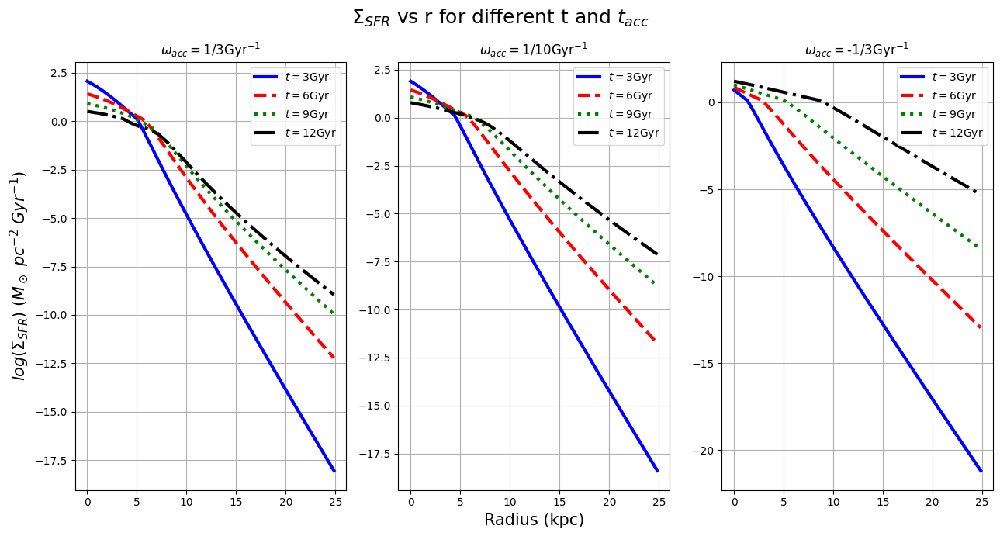

Execution time: 0.3162 seconds


In [33]:
M_sfrs_cutoff_ksl1 = sfl_cutoff_array(Sigma_gas_cutoff_ksl1)
M_sfrs_cutoff_ksl2 = sfl_cutoff_array(Sigma_gas_cutoff_ksl2)
M_sfrs_cutoff_ksl3 = sfl_cutoff_array(Sigma_gas_cutoff_ksl3)
M_sfrs_cutoff_ksl = np.array([M_sfrs_cutoff_ksl1, M_sfrs_cutoff_ksl2, M_sfrs_cutoff_ksl3])

np.savetxt('../data/data9_JAX_aKSL/M_sfr1_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl1)
np.savetxt('../data/data9_JAX_aKSL/M_sfr2_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl2)
np.savetxt('../data/data9_JAX_aKSL/M_sfr3_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7), facecolor='w')

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{SFR}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{SFR})$ $(M_\odot\ pc^{-2}\ Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sfrs_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()

# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_sfr vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{\star})$ vs r for different t and $t_{acc}$

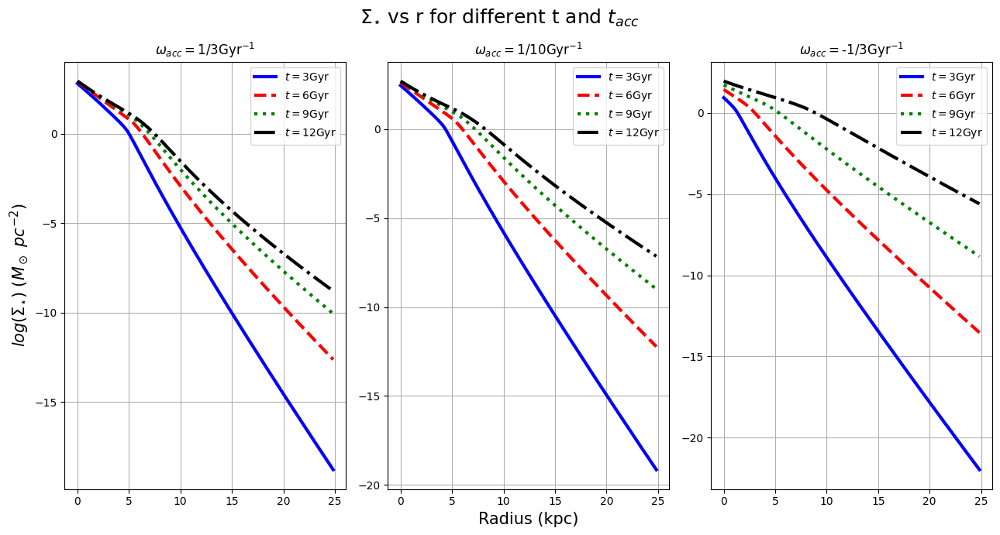

Execution time: 0.3004 seconds


In [34]:
Sigma_star_cutoff_ksl1 = dt*np.cumsum(M_sfrs_cutoff_ksl[0], axis=1)
Sigma_star_cutoff_ksl2 = dt*np.cumsum(M_sfrs_cutoff_ksl[1], axis=1)
Sigma_star_cutoff_ksl3 = dt*np.cumsum(M_sfrs_cutoff_ksl[2], axis=1)
Sigma_stars_cutoff_ksl = np.array([Sigma_star_cutoff_ksl1, Sigma_star_cutoff_ksl2, Sigma_star_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_star1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_star2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_star3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{\star}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_stars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_star vs r (t_acc variation, k={ki}).png')

### $log(\Sigma_{bar})$ vs r for different t and $t_{acc}$

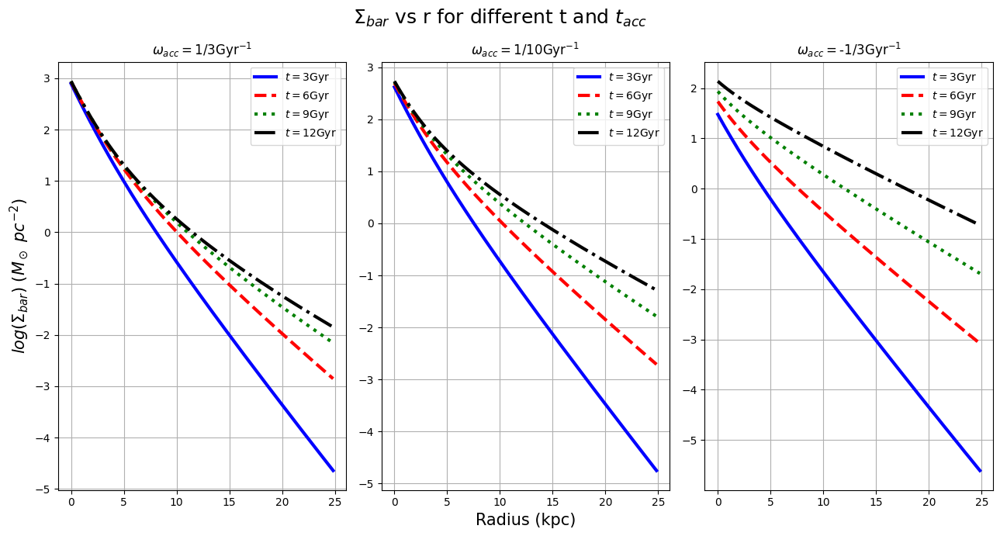

Execution time: 2.2635 seconds


In [35]:
Sigma_bar_cutoff_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl1.ravel(), Sigma_star_cutoff_ksl1.ravel())]).reshape(Sigma_gas_cutoff_ksl1.shape)
Sigma_bar_cutoff_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl2.ravel(), Sigma_star_cutoff_ksl2.ravel())]).reshape(Sigma_gas_cutoff_ksl2.shape)
Sigma_bar_cutoff_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl3.ravel(), Sigma_star_cutoff_ksl3.ravel())]).reshape(Sigma_gas_cutoff_ksl3.shape)
Sigma_bars_cutoff_ksl = np.array([Sigma_bar_cutoff_ksl1, Sigma_bar_cutoff_ksl2, Sigma_bar_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/M_bar1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/M_bar3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{bar}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{bar})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_bars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Sigma_bar vs r (t_acc variation, k={ki}).png')

In [36]:
NGC3198_HI = pd.read_table("../data/allHIprofs/NGC3198_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC3198_star = pd.read_table("../data/allSTARSprofs/NGC3198_fullstars_2.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC3198_HI['r[kpc]'] =  pd.to_numeric(NGC3198_HI['r[kpc]'], errors='coerce')
NGC3198_HI['vrot[km/s]'] =  pd.to_numeric(NGC3198_HI['vrot[km/s]'], errors='coerce')
NGC3198_HI['Sigma_HI[Msun/pc2]'] =  pd.to_numeric(NGC3198_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC3198_HI['jHI[kpckm/s]'] =  pd.to_numeric(NGC3198_HI['jHI[kpckm/s]'], errors='coerce')

NGC3198_star['r[kpc]'] =  pd.to_numeric(NGC3198_star['r[kpc]'], errors='coerce')
NGC3198_star['vrot[km/s]'] =  pd.to_numeric(NGC3198_star['vrot[km/s]'], errors='coerce')
NGC3198_star['Sigma_star[Msun/pc2]'] =  pd.to_numeric(NGC3198_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC3198_star['jstar[kpckm/s]'] =  pd.to_numeric(NGC3198_star['jstar[kpckm/s]'], errors='coerce')

NGC3198_r_obs_HI = NGC3198_HI['r[kpc]']
NGC3198_r_obs_star = NGC3198_star['r[kpc]']
NGC3198_v_obs = NGC3198_HI['vrot[km/s]']
NGC3198_Sigma_gas_obs = 1.4*NGC3198_HI['Sigma_HI[Msun/pc2]']
NGC3198_Sigma_star_obs = NGC3198_star['Sigma_star[Msun/pc2]']

NGC2403_HI = pd.read_table("../data/allHIprofs/NGC2403_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC2403_star = pd.read_table("../data/allSTARSprofs/NGC2403_fullstars.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC2403_HI['r[kpc]'] = pd.to_numeric(NGC2403_HI['r[kpc]'], errors='coerce')
NGC2403_HI['vrot[km/s]'] = pd.to_numeric(NGC2403_HI['vrot[km/s]'], errors='coerce')
NGC2403_HI['Sigma_HI[Msun/pc2]'] = pd.to_numeric(NGC2403_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC2403_HI['jHI[kpckm/s]'] = pd.to_numeric(NGC2403_HI['jHI[kpckm/s]'], errors='coerce')

NGC2403_star['r[kpc]'] = pd.to_numeric(NGC2403_star['r[kpc]'], errors='coerce')
NGC2403_star['vrot[km/s]'] = pd.to_numeric(NGC2403_star['vrot[km/s]'], errors='coerce')
NGC2403_star['Sigma_star[Msun/pc2]'] = pd.to_numeric(NGC2403_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC2403_star['jstar[kpckm/s]'] = pd.to_numeric(NGC2403_star['jstar[kpckm/s]'], errors='coerce')

NGC2403_r_obs_HI = NGC2403_HI['r[kpc]']
NGC2403_r_obs_star = NGC2403_star['r[kpc]']
NGC2403_v_obs = NGC2403_HI['vrot[km/s]']
NGC2403_Sigma_gas_obs = 1.4*NGC2403_HI['Sigma_HI[Msun/pc2]']
NGC2403_Sigma_star_obs = NGC2403_star['Sigma_star[Msun/pc2]']

Execution time: 0.0058 seconds


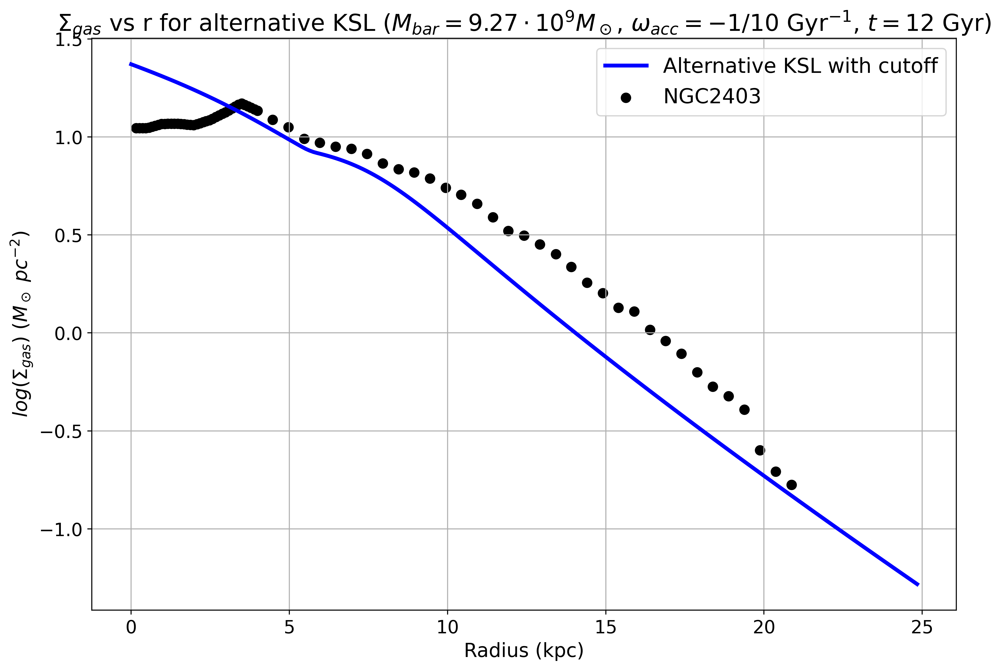

Execution time: 0.2842 seconds


In [37]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for alternative KSL ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

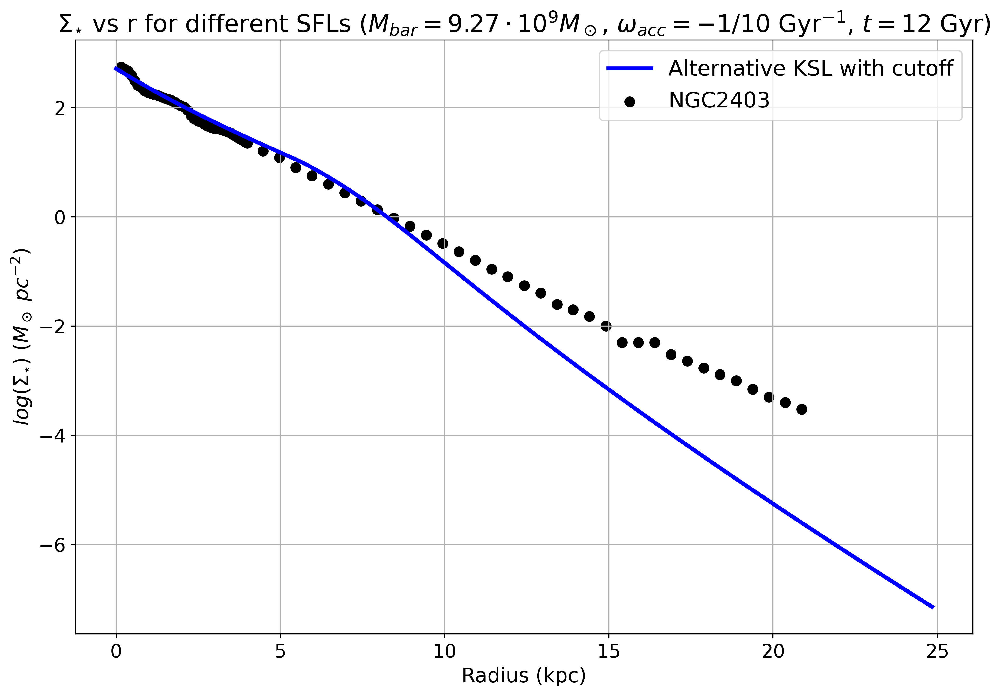

Execution time: 0.2131 seconds


In [38]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_stars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_star = np.array([Sigma_stars_old_ksl[1], Sigma_stars_new_ksl[1], Sigma_stars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_star, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

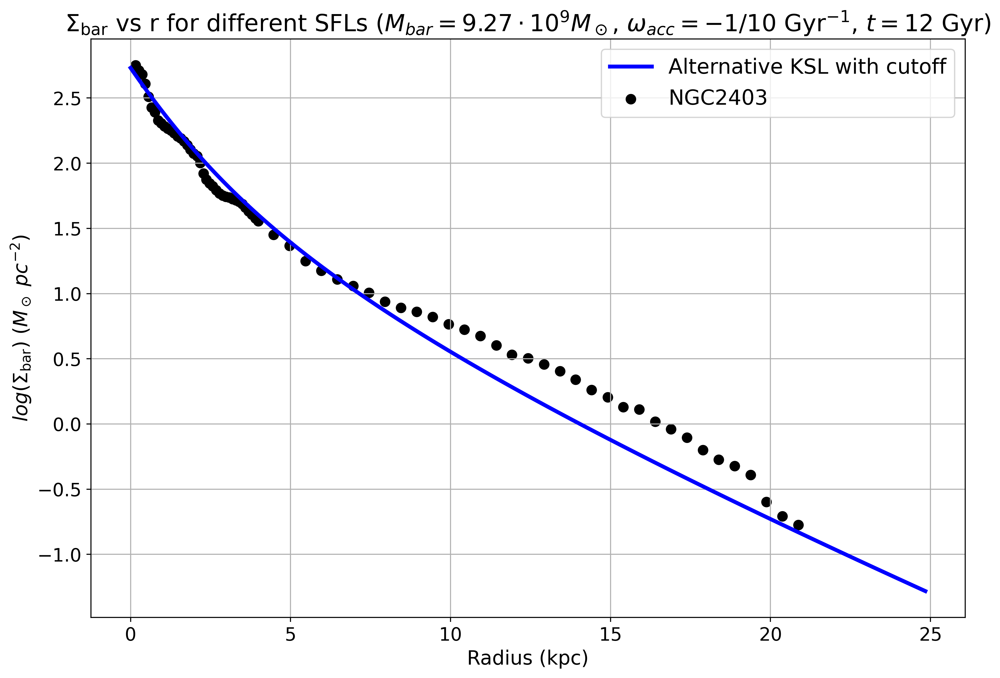

Execution time: 0.2198 seconds


In [39]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_bars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs+NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_bar = np.array([Sigma_bars_old_ksl[1], Sigma_bars_new_ksl[1], Sigma_bars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_bar, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs+NGC3198_Sigma_gas_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

warnings.filterwarnings('default')

## $f_{gas}$ vs r

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/2524574588.py:1: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/2524574588.py:2: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/2524574588.py:3: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)


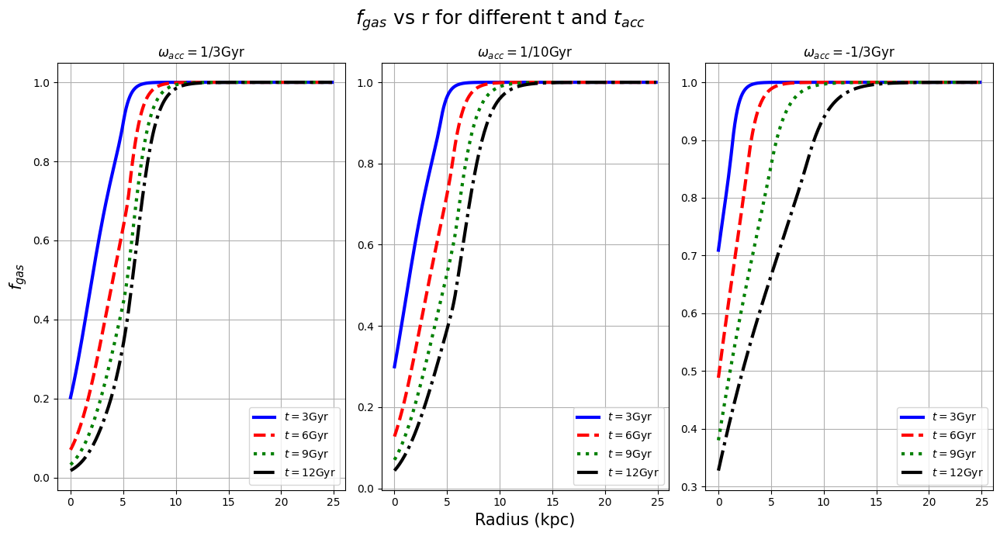

Execution time: 0.2623 seconds


In [40]:
f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)
f_gas_cutoff_ksl = np.array([f_gas_cutoff_ksl1, f_gas_cutoff_ksl2, f_gas_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$f_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$f_{gas}$", fontsize = 15)

for i, f_gas, t_accr in zip(range(3), f_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t1][:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t2][:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t3][:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t4][:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))}Gyr")
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/f_gas vs r (t_acc variation, k={ki}).png')

## $M_{gas}$ vs t

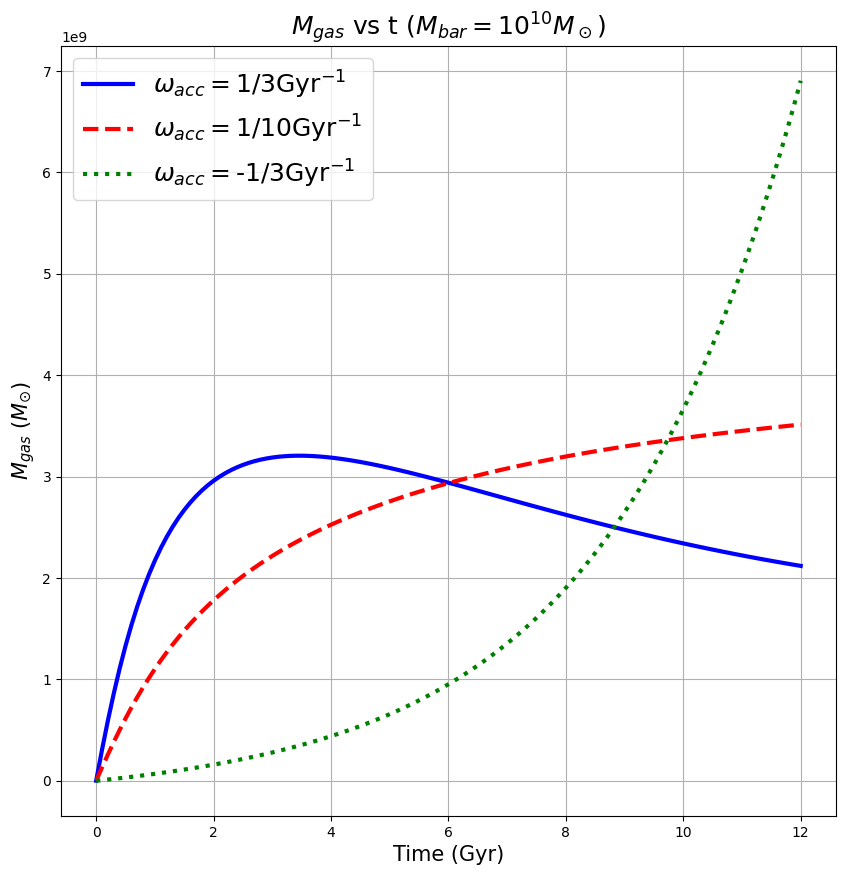

Execution time: 0.1291 seconds


In [41]:
dr = 120
integral_r = r.reshape(835,1)

Mass_gas_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl1, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl2, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl3, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl = np.array([Mass_gas_summed_cutoff_ksl1, Mass_gas_summed_cutoff_ksl2, Mass_gas_summed_cutoff_ksl3])
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(M_times1[:-1], Mass_gas_summed_old_ksl1[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_new_ksl1[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_boissier1[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{gas}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{gas}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_gas vs time (SFL variation, k={ki}).png')

## $M_{\star}$ vs t

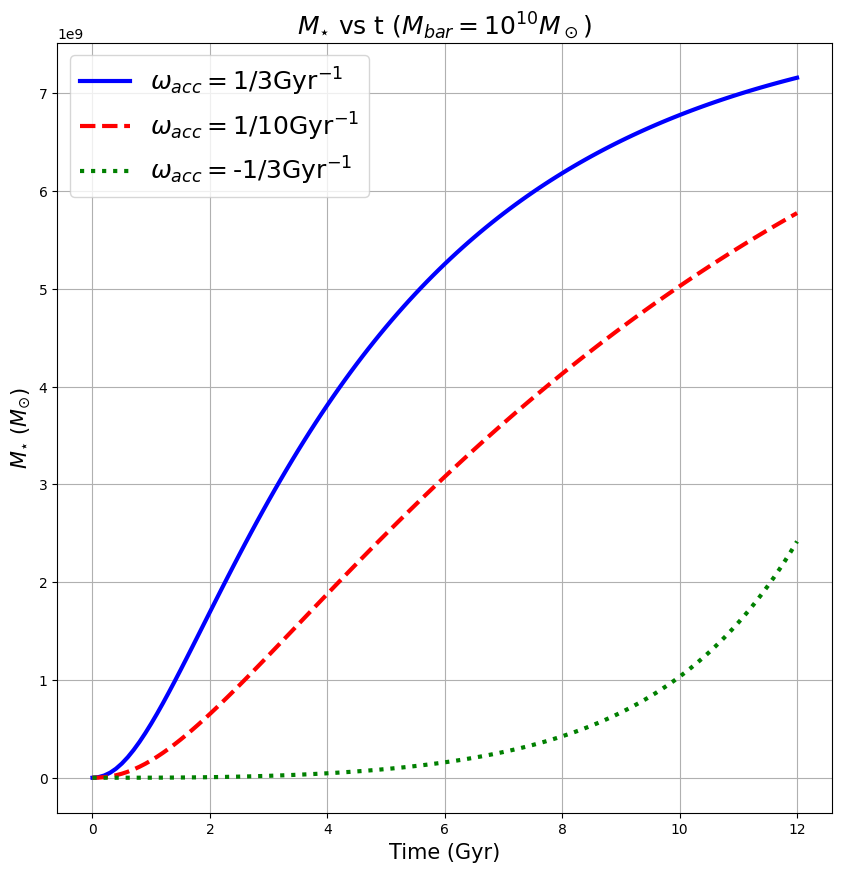

Execution time: 0.1155 seconds


In [42]:
Mass_sfr_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[0], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[1], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[2], dx=dr, axis=0)
Mass_time_star_cutoff_ksl_1 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl1)
Mass_time_star_cutoff_ksl_2 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl2)
Mass_time_star_cutoff_ksl_3 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl3)

np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl3)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_star3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{\star}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{\star}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_star vs time (SFL variation, k={ki}).png')

## $M_{bar}$ vs t

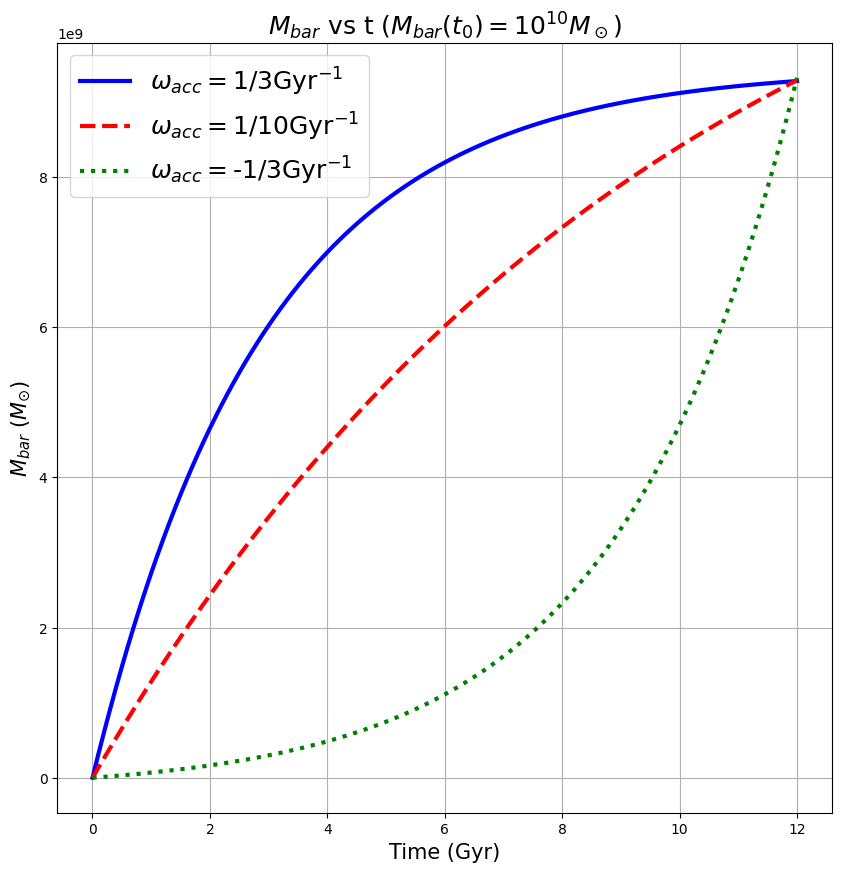

Execution time: 0.0911 seconds


In [43]:
Mass_time_bar_cutoff_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_1, Mass_gas_summed_cutoff_ksl1)]
Mass_time_bar_cutoff_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_2, Mass_gas_summed_cutoff_ksl2)]
Mass_time_bar_cutoff_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_3, Mass_gas_summed_cutoff_ksl3)]

np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_1)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_2)
np.savetxt(f'../data/data9_JAX_aKSL/Mass_bar3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_old_ksl_2[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_new_ksl_2[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_boissier_2[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{bar}}$ vs t ($M_{{bar}}(t_0)=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/M_bar vs time (t_acc variation, k={ki}).png')

#  Global $f_{gas}$ vs t

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/3346488085.py:1: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/3346488085.py:2: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/3346488085.py:3: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)


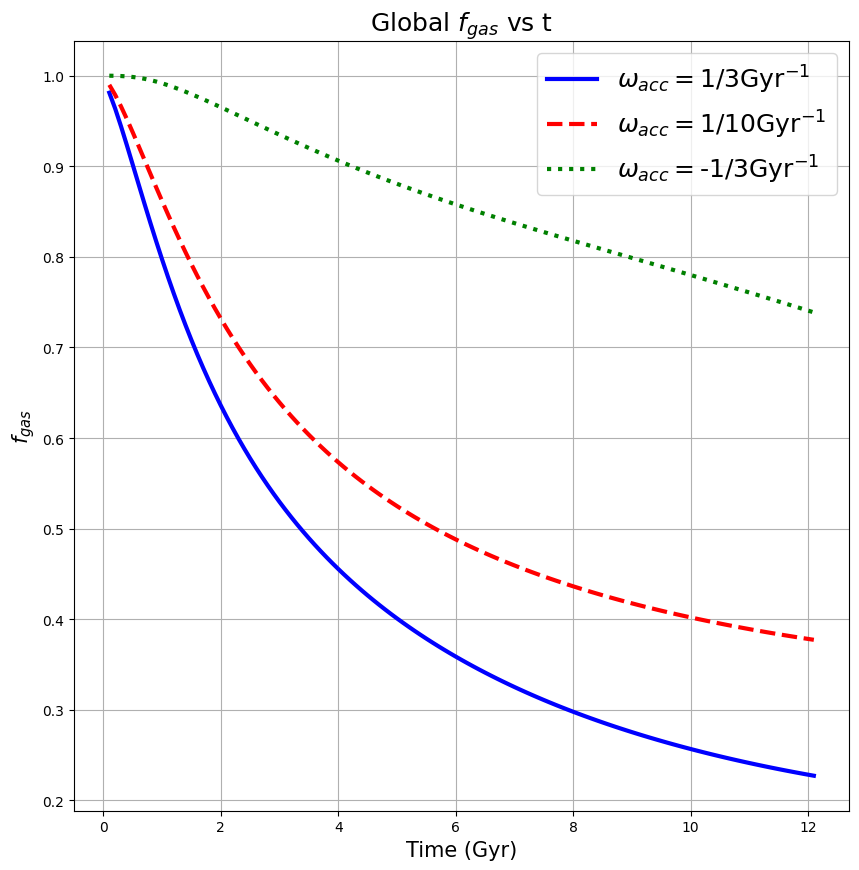

Execution time: 0.0887 seconds


In [44]:
f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl1)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl2)
np.savetxt(f'../data/data9_JAX_aKSL/f_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, f_global_gas_cutoff_ksl1, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl2, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl3, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $f_{gas}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$f_{gas}$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global f_gas vs time (t_acc variation, k={ki}).png')

# Specific Angular Momentum $j_{bar}$

/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/1233316197.py:19: RuntimeWarning: invalid value encountered in divide
  j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/1233316197.py:20: RuntimeWarning: invalid value encountered in divide
  j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/1233316197.py:21: RuntimeWarning: invalid value encountered in divide
  j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)


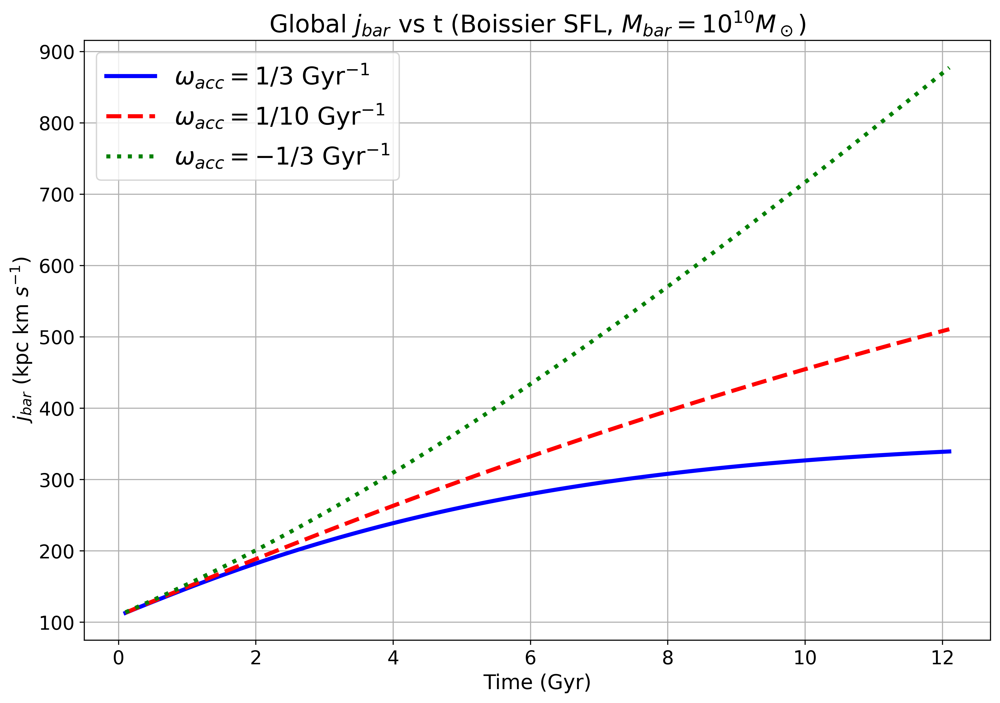

Execution time: 0.4490 seconds


In [45]:
SFL_type = "cutoff_ksl"

Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_star1 = dt*np.cumsum(sfr_r_squared1)
Nominator_star2 = dt*np.cumsum(sfr_r_squared2)
Nominator_star3 = dt*np.cumsum(sfr_r_squared3)

Nominator_bar1 = [np.sum(x) for x in zip(Nominator_star1, Nominator_gas1)]
Nominator_bar2 = [np.sum(x) for x in zip(Nominator_star2, Nominator_gas2)]
Nominator_bar3 = [np.sum(x) for x in zip(Nominator_star3, Nominator_gas3)]

j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)

np.savetxt('../data/data7/j_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar1)
np.savetxt('../data/data7/j_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar2)
np.savetxt('../data/data7/j_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar3)

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, j_bar1/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[0]))}$ Gyr$^{{-1}}$", color="blue", lw=3)
frame.plot(M_times1, j_bar2/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[1]))}$ Gyr$^{{-1}}$", linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, j_bar3/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[2]))}$ Gyr$^{{-1}}$", linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $j_{bar}$ vs t (Boissier SFL, $M_{bar}=10^{10}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/Global j_bar vs time (t_acc variation, k={ki}).png')

# Model Definer

In [46]:
def Full_final_definer(Mbar, t_acc_arr, star_formation_law, interpolator, res=120, Rmax=100.1, at_t0=True, ns=1, ks=1, atollerance=1e-8, rtollerance=1e-6):
    """
    Defines the global fraction of gas and baryonic specific angular momentum arrays.
    This function is self-contained; together with the Sigma_definer function, and the functions defining 
    the accretion radius and angular momentum, as well as the baryonic mass and rotational velocity, it 
    alone should give the arrays for the final FINAL graph.
    
    --------------
    Inputs:
        - Mbar (float)           --> Baryonic mass value for which you want to evaluate global gas fraction and 
                                     (specific) angular momentum.
        - t_acc_arr (np.array)   --> Array containing the accretion timescale values. This function now works 
                                     for any number of values within the array!
        - res (float)            --> (optional) Resolution of the radius array; gives the values of the radii at
                                     which values are evaluated. Default is 120 pc.
        - Rmax (float)           --> (optional) Maximum radius to evaluate. Default is 100.1 kpc. Together with
                                     res these defaults were chosen as to optimize run time and convergence of 
                                     specific angular momentum. 
        - at_t0 (bool)           --> (optional) Specifes whether to return just the values today (True), or the 
                                     entire evolution (False). Default is True.
        - ns (float)             --> (optional) Power parameter of the accreting angular momentum form. 
                                     Default is 1.
        - ks (float)             --> (optional) Slope parameter of the accreting angular momentum form. 
                                     Default is 1.
    
    Returns:
        - f_gas_array (np.array) --> Array containing, depending on at_t0, either the values of the global
                                     gas fraction today (t = 12Gyr), or in the entire evolution.
        - j_bar_array (np.array) --> Array containing, depending on at_t0, either the values of the specific
                                     angular momentum today (t = 12Gyr), or in the entire evolution.
    
    """
    
    r = np.arange(0,1000*Rmax,res)
    dr = res
    Mbar_full = np.full(M_times1.shape, Mbar)
    
    SD_gas = np.array([Sigma_definer(r, t_acc, Mbar, SFL_type=star_formation_law, interpolator=interpolator, n=ns, con=ks, atol=atollerance, rtol=rtollerance) for t_acc in t_acc_arr])
    if star_formation_law == "boissier":
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar_full) for i in range(len(SD_gas))])
    elif star_formation_law == "cutoff_ksl":
        SD_sfr = np.array([sfl_cutoff_array(SD_gas[i]) for i in range(len(SD_gas))])
    else:
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar) for i in range(len(SD_gas))])
    
    r = r.reshape(len(r),1)
    
    M_gas = np.array([2*np.pi*spint.simpson(r*SD_gas[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_sfr = np.array([2*np.pi*spint.simpson(r*SD_sfr[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_star = np.array([dt*np.cumsum(M_sfr[i]) for i in range(len(SD_gas))])
    M_bar = np.array([np.array([np.sum(x) for x in zip(M_star[i], M_gas[i])]) for i in range(len(SD_gas))])
    f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])

    #Mbar_allsame = np.full(len(M_bar[0]), M_bar[0][-1])
    #v_rot = v_btfr_def(Mbar_allsame[0])
    rv = rv_def(Mbar)
    
    nominator_gas = np.array([2*np.pi*spint.simpson(r**2*SD_gas[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_sfr = np.array([2*np.pi*spint.simpson(r**2*SD_sfr[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_star = np.array([dt*np.cumsum(nominator_sfr[i]) for i in range(len(SD_gas))])
    nominator_bar = np.array([np.array([np.sum(x) for x in zip(nominator_star[i], nominator_gas[i])]) for i in range(len(SD_gas))])
    j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
    j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
    j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
    
    M_star_t0 = M_star[:,-1]
    M_gas_t0  = M_gas[:,-1]
    
    if (at_t0==True):
        f_gas_array = f_gas_global[:,-1]
        j_bar_array = j_bar[:,-1]/1000
        j_gas_array = j_gas[:,-1]/1000
        j_star_array = j_star[:,-1]/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        f_gas_array = f_gas_global
        j_bar_array = j_bar/1000
        j_gas_array = j_gas/1000
        j_star_array = j_star/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star, M_gas

def simpson_uniform_jax(y, dx, axis=0):
    """
    Simpson integration with uniform spacing dx in JAX.
    Handles both even and odd number of samples like scipy.integrate.simpson:
      - if N points => N-1 intervals
      - if (N-1) is odd (N even): Simpson on first N-1 points, trapezoid for last interval.
    """
    y = jnp.asarray(y)
    # move integration axis to 0 for convenience
    y = jnp.moveaxis(y, axis, 0)

    N = y.shape[0]

    # if N < 2, integral is zero
    if N < 2:
        return jnp.zeros_like(y[0])

    def simpson_all(y_local):
        w = jnp.ones(N)
        w = w.at[1:N-1:2].set(4.0)
        w = w.at[2:N-1:2].set(2.0)
        return dx / 3.0 * jnp.tensordot(w, y_local, axes=(0, 0))

    def simpson_plus_trap(y_local):
        # use Simpson on first N-1 points, trap on last interval
        Nsim = N - 1
        y_s = y_local[:Nsim] # Simpson part
        w = jnp.ones(Nsim)
        w = w.at[1:Nsim-1:2].set(4.0)
        w = w.at[2:Nsim-1:2].set(2.0)
        simp = dx / 3.0 * jnp.tensordot(w, y_s, axes=(0, 0))
        trap = dx * 0.5 * (y_local[-2] + y_local[-1])
        return simp + trap

    result = jax.lax.cond(
        (N % 2 == 1),
        simpson_all,
        simpson_plus_trap,
        y
    )

    return jnp.moveaxis(result, 0, axis)

@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    # broadcast R just to satisfy the signature; it’s ignored for cutoff_ksl
    R_broad = r_col[None, :, :] # (1, n_r, 1) -> broadcasts to SD_gas
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  

    M_star = dt*jnp.cumsum(M_sfr, axis=-1)           
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    v_rot = exp_vrot_jax(r_pc, Mbar)[:, None]
    integrand_gas_j = r2_col[None,:,:]*SD_gas*v_rot[None, :, :]
    integrand_sfr_j = r2_col[None,:,:]*Sigma_sfr*v_rot[None, :, :]

    def integrate_radius_j(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    nom_gas  = jax.vmap(integrate_radius_j)(integrand_gas_j)
    nom_sfr  = jax.vmap(integrate_radius_j)(integrand_sfr_j)
    nom_star = dt * jnp.cumsum(nom_sfr, axis=-1)
    nom_bar  = nom_star + nom_gas

    j_bar  = nom_bar / jnp.where(M_bar_tot > 0, M_bar_tot, jnp.inf)
    j_gas  = nom_gas/ jnp.where(M_gas > 0, M_gas, jnp.inf)
    j_star = nom_star / jnp.where(M_star > 0, M_star, jnp.inf)

    if at_t0:
        f_gas_array  = f_gas_global[:, -1]
        j_bar_array  = j_bar[:, -1]/1000.0
        j_gas_array  = j_gas[:, -1]/1000.0
        j_star_array = j_star[:, -1]/1000.0
        M_star_t0    = M_star[:, -1]
        M_gas_t0     = M_gas[:, -1]
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        return (f_gas_global,
                j_bar  / 1000.0,
                j_gas  / 1000.0,
                j_star / 1000.0,
                M_star,
                M_gas)

def C_def_jax(M_bar, t_acc, t0=12.0):
    """
    JAX-friendly version of C_def.
    """
    t_acc = jnp.asarray(t_acc, dtype=jnp.float64)

    pos = t_acc > 0.0
    neg = t_acc < 0.0
    infmask = jnp.isinf(t_acc)

    # positive t_acc
    C_pos = M_bar / (t_acc * (1.0 - jnp.exp(-t0 / t_acc)))

    # negative t_acc
    abs_t = jnp.abs(t_acc)
    C_neg = M_bar / (abs_t * (jnp.exp(t0 / abs_t) - 1.0))

    # infinite t_acc
    C_inf = M_bar / t0

    C = jnp.where(pos, C_pos, C_neg)
    C = jnp.where(infmask, C_inf, C)

    return C

@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    # radius grid in pc (static because res, Rmax are static)
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    # precompute C(t_acc) for all t_acc
    C_vals = C_def_jax(Mbar, t_acc_arr)   # shape (n_tacc,)

    # vectorised call to Sigma_definer_jax over t_acc
    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    # post-process entirely in JAX
    return full_from_sigma_jax(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )

def process_mbar(M, t_acc_array, star_formation_law, interpolator, ns, ks):
    """
    Implements multiprocessing
    """
    return Full_final_definer(10**M, t_acc_array, star_formation_law, interpolator, ns=ns, ks=ks)


Execution time: 0.0073 seconds


In [47]:
@partial(jax.jit, static_argnames=("star_formation_law"))
def run_all_masses(Mbar_grid,
                   t_acc_arr,
                   r_acc_matrix_for_all_M_jax,
                   log_M_bar_array_jax,
                   star_formation_law):

    def per_mass(Mbar):
        return Full_final_definer_jax(
            Mbar,
            t_acc_arr,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            at_t0=True,
        )

    f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all = \
        jax.vmap(per_mass)(Mbar_grid)

    return f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all

Execution time: 0.0005 seconds


# New KSL with Cutoff

## Experiments for k and n

In [46]:
log_M_bar_array_testing = np.linspace(8, 11.5, 30)
t_acc_array_testing = np.array([1,3,10,25,-10,5,-3])

Execution time: 0.0011 seconds


n = 0.3, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

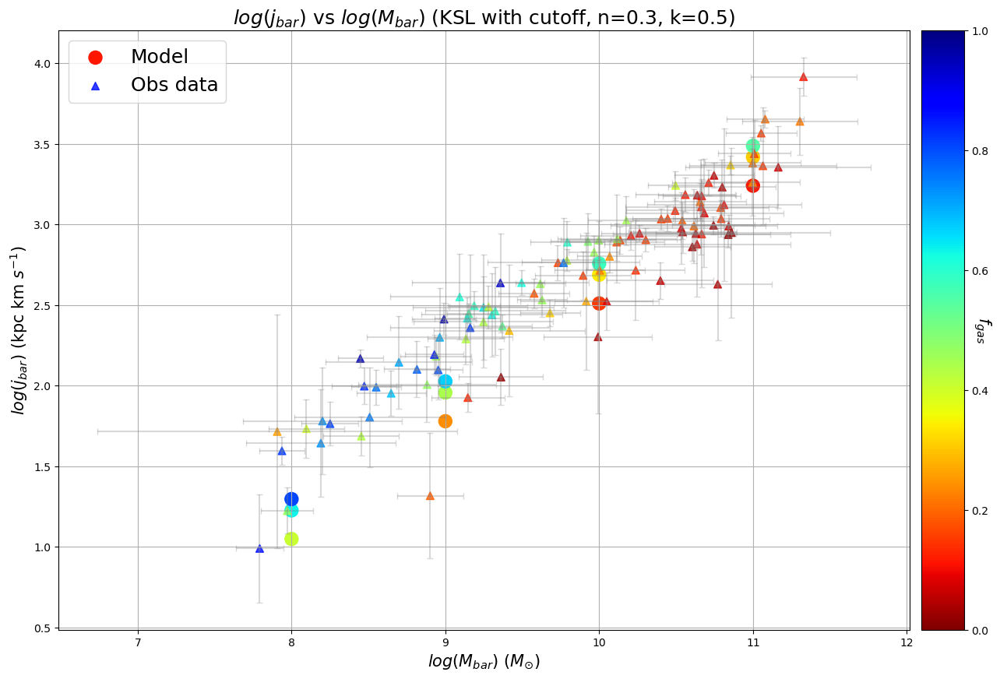

n = 0.3, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

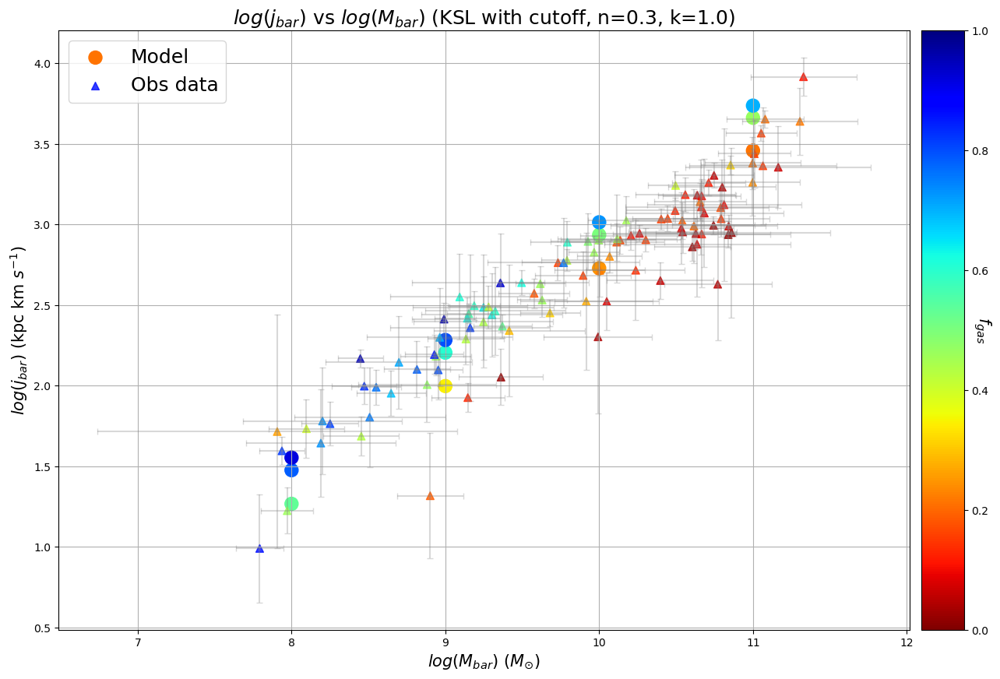

n = 0.3, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

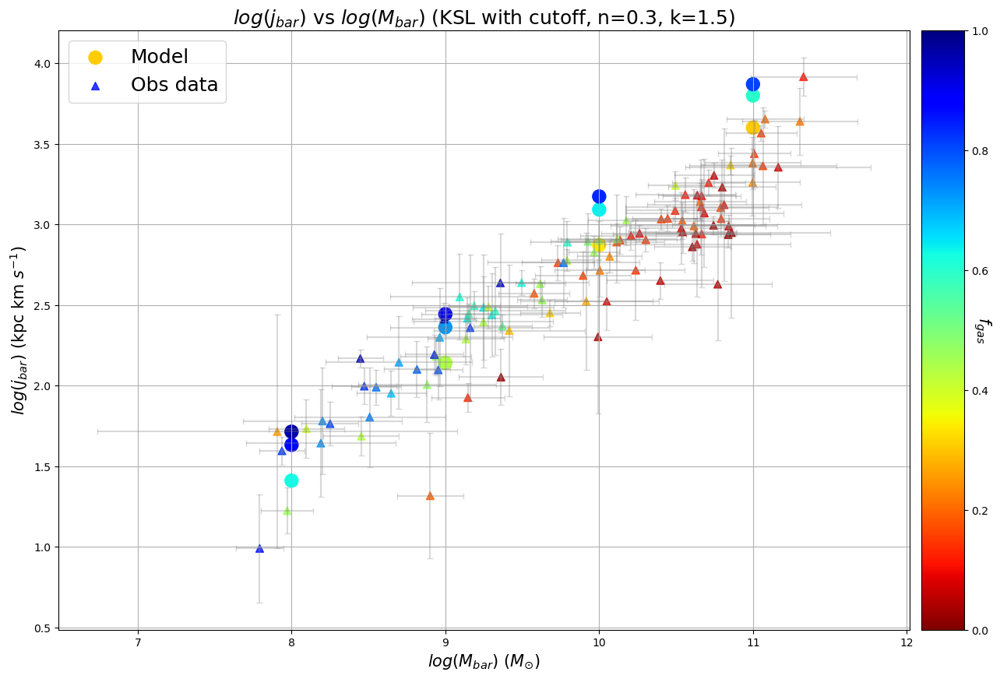

n = 0.3, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

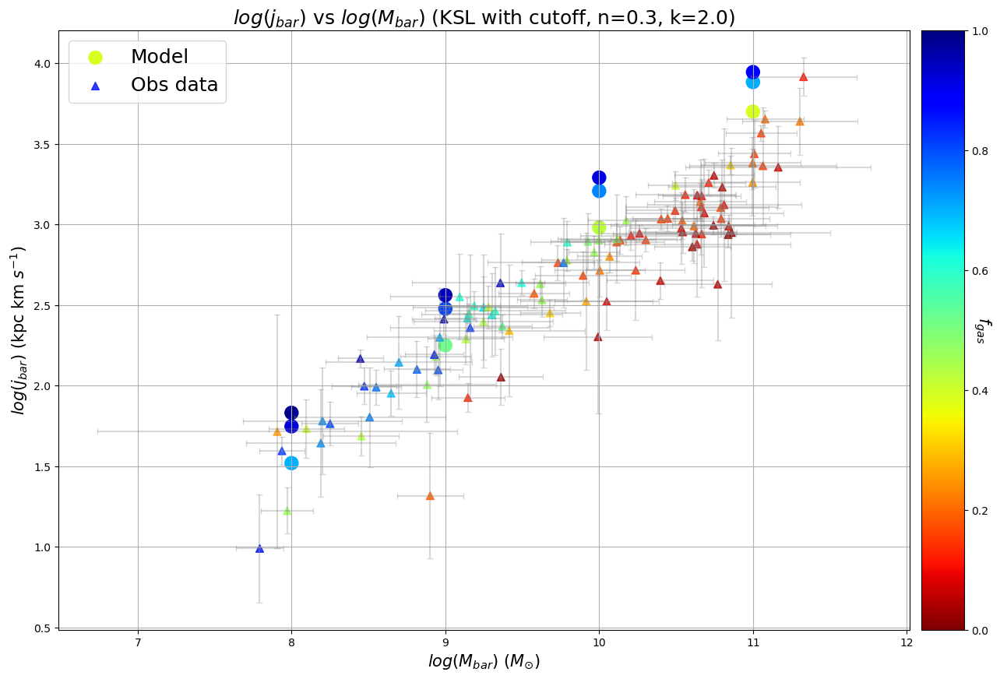

n = 0.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

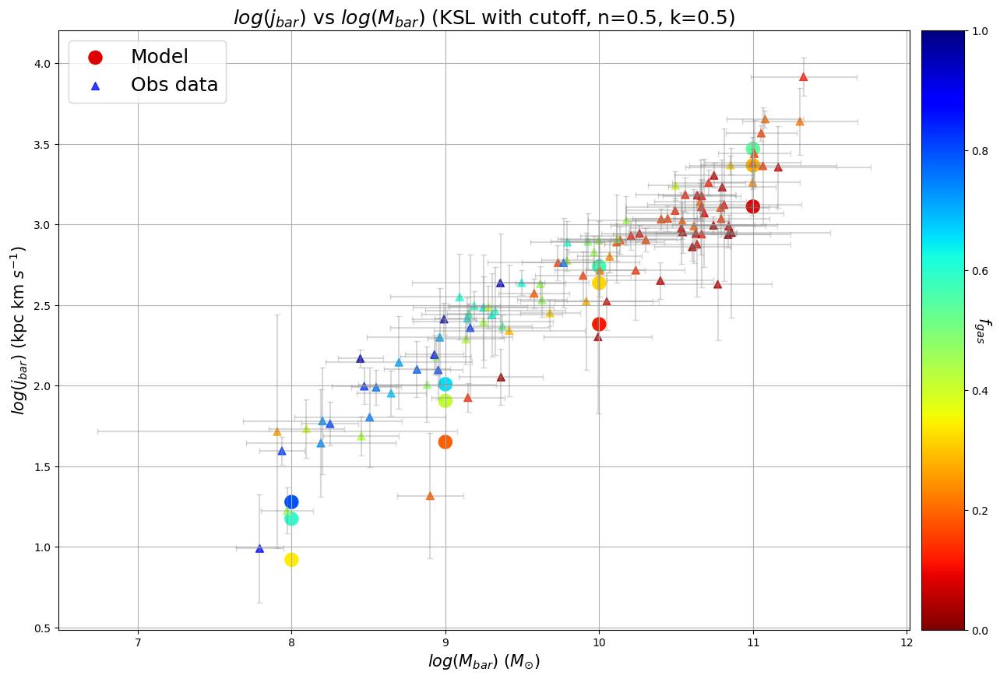

n = 0.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

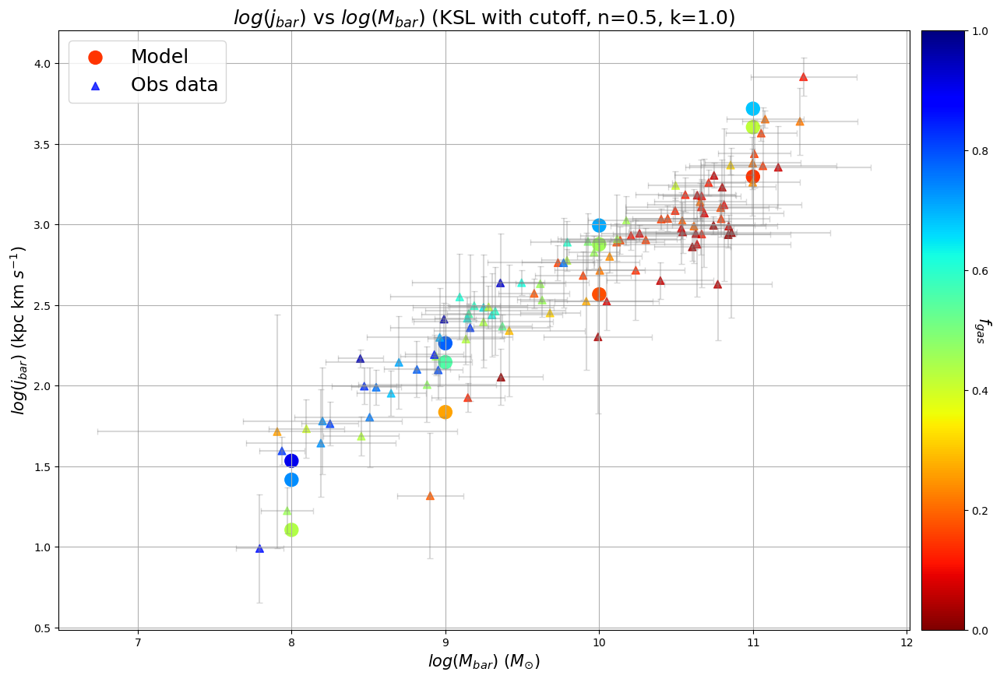

n = 0.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

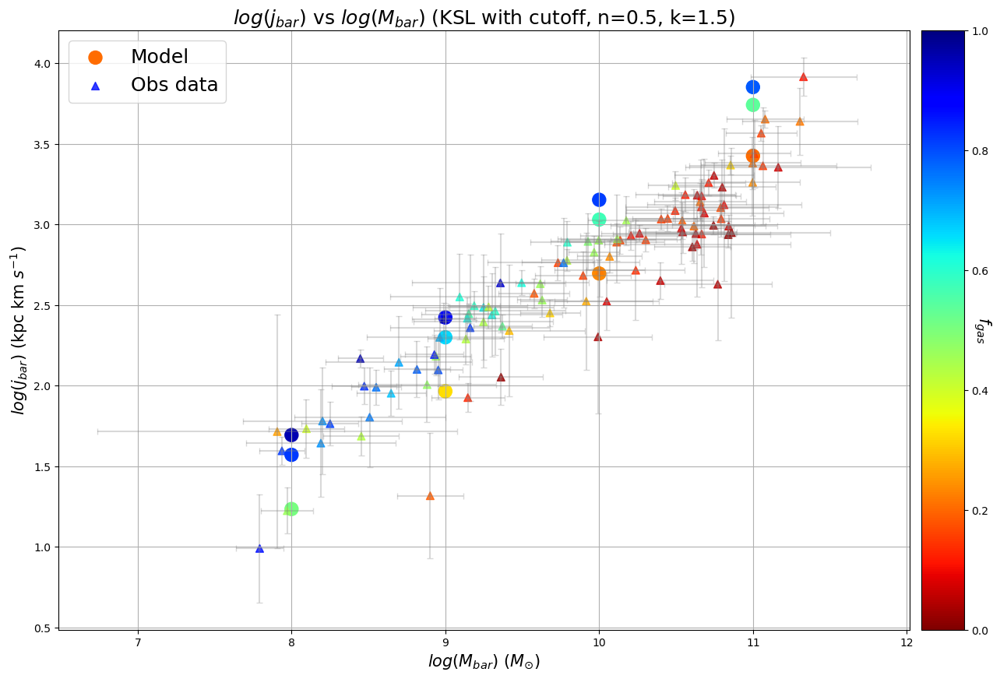

n = 0.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

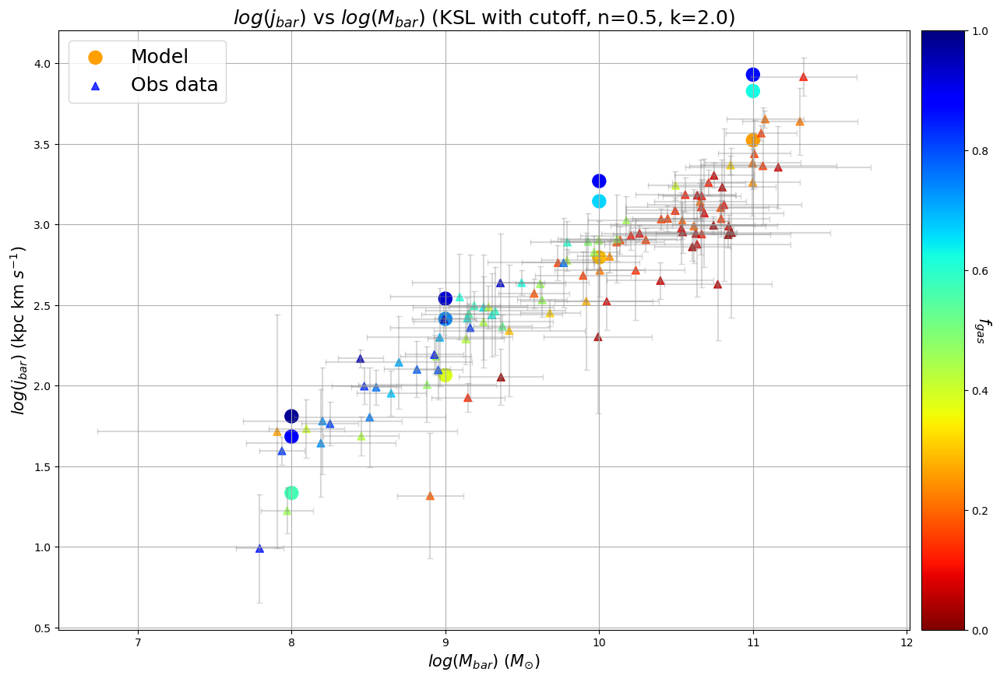

n = 1.0, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

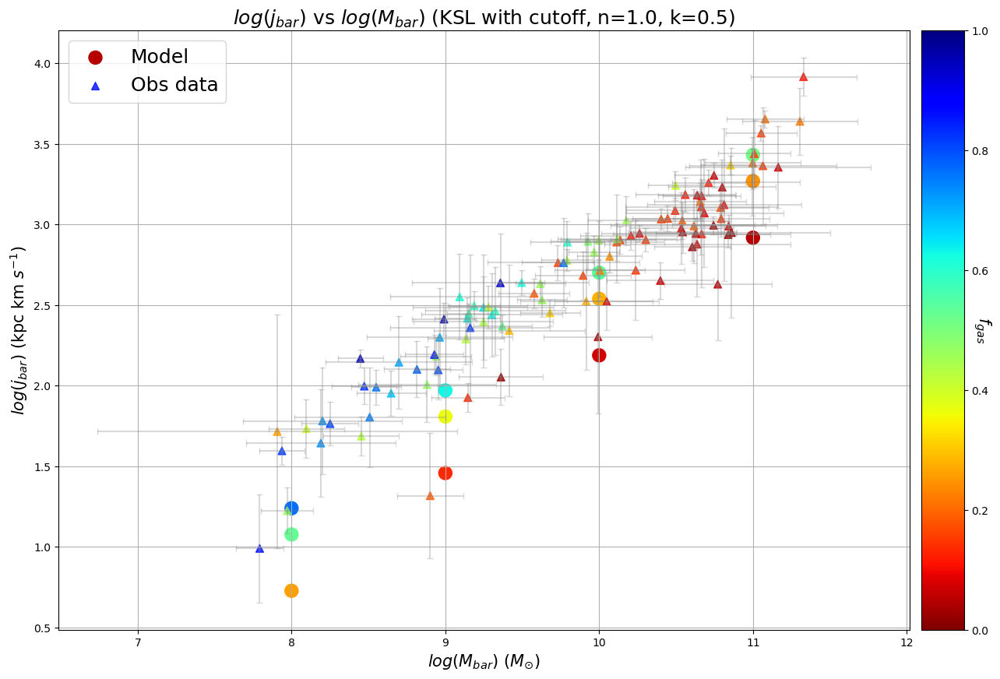

n = 1.0, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

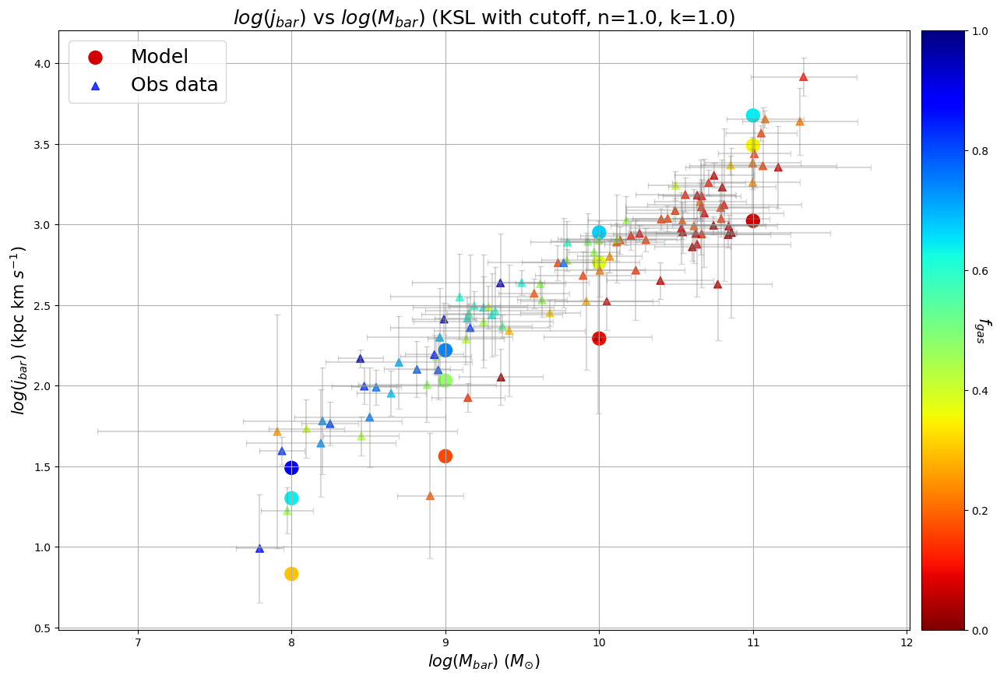

n = 1.0, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

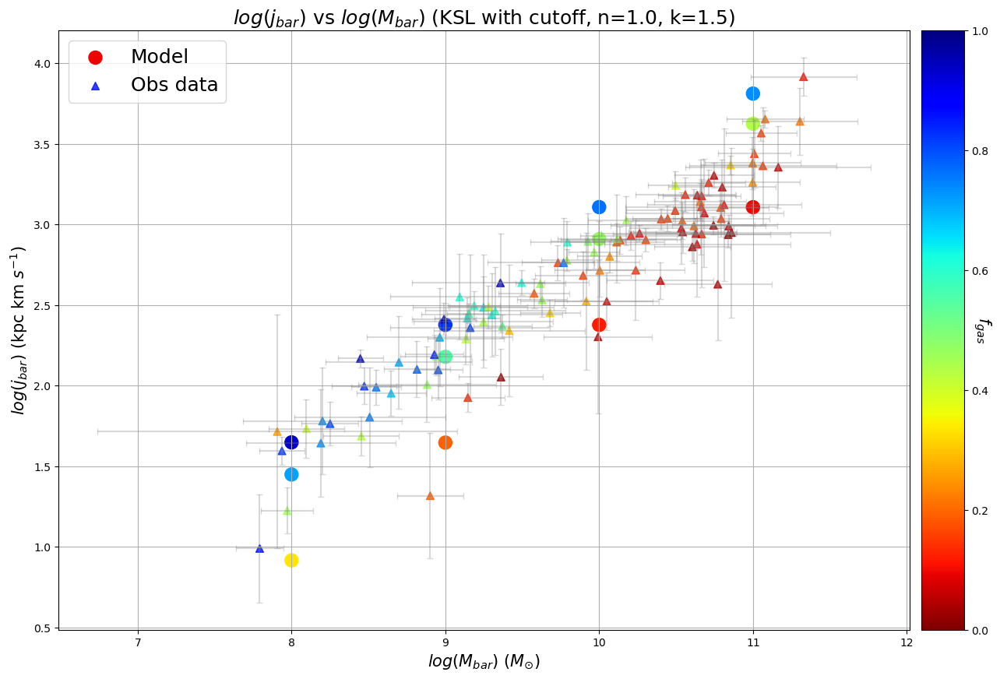

n = 1.0, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

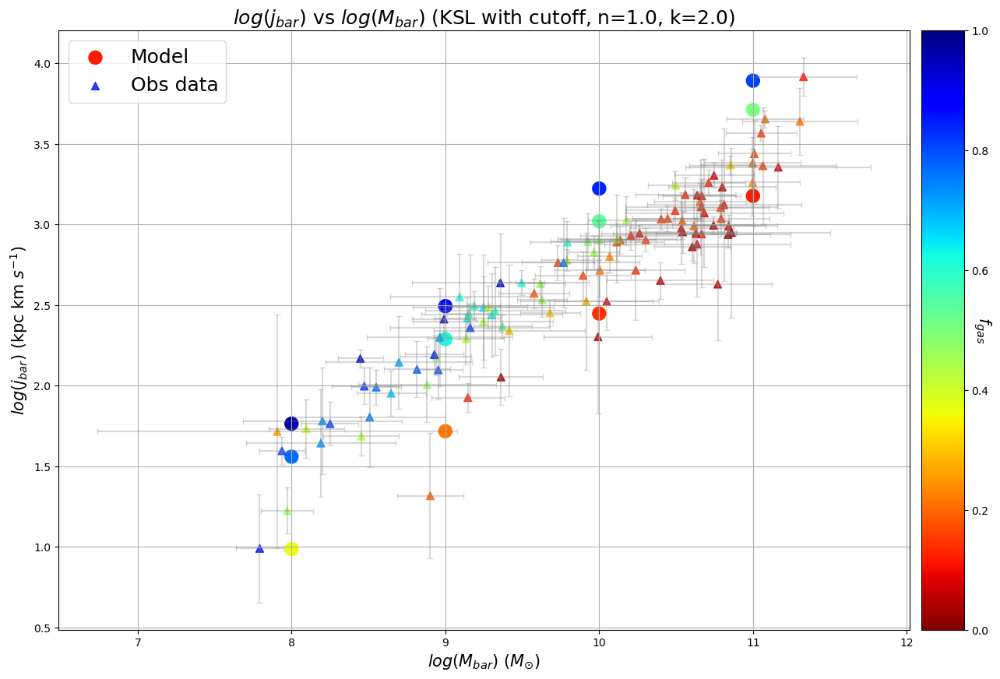

n = 1.5, k = 0.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

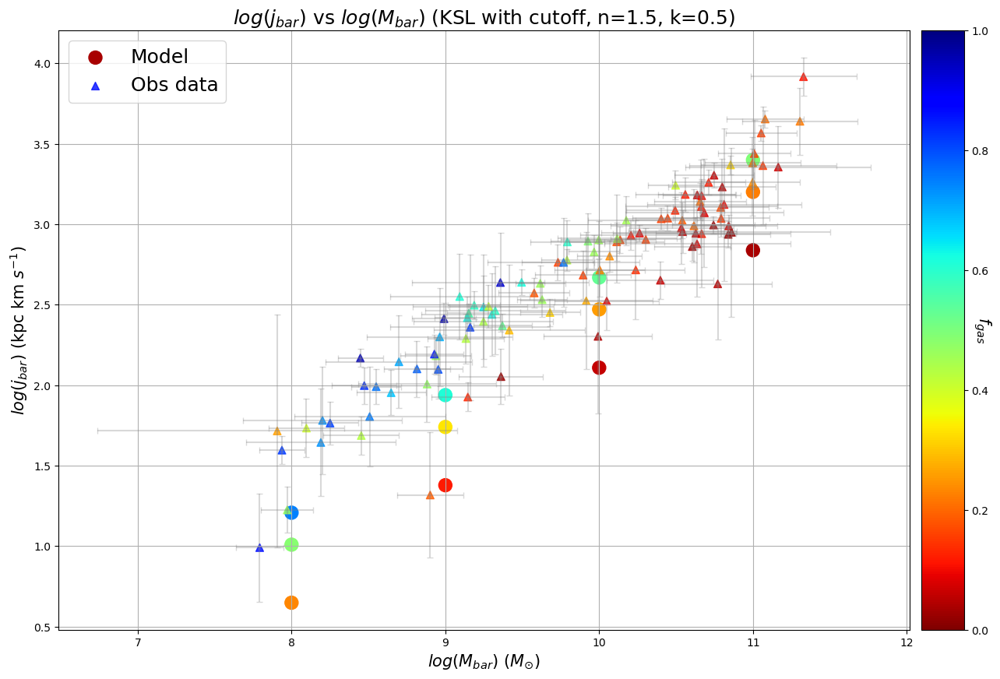

n = 1.5, k = 1.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

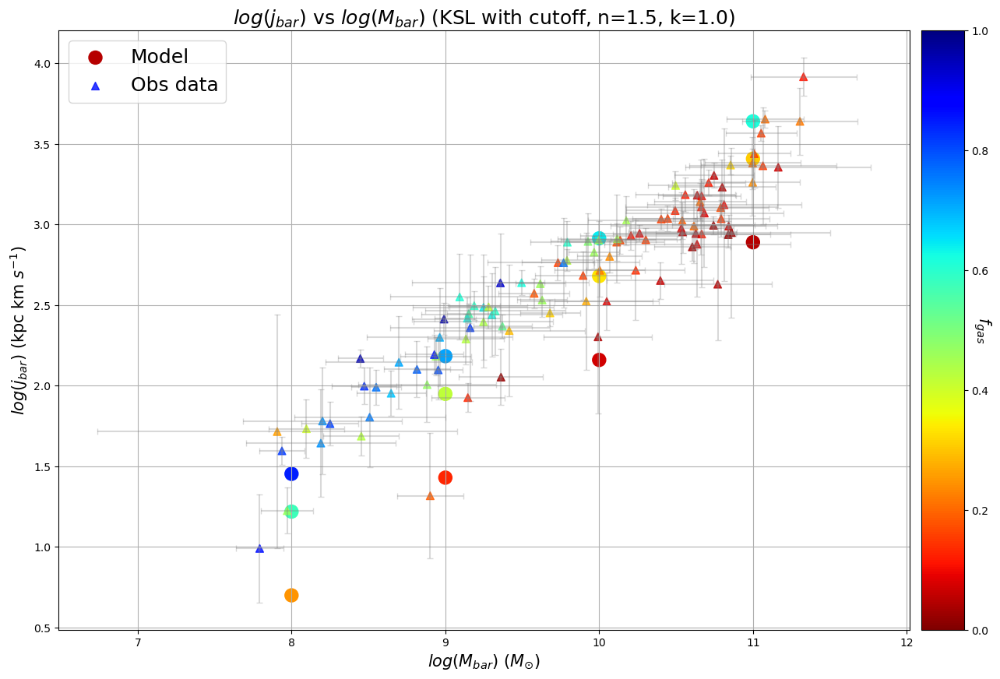

n = 1.5, k = 1.5


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

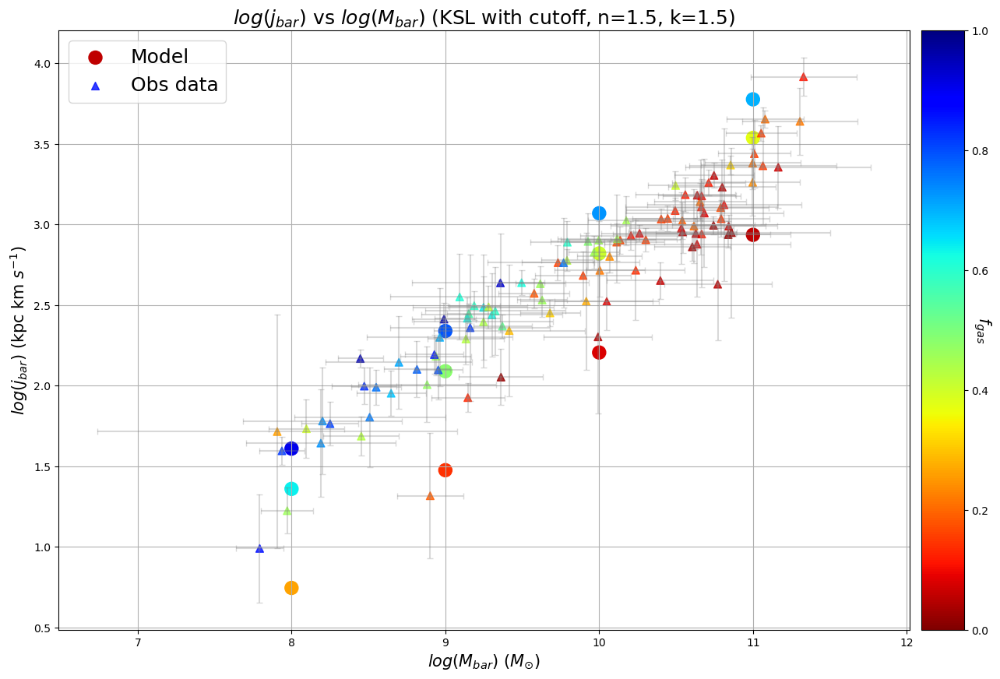

n = 1.5, k = 2.0


/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_2460441/999291585.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar

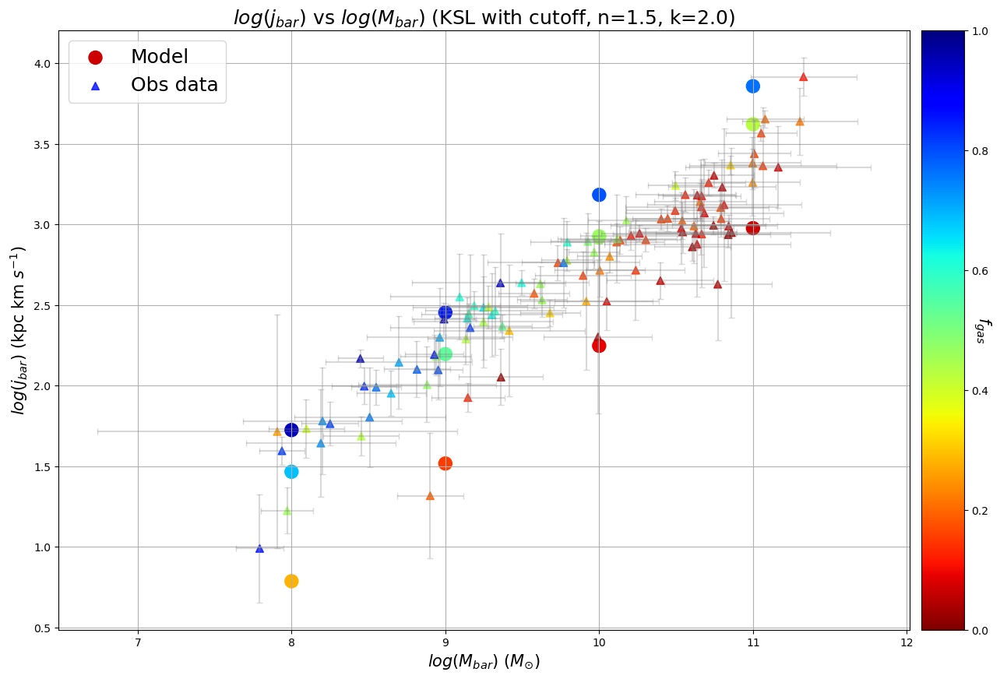

Execution time: 552.9589 seconds


In [ ]:
# for j, n, w, k in zip(range(len(n_values)), n_values, range(len(k_values)), k_values):

for j, n in enumerate(n_values):
    for w, k in enumerate(k_values):
        print(f"n = {n}, k = {k}")

        f_gas_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))
        j_bar_array_temp_cutoff_ksl = np.zeros((len(log_M_bar_array_testing),len(t_acc_array_testing)))

        racc_interp = r_acc_interpolators_matrix[j, w]

        process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array_testing, star_formation_law="cutoff_ksl", interpolator=racc_interp, ns=n, ks=k)

        print(f'Running multiprocessing for M_bar models with {os.cpu_count()} CPUs...')
        with ProcessPoolExecutor() as executor:
            results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array_testing))

        for i, (f_gas_temp, j_bar_temp,_, _, _, _) in enumerate(results):
            f_gas_array_temp_cutoff_ksl[i] = f_gas_temp
            j_bar_array_temp_cutoff_ksl[i] = j_bar_temp

        log_j_bar_array_temp = np.log10(j_bar_array_temp_cutoff_ksl)

        cmap = cm.jet_r
        mpl.rc("image", cmap="jet_r")
        fig = figure(figsize=(15,10),  facecolor='w')
        frame = fig.add_subplot(1,1,1)

        #Model
        divider = make_axes_locatable(frame)
        colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
        for x, y, z in zip(log_M_bar_array_testing, log_j_bar_array_temp, f_gas_array_temp_cutoff_ksl):
            mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=150)
        mod.set_label("Model")
        cbar1 = fig.colorbar(mod, cax=colbarframe1)
        cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

        #Data
        frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
        frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

        frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff"+f", n={n}, k={k})", fontsize = 18)
        frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
        frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
        frame.legend(prop={'size': 18})
        frame.grid()
        show()

# MCMC running

In [48]:
@partial(jax.jit, static_argnames=("star_formation_law", "at_t0"))
def full_from_sigma_jax_mcmc(SD_gas, Mbar, r_pc, dt, star_formation_law, at_t0=True):
    """
    SD_gas: (n_tacc, n_r, n_t)  Σ_gas in Msun/pc^2
    r_pc:   (n_r,) radii in pc
    dt:     scalar time step between entries in M_times1 (Gyr)
    Mbar:   scalar baryonic mass (Msun)

    Returns same outputs as your Full_final_definer (with /1000 for j).
    """
    SD_gas = jnp.asarray(SD_gas)
    r_pc = jnp.asarray(r_pc)
    dr = r_pc[1] - r_pc[0]

    n_tacc, n_r, n_t = SD_gas.shape

    r_col = r_pc[:, None]
    r2_col = r_col**2

    if star_formation_law != "cutoff_ksl":
        raise ValueError("full_from_sigma_jax currently implemented only for 'cutoff_ksl'.")

    R_broad = r_col[None, :, :]
    Sigma_sfr = SFL_jax(SD_gas, "cutoff_ksl", R_broad, Mbar)  # (n_tacc, n_r, n_t)

    integrand_gas = r_col[None, :, :]*SD_gas
    integrand_sfr = r_col[None, :, :]*Sigma_sfr

    def integrate_radius(y):
        return 2.0 * jnp.pi * simpson_uniform_jax(y, dr, axis=0)

    M_gas = jax.vmap(integrate_radius)(integrand_gas)  
    M_sfr = jax.vmap(integrate_radius)(integrand_sfr)  
    M_star = dt*jnp.cumsum(M_sfr, axis=-1)
    M_bar_tot = M_star + M_gas

    f_gas_global = M_gas / M_bar_tot                   

    if at_t0:
        return f_gas_global[:, -1]
    else:
        return f_gas_global
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def Full_final_definer_jax_mcmc(Mbar,
                           t_acc_arr,
                           star_formation_law,
                           r_acc_matrix_for_all_M_jax,
                           log_M_bar_array_jax,
                           res=120,
                           Rmax=100.1,
                           at_t0=True):
    """
    Fully JAX version. Works with t_acc_arr as a jnp.array and
    can be called inside a jitted mass loop.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_matrix_for_all_M_jax : (n_M, n_t) in kpc
    log_M_bar_array_jax : (n_M,) grid used for r_acc_matrix
    """

    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    C_vals = C_def_jax(Mbar, t_acc_arr)

    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    return full_from_sigma_jax_mcmc(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )
    
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_and_jbar_for_galaxies_jax(Mbar_array,
                                   t_acc_array,
                                   star_formation_law,
                                   r_acc_matrix_for_all_M_jax,
                                   log_M_bar_array_jax,
                                   res=120,
                                   Rmax=100.1,
                                   at_t0=True):
    """
    For each galaxy (Mbar, t_acc) return (f_gas(t0), j_bar(t0)) from the full JAX model.
    """

    def per_gal(Mbar, t_acc):
        # length-1 t_acc array
        f_gas_arr, j_bar_arr, _, _, _, _ = Full_final_definer_jax(
            Mbar,
            jnp.array([t_acc], dtype=jnp.float64),
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            res=res,
            Rmax=Rmax,
            at_t0=at_t0,
        )
        # f_gas_arr, j_bar_arr have shape (1,) over t_acc; take element 0
        return f_gas_arr[0], j_bar_arr[0]

    # vmapped over galaxies
    fgas_mod, jbar_mod = jax.vmap(per_gal)(Mbar_array, t_acc_array)
    return fgas_mod, jbar_mod

Execution time: 0.0031 seconds


In [49]:
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def all_obs_for_galaxies_jax(Mbar_array,
                             t_acc_array,
                             star_formation_law,
                             r_acc_matrix_for_all_M_jax,
                             log_M_bar_array_jax,
                             res=120,
                             Rmax=100.1,
                             at_t0=True):
    """
    For each galaxy (Mbar, t_acc) return ALL 6 outputs from the full JAX model:
        (fgas_mod, jbar_mod, jgas_mod, jstar_mod, Mstar_mod, Mgas_mod)
    """

    def per_gal(Mbar, t_acc):
        f_gas, j_bar, j_gas, j_star, M_star, M_gas = Full_final_definer_jax(
            Mbar,
            jnp.array([t_acc], dtype=jnp.float64),
            star_formation_law,
            r_acc_matrix_for_all_M_jax,
            log_M_bar_array_jax,
            res=res,
            Rmax=Rmax,
            at_t0=at_t0,
        )
        return f_gas[0], j_bar[0], j_gas[0], j_star[0], M_star[0], M_gas[0]

    return jax.vmap(per_gal)(Mbar_array, t_acc_array)

Execution time: 0.0011 seconds


### Solve for $\omega_\mathrm{acc}$ from the analytical $j_\mathrm{bar}$

In [50]:
x_grid_jax = jnp.linspace(0.0, 1.0, 256, dtype=jnp.float64)
dx_x = x_grid_jax[1] - x_grid_jax[0]

Execution time: 0.0383 seconds


In [51]:
@jax.jit
def incomplete_gamma_integral_jax(omega, n, t0, upper_limit=1.0):
    """
    Compute the incomplete gamma-like integral:
        ∫_0^{upper_limit} x^n * exp(-omega * t0 * x) dx
    
    numerically using Simpson's rule.
    
    Parameters:
    -----------
    omega : array-like
        The omega parameter(s)
    n : float
        The power of x in the integrand
    t0 : float
        Time parameter (typically age of universe)
    upper_limit : float, default=1.0
        Upper limit of integration
    
    Returns:
    --------
    integral : array-like (same shape as omega)
        The value of the integral
    
    Note:
    -----
    This can be compared to scipy.special.gammainc or scipy.integrate.quad
    for validation purposes.
    """
    omega = jnp.asarray(omega)
    
    # Use the x_grid for integration
    # Note: assumes x_grid_jax goes from 0 to 1 with spacing dx_x
    # If upper_limit != 1, we'd need to scale, but for now keep it at 1
    x = x_grid_jax[None, :] * upper_limit
    dx = dx_x * upper_limit
    
    exponent = -omega[..., None] * (t0 * x)
    integrand = (x**n) * jnp.exp(exponent)
    
    result = simpson_uniform_jax(integrand, dx, axis=-1)
    return result

@jax.jit
def F_omega_jax(omega, n, t0):
    """
    Dimensionless function

        F(omega; n, t0) = ∫_0^1 x^n e^{-omega t0 x} dx  /  ∫_0^1 e^{-omega t0 x} dx

    computed numerically using the incomplete_gamma_integral_jax function.
    This works for both ω>0 and ω<0.

    - For ω → +∞: F → 0
    - For ω = 0 : F = 1/(n+1)
    - For ω → -∞: F → 1
    """
    omega = jnp.asarray(omega)
    
    # Numerator: ∫_0^1 x^n * exp(-omega * t0 * x) dx
    num = incomplete_gamma_integral_jax(omega, n, t0, upper_limit=1.0)
    
    # Denominator: ∫_0^1 exp(-omega * t0 * x) dx = ∫_0^1 x^0 * exp(-omega * t0 * x) dx
    den = incomplete_gamma_integral_jax(omega, 0.0, t0, upper_limit=1.0)
    
    return num / den


@jax.jit
def solve_omega_bisect_jax(y_target, n, t0, omega_min=-1/3, omega_max=1.0, n_iter=40):
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, omega_min)
    hi = jnp.full_like(y_target, omega_max)

    def body_fun(i, state):
        lo, hi = state
        mid = 0.5*(lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        cond = F_mid > y_target

        lo_new = jnp.where(cond, mid, lo)
        hi_new = jnp.where(cond, hi, mid)
        return (lo_new, hi_new)

    lo_final, hi_final = lax.fori_loop(0, n_iter, body_fun, (lo, hi))
    omega = 0.5 * (lo_final + hi_final)
    return omega

@jax.jit
def solve_omega_bisect_autobracket_jax(
    y_target, n, t0,
    omega0=1.0,
    max_expand=60,
    n_iter=40,
):
    """
    Auto-bracket + bisection for monotone DECREASING F(omega).

    Starts with lo=-omega0, hi=+omega0 and expands:
      while F(lo) < y: lo *= 2  (more negative)
      while F(hi) > y: hi *= 2  (more positive)

    Returns:
      omega : array same shape as y_target (NaN where not bracketed)
      ok    : boolean mask where a valid bracket was found; 
              not ok if y_target is <0 or >1, or if F(lo) or F(hi) is non-finite.
    """
    y_target = jnp.asarray(y_target)

    lo = jnp.full_like(y_target, -omega0)
    hi = jnp.full_like(y_target,  omega0)

    def expand_step(i, state):
        lo, hi = state
        F_lo = F_omega_jax(lo, n, t0)
        F_hi = F_omega_jax(hi, n, t0)

        need_lo = F_lo < y_target   # F too small -> move lo more negative
        need_hi = F_hi > y_target   # F too large -> move hi more positive

        lo = jnp.where(need_lo, lo * 1.5, lo)
        hi = jnp.where(need_hi, hi * 1.5, hi)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, max_expand, expand_step, (lo, hi))

    F_lo = F_omega_jax(lo, n, t0)
    F_hi = F_omega_jax(hi, n, t0)

    ok = (jnp.isfinite(F_lo) & jnp.isfinite(F_hi) &
          (F_lo >= y_target) & (F_hi <= y_target))

    # If not bracketed, keep omega as NaN (so you can mask later)
    lo = jnp.where(ok, lo, jnp.nan)
    hi = jnp.where(ok, hi, jnp.nan)

    def bisect_step(i, state):
        lo, hi = state
        mid = 0.5 * (lo + hi)
        F_mid = F_omega_jax(mid, n, t0)

        # for decreasing F: F(mid) > y => root is to the right => lo = mid
        go_right = F_mid > y_target
        lo = jnp.where(go_right, mid, lo)
        hi = jnp.where(go_right, hi,  mid)
        return (lo, hi)

    lo, hi = lax.fori_loop(0, n_iter, bisect_step, (lo, hi))
    omega = 0.5 * (lo + hi)

    return omega, ok

Execution time: 0.0029 seconds


### Get $f_\mathrm{gas}$ from model definer for all galaxies (masses)

In [52]:
@partial(jax.jit, static_argnames=("star_formation_law", "res", "Rmax", "at_t0"))
def fgas_for_galaxies_jax(Mbar_array,
                          t_acc_array,
                          star_formation_law,
                          r_acc_matrix_for_all_M_jax,
                          log_M_bar_array_jax,
                          res=120,
                          Rmax=100.1,
                          at_t0=True):

    def per_gal(Mbar, t_acc):
        # single t_acc, so we pass a length-1 array
        f_gas_arr = Full_final_definer_jax_mcmc(
                Mbar,
                jnp.array([t_acc], dtype=jnp.float64),
                star_formation_law,
                r_acc_matrix_for_all_M_jax,
                log_M_bar_array_jax,
                res=res,
                Rmax=Rmax,
                at_t0=at_t0,
            )
        return f_gas_arr

    return jax.vmap(per_gal)(Mbar_array, t_acc_array)

def j_minner(Mbar):
    jmax = j_maxer(Mbar)
    return jmax / 10.0

Execution time: 0.0015 seconds


### Log Likelihood

In [53]:
@jax.jit
def logL_jax(theta, logM_obs, jbar_obs, fgas_obs, sigma_fgas_obs, sigma_j_obs,
             r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, 
             t0=12.0, omega_min=-10.0, omega_max=10.0):
    """
    Joint log-likelihood in f_gas, with j_bar likelihood for clipped galaxies.

    theta            : array-like [n, k]
    logM_obs         : (Ngal,) log10(Mbar_obs)
    jbar_obs         : (Ngal,) observed j_bar (same units as j_maxer)
    fgas_obs         : (Ngal,) observed gas fraction
    sigma_fgas_obs   : (Ngal,) 1-sigma errors on f_gas
    sigma_j_obs      : (Ngal,) 1-sigma errors on j_bar
    r_acc_matrix_for_all_M_jax : (n_M, n_t) accretion radii grid (kpc)
    log_M_bar_array_jax        : (n_M,) log10(Mbar) grid used for r_acc_matrix
    omega_min        : minimum omega; unbracketable galaxies with y_raw < 0 get this
    omega_max        : maximum omega; unbracketable galaxies with y_raw > 1 or 
                       successfully bracketed galaxies with omega > omega_max get this
    """
    
    n = theta[0]
    k = theta[1]

    def invalid():
        return -jnp.inf

    def body():
        Mbar_obs = 10.0**logM_obs
        j_max = j_maxer(Mbar_obs)
        j_min = j_max/10.0
        delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
        y_raw = (jbar_obs - j_min)/(delta_j)

        # Use autobracket solver (no fixed bounds)
        omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)

        # For galaxies that couldn't be bracketed (ok=False), 
        # assign omega_min or omega_max based on y_raw
        omega_assigned = jnp.where(ok, omega, jnp.where(y_raw < 0.0,
                omega_max,  # y_raw < 0 --> need very positive omega
                omega_min   # y_raw > 1 --> need very negative omega
            )
        )

        # Track which galaxies are outside [omega_min, omega_max]
        # These include: failed brackets + successfully bracketed but omega > omega_max
        was_clipped = (~ok) | (ok & (omega_assigned > omega_max)) | (ok & (omega_assigned < omega_min))
        
        # Clip all omega to [omega_min, omega_max]
        omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)

        # Safe omega for t_acc calculation
        omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                               jnp.sign(omega_clipped)*1e-4, omega_clipped)
        t_acc = 1.0/omega_safe

        # Compute model for all galaxies
        fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
            Mbar_obs, t_acc, "cutoff_ksl",
            r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

        # f_gas likelihood for all galaxies
        sig_f = jnp.maximum(sigma_fgas_obs, 4e-3)
        resid_f = (fgas_mod - fgas_obs) / sig_f
        logL_f = -0.5 * jnp.sum(resid_f**2)

        # j_bar likelihood ONLY for clipped galaxies
        sig_j = jnp.maximum(sigma_j_obs, 1e-6)
        resid_j = (jbar_mod - jbar_obs) / sig_j
        logL_j = -0.5 * jnp.sum(jnp.where(was_clipped, resid_j**2, 0.0))

        return logL_f + logL_j

    return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

Execution time: 0.0022 seconds


In [54]:
@jax.jit
def logL_4obs_jax(theta, logM_obs, jbar_obs,
                  Mgas_obs, sigma_Mgas, Mstar_obs, sigma_Mstar,
                  jgas_obs, sigma_jgas, jstar_obs, sigma_jstar,
                  sigma_jbar,
                  r_acc_matrix_for_all_M_jax, log_M_bar_array_jax,
                  t0=12.0, omega_min=-10.0, omega_max=10.0):
    """
    4-observable log-likelihood: chi2 on (Mgas, Mstar, jgas, jstar) for ALL galaxies,
    plus j_bar penalty for clipped/failed galaxies (same omega inversion as logL_jax).
    All comparisons in linear space.
    """
    n = theta[0]
    k = theta[1]

    def invalid():
        return -jnp.inf

    def body():
        Mbar_obs = 10.0**logM_obs
        j_max = j_maxer(Mbar_obs)
        j_min = j_max / 10.0
        delta_j = jnp.maximum(k * j_max - j_min, 1e-12)
        y_raw = (jbar_obs - j_min) / delta_j

        omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)

        omega_assigned = jnp.where(
            ok, omega,
            jnp.where(y_raw < 0.0, omega_max, omega_min)
        )

        was_clipped = (~ok) | (ok & (omega_assigned > omega_max)) | (ok & (omega_assigned < omega_min))
        omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)

        omega_safe = jnp.where(
            jnp.abs(omega_clipped) < 1e-4,
            jnp.sign(omega_clipped) * 1e-4, omega_clipped
        )
        t_acc = 1.0 / omega_safe

        fgas_mod, jbar_mod, jgas_mod, jstar_mod, Mstar_mod, Mgas_mod = \
            all_obs_for_galaxies_jax(
                Mbar_obs, t_acc, "cutoff_ksl",
                r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

        sig_Mgas  = jnp.maximum(sigma_Mgas,  1e-6)
        sig_Mstar = jnp.maximum(sigma_Mstar, 1e-6)
        sig_jgas  = jnp.maximum(sigma_jgas,  1e-6)
        sig_jstar = jnp.maximum(sigma_jstar, 1e-6)

        logL_Mgas  = -0.5 * jnp.sum(((Mgas_mod  - Mgas_obs)  / sig_Mgas)**2)
        logL_Mstar = -0.5 * jnp.sum(((Mstar_mod - Mstar_obs) / sig_Mstar)**2)
        logL_jgas  = -0.5 * jnp.sum(((jgas_mod  - jgas_obs)  / sig_jgas)**2)
        logL_jstar = -0.5 * jnp.sum(((jstar_mod - jstar_obs) / sig_jstar)**2)

        sig_j = jnp.maximum(sigma_jbar, 1e-6)
        resid_j = (jbar_mod - jbar_obs) / sig_j
        logL_j = -0.5 * jnp.sum(jnp.where(was_clipped, resid_j**2, 0.0))

        return logL_Mgas + logL_Mstar + logL_jgas + logL_jstar + logL_j

    return lax.cond((n <= 0.0) | (k <= 0.0), lambda _: invalid(), lambda _: body(), operand=None)

Execution time: 0.0027 seconds


In [55]:
def make_log_probability(logM_obs_jax,
                         jbar_obs_jax,
                         fgas_obs_jax,
                         sigma_fgas_jax,
                         sigma_jbar_jax,
                         log_M_bar_array_jax):

    @jax.jit
    def logL_fixed_obs(theta_jax, r_acc_matrix_jax):
        return logL_jax(theta_jax,
                        logM_obs_jax,
                        jbar_obs_jax,
                        fgas_obs_jax,
                        sigma_fgas_jax,
                        sigma_jbar_jax,
                        r_acc_matrix_jax,
                        log_M_bar_array_jax,
                        t0=12.0)

    def log_prior(theta):
        n, k = theta
        if 0.1 < n < 2.5 and 1.0 < k < 3.0:
            return 0.0
        return -np.inf

    def log_probability(theta):
        """
        This is what emcee will call.
        theta is a numpy array [n, k].
        """
        lp = log_prior(theta)
        if not np.isfinite(lp):
            return lp

        n, k = theta

        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k, seed=seed)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_fixed_obs(theta_jax, r_acc_matrix_jax))

        if not np.isfinite(ll):
            return -np.inf

        return lp + ll

    return log_probability

# blackjax version
def make_log_probability_jax(logM_obs_jax,
                             jbar_obs_jax,
                             fgas_obs_jax,
                             sigma_fgas_jax,
                             sigma_jbar_jax,
                             log_M_bar_array_jax):

    @jax.jit
    def log_probability(theta):
        theta = jnp.reshape(theta, (-1,))
        n, k = theta[0], theta[1]
        in_bounds = (n > 0.1) & (n < 2.5) & (k > 1.0) & (k < 3.0)

        def body(_):
            r_acc_matrix_jax = build_r_acc_matrix_for_all_M_jax(n, k, key=key)
            return logL_jax(theta,
                            logM_obs_jax,
                            jbar_obs_jax,
                            fgas_obs_jax,
                            sigma_fgas_jax,
                            sigma_jbar_jax,
                            r_acc_matrix_jax,
                            log_M_bar_array_jax,
                            t0=12.0)

        return jax.lax.cond(in_bounds, body, lambda _: -jnp.inf, operand=None)

    return log_probability

class LogProbabilityEmcee:
    """
    Callable class for emcee that wraps logL_jax.
    Unlike closures, class instances can be pickled for multiprocessing.
    """
    def __init__(self, logM_obs_jax, jbar_obs_jax, fgas_obs_jax,
                 sigma_fgas_jax, sigma_jbar_jax, log_M_bar_array_jax):
        # Store all observation data as instance attributes
        self.logM_obs_jax = logM_obs_jax
        self.jbar_obs_jax = jbar_obs_jax
        self.fgas_obs_jax = fgas_obs_jax
        self.sigma_fgas_jax = sigma_fgas_jax
        self.sigma_jbar_jax = sigma_jbar_jax
        self.log_M_bar_array_jax = log_M_bar_array_jax
        
        # Prior bounds
        self.n_bounds = (0.1, 2.5)
        self.k_bounds = (1.0, 3.0)
    
    def log_prior(self, theta):
        n, k = theta
        if self.n_bounds[0] < n < self.n_bounds[1] and self.k_bounds[0] < k < self.k_bounds[1]:
            return 0.0
        return -np.inf
    
    def __call__(self, theta):
        """Called by emcee for each walker position."""
        lp = self.log_prior(theta)
        if not np.isfinite(lp):
            return lp
        
        n, k = theta
        
        # Build r_acc matrix for this (n, k)
        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k, seed=seed)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)
        
        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_jax(theta_jax,
                           self.logM_obs_jax,
                           self.jbar_obs_jax,
                           self.fgas_obs_jax,
                           self.sigma_fgas_jax,
                           self.sigma_jbar_jax,
                           r_acc_matrix_jax,
                           self.log_M_bar_array_jax,
                           t0=12.0))
        
        if not np.isfinite(ll):
            return -np.inf
        
        return lp + ll

Execution time: 0.0043 seconds


In [56]:
class LogProbabilityEmcee4Obs:
    """
    Callable class for emcee that wraps logL_4obs_jax.
    Uses 4 observables: (Mgas, Mstar, jgas, jstar) instead of f_gas alone.
    """
    def __init__(self, logM_obs_jax, jbar_obs_jax,
                 Mgas_obs_jax, sigma_Mgas_jax,
                 Mstar_obs_jax, sigma_Mstar_jax,
                 jgas_obs_jax, sigma_jgas_jax,
                 jstar_obs_jax, sigma_jstar_jax,
                 sigma_jbar_jax, log_M_bar_array_jax):
        self.logM_obs_jax    = logM_obs_jax
        self.jbar_obs_jax    = jbar_obs_jax
        self.Mgas_obs_jax    = Mgas_obs_jax
        self.sigma_Mgas_jax  = sigma_Mgas_jax
        self.Mstar_obs_jax   = Mstar_obs_jax
        self.sigma_Mstar_jax = sigma_Mstar_jax
        self.jgas_obs_jax    = jgas_obs_jax
        self.sigma_jgas_jax  = sigma_jgas_jax
        self.jstar_obs_jax   = jstar_obs_jax
        self.sigma_jstar_jax = sigma_jstar_jax
        self.sigma_jbar_jax  = sigma_jbar_jax
        self.log_M_bar_array_jax = log_M_bar_array_jax

        # Prior bounds (unchanged)
        self.n_bounds = (0.1, 2.5)
        self.k_bounds = (1.0, 3.0)

    def log_prior(self, theta):
        n, k = theta
        if self.n_bounds[0] < n < self.n_bounds[1] and self.k_bounds[0] < k < self.k_bounds[1]:
            return 0.0
        return -np.inf

    def __call__(self, theta):
        """Called by emcee for each walker position."""
        lp = self.log_prior(theta)
        if not np.isfinite(lp):
            return lp

        n, k = theta

        r_acc_matrix_np = build_r_acc_matrix_for_all_M(n, k, seed=seed)
        r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

        theta_jax = jnp.array(theta, dtype=jnp.float64)
        ll = float(logL_4obs_jax(
            theta_jax,
            self.logM_obs_jax,
            self.jbar_obs_jax,
            self.Mgas_obs_jax,  self.sigma_Mgas_jax,
            self.Mstar_obs_jax, self.sigma_Mstar_jax,
            self.jgas_obs_jax,  self.sigma_jgas_jax,
            self.jstar_obs_jax, self.sigma_jstar_jax,
            self.sigma_jbar_jax,
            r_acc_matrix_jax,
            self.log_M_bar_array_jax,
            t0=12.0))

        if not np.isfinite(ll):
            return -np.inf

        return lp + ll

Execution time: 0.0022 seconds


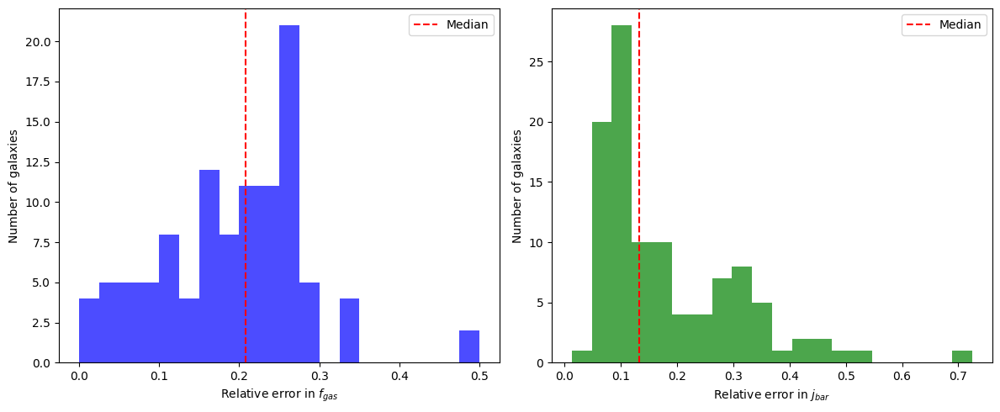

Execution time: 0.1505 seconds


In [57]:
# plot relative errors in f_gas and j_bar (in two separate histograms) and show the median values
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
rel_errors_fgas = BARY['e_fgas'] / BARY['fgas']
plt.hist(rel_errors_fgas, bins=20, color='blue', alpha=0.7)
plt.axvline(np.median(rel_errors_fgas), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $f_{gas}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.subplot(1,2,2)
rel_errors_jbar = BARY['e_j'] / BARY['j']
plt.hist(rel_errors_jbar, bins=20, color='green', alpha=0.7)
plt.axvline(np.median(rel_errors_jbar), color='red', linestyle='dashed', label='Median')
plt.xlabel('Relative error in $j_{bar}$')
plt.ylabel('Number of galaxies')
plt.legend()
plt.tight_layout()
plt.show()

In [58]:
print(np.median(rel_errors_fgas), np.median(rel_errors_jbar))

0.20833333333333334 0.13209003215434084
Execution time: 0.0014 seconds


In [59]:
# ── 4-observable MCMC data from CONVERGED (77 galaxies) ──
print(f"Galaxies for MCMC: {len(CONVERGED)}")

obs_log_Mbar_mcmc    = np.log10(CONVERGED['Mbar'].values.astype(float))
obs_jbar_mcmc        = CONVERGED['jbar'].values.astype(float)
obs_jbar_errors_mcmc = CONVERGED['e_jbar'].values.astype(float)

obs_Mgas_mcmc        = CONVERGED['Mgas'].values.astype(float)
obs_Mgas_errors_mcmc = CONVERGED['e_Mgas'].values.astype(float)
obs_Mstar_mcmc       = CONVERGED['Mstar'].values.astype(float)
obs_Mstar_errors_mcmc= CONVERGED['e_Mstar'].values.astype(float)
obs_jgas_mcmc        = CONVERGED['jgas'].values.astype(float)
obs_jgas_errors_mcmc = CONVERGED['e_jgas'].values.astype(float)
obs_jstar_mcmc       = CONVERGED['jstar'].values.astype(float)
obs_jstar_errors_mcmc= CONVERGED['e_jstar'].values.astype(float)

obs_fgas_mcmc        = CONVERGED['fgas'].values.astype(float)
obs_fgas_errors_mcmc = CONVERGED['e_fgas'].values.astype(float)

Galaxies for MCMC: 77
Execution time: 0.0014 seconds


In [60]:
logM_obs_jax    = jnp.array(obs_log_Mbar_mcmc, dtype=jnp.float64)
jbar_obs_jax    = jnp.array(obs_jbar_mcmc, dtype=jnp.float64)
sigma_jbar_jax  = jnp.array(obs_jbar_errors_mcmc, dtype=jnp.float64)

Mgas_obs_jax    = jnp.array(obs_Mgas_mcmc, dtype=jnp.float64)
sigma_Mgas_jax  = jnp.array(obs_Mgas_errors_mcmc, dtype=jnp.float64)
Mstar_obs_jax   = jnp.array(obs_Mstar_mcmc, dtype=jnp.float64)
sigma_Mstar_jax = jnp.array(obs_Mstar_errors_mcmc, dtype=jnp.float64)
jgas_obs_jax    = jnp.array(obs_jgas_mcmc, dtype=jnp.float64)
sigma_jgas_jax  = jnp.array(obs_jgas_errors_mcmc, dtype=jnp.float64)
jstar_obs_jax   = jnp.array(obs_jstar_mcmc, dtype=jnp.float64)
sigma_jstar_jax = jnp.array(obs_jstar_errors_mcmc, dtype=jnp.float64)

fgas_obs_jax    = jnp.array(obs_fgas_mcmc, dtype=jnp.float64)
sigma_fgas_jax  = jnp.array(obs_fgas_errors_mcmc, dtype=jnp.float64)

logM_grid_jax   = jnp.array(log_M_bar_array, dtype=jnp.float64)

print(f"Ngal = {len(logM_obs_jax)}")

Ngal = 77
Execution time: 0.0093 seconds


In [61]:
def count_problematic_galaxies(n_val, k_val, omega_max, 
                                logM_obs_jax, jbar_obs_jax, t0=12.0):
    """
    Count galaxies with problematic omega values for given (n, k).
    
    Returns:
        n_failed_inversion: galaxies where autobracket solver failed
        n_above_omega_max: galaxies with omega > omega_max (but solver succeeded)
        n_below_omega_min: galaxies with omega < omega_min (if you want to track this)
    """
    theta = jnp.array([n_val, k_val])
    n, k = n_val, k_val
    
    Mbar_obs = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar_obs)
    j_min = j_max/10.0
    delta_j = jnp.maximum(k*j_max - j_min, 1e-12)
    y_raw = (jbar_obs_jax - j_min)/(delta_j)
    
    # Solve for omega
    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n, t0)
    
    # Count statistics
    n_total = len(logM_obs_jax)
    n_failed_inversion = int(jnp.sum(~ok))
    n_above_omega_max = int(jnp.sum(ok & (omega > omega_max)))
    n_below_omega_min = int(jnp.sum(ok & (omega < -omega_max)))  # negative extreme
    
    return {
        'n_total': n_total,
        'n_failed_inversion': n_failed_inversion,
        'n_above_omega_max': n_above_omega_max,
        'n_below_omega_min': n_below_omega_min,
        'total_problematic': n_failed_inversion + n_above_omega_max + n_below_omega_min,
    }

def create_omega_problem_table(n_values, k_values, omega_max_values, 
                                logM_obs_jax, jbar_obs_jax, t0=12.0):
    """
    Create a table showing problematic galaxies for different (n, k, omega_max) combinations.
    """
    results = []
    
    for omega_max in omega_max_values:
        for n_val in n_values:
            for k_val in k_values:
                counts = count_problematic_galaxies(
                    n_val, k_val, omega_max, 
                    logM_obs_jax, jbar_obs_jax, t0
                )
                results.append({
                    'n': n_val,
                    'k': k_val,
                    'omega_max': omega_max,
                    **counts,
                    'pct_problematic': 100 * counts['total_problematic'] / counts['n_total']
                })
    
    return pd.DataFrame(results)

# Example usage (uncomment and modify as needed):
n_values = [0.5, 1.0, 1.5, 2.0]
k_values = [1.0, 1.5, 2.0, 2.5]
omega_max_values = [25.0]

df_problems = create_omega_problem_table(
    n_values, k_values, omega_max_values,
    logM_obs_jax, jbar_obs_jax
)

print("\nNumber of problematic galaxies (Summary Table):")

# Display pivot table for each omega_max
for omega_max in omega_max_values:
    print(f"\n=== omega_max = {omega_max} Gyr^-1 ===")
    subset = df_problems[df_problems['omega_max'] == omega_max]
    pivot = subset.pivot_table(
        values='total_problematic',
        index='n',
        columns='k',
        aggfunc='sum'
    )
    print(pivot)


Number of problematic galaxies (Summary Table):

=== omega_max = 25.0 Gyr^-1 ===
k    1.0  1.5  2.0  2.5
n                      
0.5   14    2    0    1
1.0   14    2    0    0
1.5   14    2    0    0
2.0   14    2    0    0
Execution time: 0.3933 seconds


Solved omega for 77 galaxies in 0.00016 seconds.

Unsolved galaxies (after fixing):
  Galaxy 1: y_raw=1.2400, logM_bar=7.9, assigned omega=-10.0
  Galaxy 4: y_raw=1.4573, logM_bar=8.4, assigned omega=-10.0
  Galaxy 63: y_raw=1.1517, logM_bar=9.1, assigned omega=-10.0
N galaxies           : 77
Solved (ok)          : 74   (0.961)
Unsolved             : 3; 0.039
omega range (solved) : [-1.943, 26.38]
omega<0              : 14; 0.189
omega>10             : 5; 0.068
y_raw range          : [0.07383, 1.457]


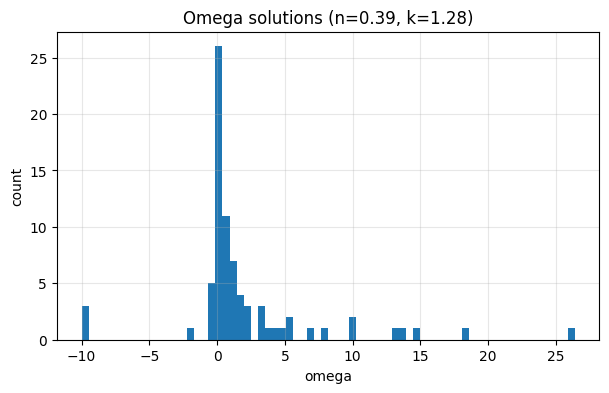

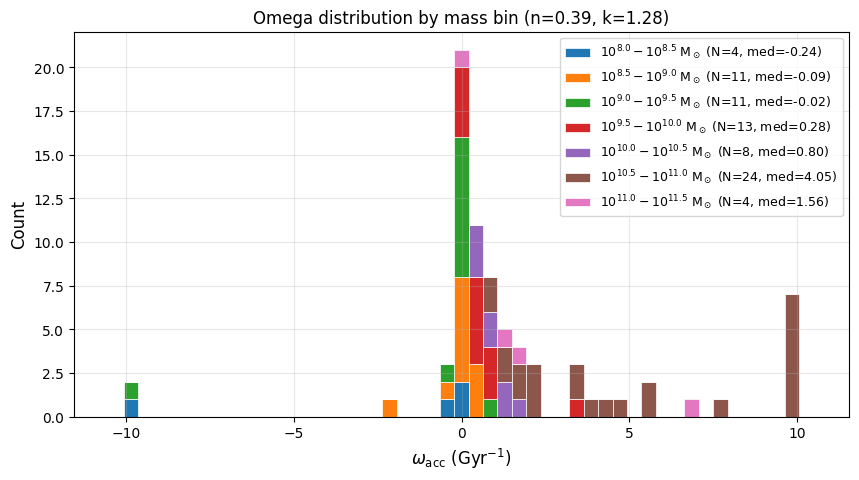


Omega statistics by mass bin (omega capped at 10 Gyr^-1):
------------------------------------------------------------
  $10^{8.0} - 10^{8.5}$      N=  4   median= -0.24   std=4.28
  $10^{8.5} - 10^{9.0}$      N= 11   median= -0.09   std=0.63
  $10^{9.0} - 10^{9.5}$      N= 11   median= -0.02   std=2.91
  $10^{9.5} - 10^{10.0}$     N= 13   median=  0.28   std=0.86
  $10^{10.0} - 10^{10.5}$    N=  8   median=  0.80   std=0.43
  $10^{10.5} - 10^{11.0}$    N= 24   median=  4.05   std=3.50
  $10^{11.0} - 10^{11.5}$    N=  4   median=  1.56   std=2.48
Execution time: 0.2188 seconds


In [107]:
n_test = 0.39
k_test = 1.28
t0 = 12.0

Mbar_obs = 10.0**logM_obs_jax
j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0
delta_j = k_test*j_max - j_min

y_raw = (jbar_obs_jax - j_min) / (delta_j)

time_0 = time.time()
omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
time_1 = time.time()
print(f"Solved omega for {y_raw.size} galaxies in {time_1 - time_0:.5f} seconds.")

omega_np = np.array(jax.device_get(omega))
ok_np = np.asarray(jax.device_get(ok))
y_np = np.asarray(jax.device_get(y_raw))

# Fix unsolved galaxies
unsolved = ~ok_np
omega_np[unsolved & (y_np > 1)] = -10.0  # omega_min for y_raw > 1
omega_np[unsolved & (y_np < 0)] = 10.0   # omega_max for y_raw < 0

#print unsolved galaxies
print("\nUnsolved galaxies (after fixing):")
for idx in np.where(unsolved)[0]:
    print(f"  Galaxy {idx}: y_raw={y_np[idx]:.4f}, logM_bar={np.log10(Mbar_obs[idx]):.1f}, assigned omega={omega_np[idx]:.1f}")

mask = ok_np & np.isfinite(omega_np)

print(f"N galaxies           : {len(y_np)}")
print(f"Solved (ok)          : {mask.sum()}   ({mask.sum()/len(y_np):.3f})")
print(f"Unsolved             : {(unsolved).sum()}; {(unsolved).sum()/len(y_np):.3f}")
if mask.any():
    print(f"omega range (solved) : [{omega_np[mask].min():.4g}, {omega_np[mask].max():.4g}]")
    print(f"omega<0              : {(omega_np[mask] < 0.).sum()}; {(omega_np[mask] < 0.).mean():.3f}")
    print(f"omega>10             : {(omega_np[mask] > 10.0).sum()}; {(omega_np[mask] > 10.0).mean():.3f}")
    print(f"y_raw range          : [{np.nanmin(y_np):.4g}, {np.nanmax(y_np):.4g}]")

plt.figure(figsize=(7,4))
plt.hist(omega_np, bins=70)
plt.xlabel("omega")
plt.ylabel("count")
plt.title(f"Omega solutions (n={n_test}, k={k_test})")
plt.grid(True, alpha=0.3)
plt.show()

logM_obs_np = np.asarray(jax.device_get(logM_obs_jax))

# Define mass bins
mass_bins = np.arange(8, 12, 0.5)
mass_bin_labels = [rf'$10^{{{mass_bins[i]}}} - 10^{{{mass_bins[i+1]}}}$' for i in range(len(mass_bins)-1)]
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2']

omega_capped = np.clip(omega_np, None, 10.0)

hist_bins = np.linspace(np.min(omega_capped)-0.5, np.max(omega_capped)+0.5, 50)

# Collect omega values for each mass bin
omega_by_mass = []
labels_with_stats = []

for i in range(len(mass_bins) - 1):
    mass_mask = (logM_obs_np >= mass_bins[i]) & (logM_obs_np < mass_bins[i+1])
    # combined_mask = mask & mass_mask
    omega_in_bin = omega_capped[mass_mask]
    omega_by_mass.append(omega_in_bin)
    
    if len(omega_in_bin) > 0:
        median_omega = np.median(omega_in_bin)
        labels_with_stats.append(f'{mass_bin_labels[i]} M$_\\odot$ (N={len(omega_in_bin)}, med={median_omega:.2f})')
    else:
        labels_with_stats.append(f'{mass_bin_labels[i]} M$_\\odot$ (N=0)')

plt.figure(figsize=(10, 5))
plt.hist(omega_by_mass, bins=hist_bins, stacked=True, color=colors[:len(omega_by_mass)], 
         label=labels_with_stats, edgecolor='white', linewidth=0.5)

plt.xlabel(r"$\omega_\mathrm{acc}$ (Gyr$^{-1}$)", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title(f"Omega distribution by mass bin (n={n_test}, k={k_test})")
plt.legend(fontsize=9, loc='upper right')
plt.grid(True, alpha=0.3)
# plt.xlim(-1, 11)
plt.show()

# Print statistics
print("\nOmega statistics by mass bin (omega capped at 10 Gyr^-1):")
print("-" * 60)
for i, omega_in_bin in enumerate(omega_by_mass):
    if len(omega_in_bin) > 0:
        print(rf"  {mass_bin_labels[i]:25s}  N={len(omega_in_bin):3d}   median={np.median(omega_in_bin):6.2f}   std={np.std(omega_in_bin):.2f}")


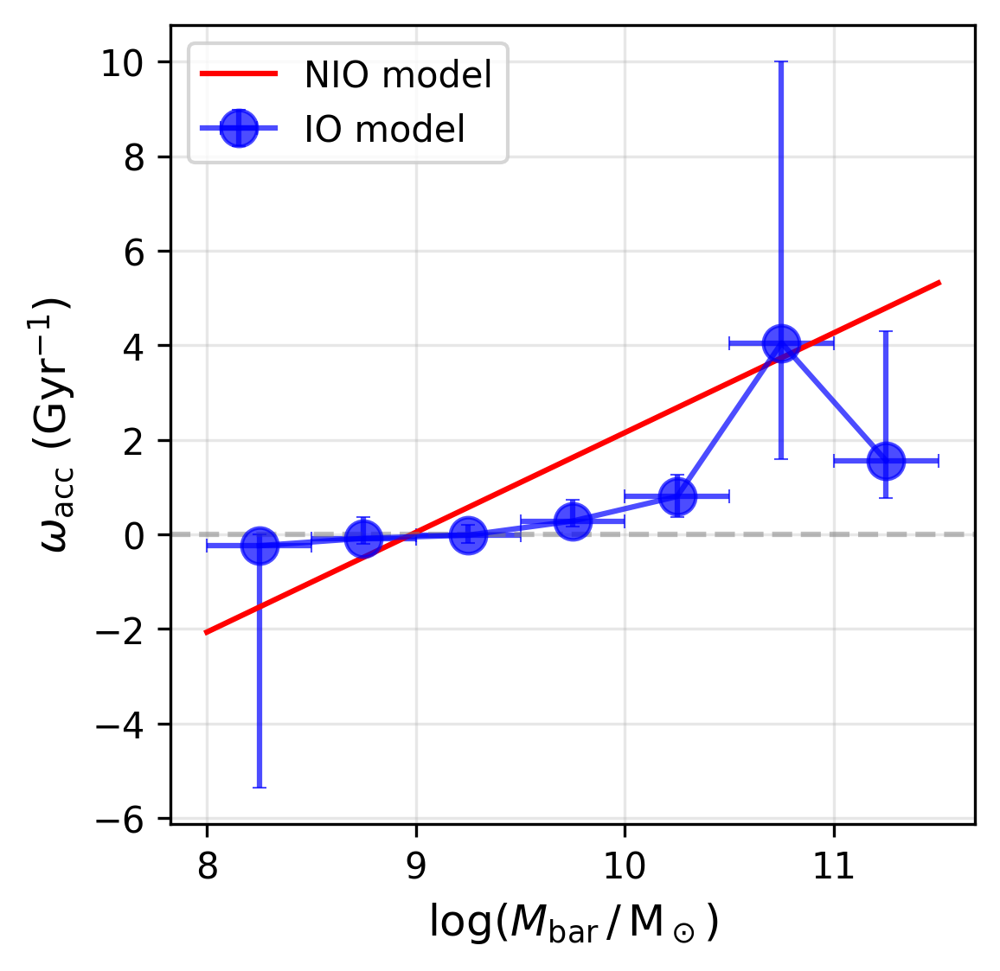

Execution time: 0.0663 seconds


In [108]:
def omega_M_dep(logM, a=2.11, b=2.15):
    return a * (logM - 10.0) + b

logM_centers = np.array([(mass_bins[i] + mass_bins[i+1])/2 for i in range(len(mass_bins)-1)])

# Compute median and 16th/84th percentiles for each mass bin
omega_median = np.array([np.median(omega_in_bin) if len(omega_in_bin) > 0 else np.nan for omega_in_bin in omega_by_mass])
omega_p16 = np.array([np.percentile(omega_in_bin, 16) if len(omega_in_bin) > 0 else np.nan for omega_in_bin in omega_by_mass])
omega_p84 = np.array([np.percentile(omega_in_bin, 84) if len(omega_in_bin) > 0 else np.nan for omega_in_bin in omega_by_mass])
N_gal = np.array([len(omega_in_bin) for omega_in_bin in omega_by_mass])

# Asymmetric error bars: [lower, upper]
yerr_lo = omega_median - omega_p16
yerr_hi = omega_p84 - omega_median

plt.figure(figsize=(4, 4), dpi=300)
plt.errorbar(logM_centers, omega_median, xerr=(mass_bins[1:] - mass_bins[:-1])/2, 
             yerr=[yerr_lo, yerr_hi], fmt='-o', capsize=2, 
             capthick=0.5, markersize=10, color='b', ecolor='b', alpha=0.7, 
             label='IO model')
plt.plot(np.linspace(mass_bins[0], mass_bins[-1], 5), omega_M_dep(np.linspace(mass_bins[0], mass_bins[-1], 5)), 'r-', label=r'NIO model')

plt.axhline(0, color='gray', linestyle='--', alpha=0.5)

plt.xlabel(r'$\log(M_{\rm bar}\,/\, \rm M_\odot)$', fontsize=12)
plt.ylabel(r'$\omega_{\rm acc}$ (Gyr$^{-1}$)', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)
plt.show()

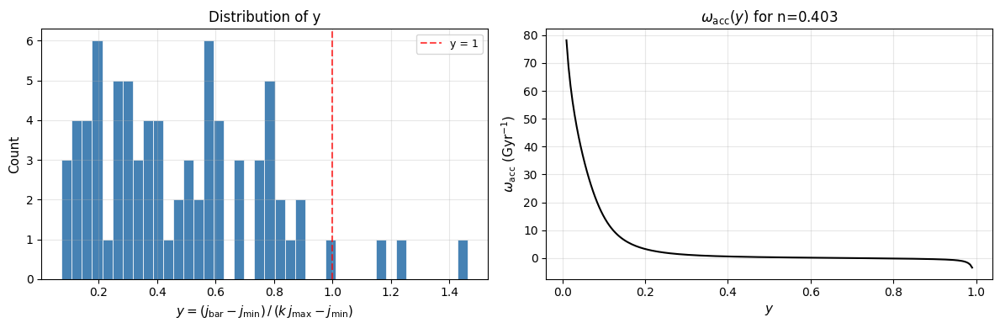

Execution time: 0.2120 seconds


In [64]:
# --- Histogram of y_raw ---
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

ax1 = axes[0]
ax1.hist(y_np, bins=40, color='steelblue', edgecolor='white', linewidth=0.5)
ax1.axvline(1.0, color='r', linestyle='--', alpha=0.7, label='y = 1')
ax1.set_xlabel(r'$y = (j_{\rm bar} - j_{\rm min}) \,/\, (k\,j_{\rm max} - j_{\rm min})$', fontsize=11)
ax1.set_ylabel('Count', fontsize=11)
ax1.set_title('Distribution of y', fontsize=12)
ax1.legend(fontsize=9)
ax1.grid(True, alpha=0.3)

# --- omega as a function of y ---
y_grid = np.linspace(0.01, 0.99, 200)
y_grid_jax = jnp.array(y_grid, dtype=jnp.float64)
omega_grid, ok_grid = solve_omega_bisect_autobracket_jax(y_grid_jax, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
omega_grid_np = np.array(jax.device_get(omega_grid))

ax2 = axes[1]
ax2.plot(y_grid, omega_grid_np, 'k-', lw=1.5)
ax2.set_xlabel(r'$y$', fontsize=11)
ax2.set_ylabel(r'$\omega_{\rm acc}$ (Gyr$^{-1}$)', fontsize=11)
ax2.set_title(f'$\\omega_{{\\rm acc}}(y)$ for n={n_test}', fontsize=12)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [65]:
# print this list for unsolved galaxies but also the clipped galaxies with omega_acc > 10.0 or < -10.0 (if any)

unsolved = (~ok_np) | (~np.isfinite(omega_np)) | (~np.isfinite(y_np)) | (omega_np > 10.0) | (omega_np < -10.0)
idx_uns = np.where(unsolved)[0]

print(f"Unsolved galaxies: {len(idx_uns)}")
print("Indices:", idx_uns.tolist())

names = np.asarray(BARY["Name"].to_list() + ['HIX_galaxy']*len(HIX_data))

for i in idx_uns:
    nm = names[i]
    print(f"\n{nm}")
    print(f"  idx      = {i}")
    print(f"  y_raw    = {y_np[i]}")
    print(f"  omega    = {omega_np[i]}")
    print(f"  j_obs    = {np.asarray(jax.device_get(jbar_obs_jax))[i]}")
    print(f"  logM_obs = {np.asarray(jax.device_get(logM_obs_jax))[i]}")
    print(f"  fgas_obs = {np.asarray(jax.device_get(fgas_obs_jax))[i]}")

Unsolved galaxies: 8
Indices: [1, 4, 15, 17, 22, 54, 63, 76]

DDO064
  idx      = 1
  y_raw    = 1.2434101254614272
  omega    = -10.0
  j_obs    = 52.00495662949194
  logM_obs = 7.90687353472207
  fgas_obs = 0.2614622057001239

DDO133
  idx      = 4
  y_raw    = 1.4612322715230608
  omega    = -10.0
  j_obs    = 148.7260308255547
  logM_obs = 8.44166613387689
  fgas_obs = 0.9584726836657848

LVHIS078
  idx      = 15
  y_raw    = 0.10740220908041527
  omega    = 13.104926291676293
  j_obs    = 870.1007282935119
  logM_obs = 10.7324801760276
  fgas_obs = 0.028327696108704913

NGC0055
  idx      = 17
  y_raw    = 0.09501679404867736
  omega    = 16.415917530825766
  j_obs    = 978.5016549143762
  logM_obs = 10.84192231167945
  fgas_obs = 0.07180889336595193

NGC0925
  idx      = 22
  y_raw    = 0.11141568430784068
  omega    = 12.197648765637258
  j_obs    = 756.151431209603
  logM_obs = 10.636688447953283
  fgas_obs = 0.08125577100646353

NGC4138
  idx      = 54
  y_raw    = 0.114276287

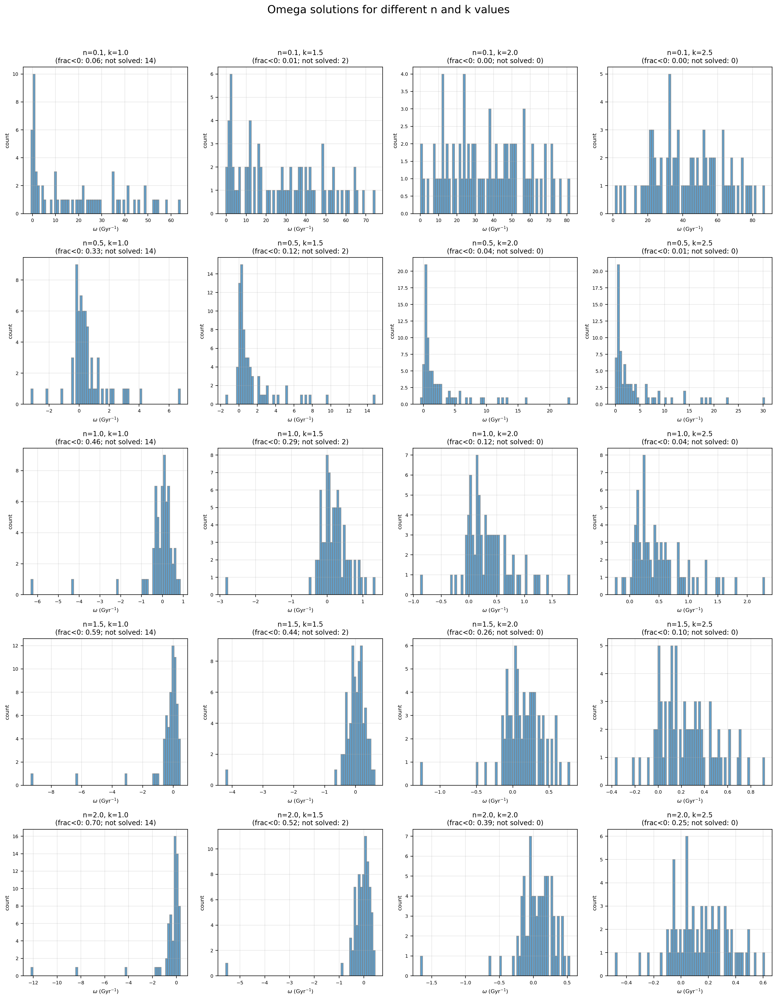

Execution time: 1.3258 seconds


In [66]:
# Mosaic of omega histograms for different n and k values
n_vals = [0.1, 0.5, 1.0, 1.5, 2.0]
k_vals = [1.0, 1.5, 2.0, 2.5]
t0 = 12.0

fig, axes = plt.subplots(len(n_vals), len(k_vals), figsize=(16, 20), dpi=200)
fig.suptitle("Omega solutions for different n and k values", fontsize=16, y=1.02)

for i, n_test in enumerate(n_vals):
    for j, k_test in enumerate(k_vals):
        ax = axes[i, j]
        
        # Compute y_raw for this (n, k) combination
        Mbar_obs = 10.0**logM_obs_jax
        j_max = j_maxer(Mbar_obs)
        j_min = j_max / 10.0
        delta_j = k_test*j_max - j_min
        y_raw = (jbar_obs_jax - j_min) / (delta_j)
        
        # Solve for omega
        omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_test, t0, omega0=1.0, max_expand=60, n_iter=50)
        
        omega_np = np.asarray(jax.device_get(omega))
        ok_np = np.asarray(jax.device_get(ok))
        y_np = np.asarray(jax.device_get(y_raw))
        
        mask = ok_np & np.isfinite(omega_np)
        unsolved = (~ok_np) | (~np.isfinite(omega_np)) | (~np.isfinite(y_np))
        idx_uns = np.where(unsolved)[0]
        
        # Plot histogram
        if mask.any():
            ax.hist(omega_np[mask], bins=70, alpha=0.7, edgecolor='grey')
            frac_neg = (omega_np[mask] < 0).mean()
            ax.set_title(f"n={n_test}, k={k_test}\n(frac<0: {frac_neg:.2f}; not solved: {len(idx_uns)})", fontsize=10)
        else:
            ax.set_title(f"n={n_test}, k={k_test}\n(no solutions)", fontsize=10)
        
        ax.set_xlabel(r"$\omega$ (Gyr$^{-1}$)", fontsize=8)
        ax.set_ylabel("count", fontsize=8)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='both', labelsize=7)

plt.tight_layout()
plt.show()

In [67]:
# Initial positions of walkers
ndim = 2
nwalkers = 8
nsteps = 200
initial = np.array([.5, 1.5]) # (n, k)
pos = initial + .1*np.random.randn(nwalkers, ndim)

Execution time: 0.0008 seconds


In [68]:
log_prob = LogProbabilityEmcee4Obs(
    logM_obs_jax, jbar_obs_jax,
    Mgas_obs_jax,  sigma_Mgas_jax,
    Mstar_obs_jax, sigma_Mstar_jax,
    jgas_obs_jax,  sigma_jgas_jax,
    jstar_obs_jax, sigma_jstar_jax,
    sigma_jbar_jax, logM_grid_jax
)

Execution time: 0.0004 seconds


In [69]:
def run_mcmc(log_prob, nwalkers, ndim, nsteps, 
             filename='../outputs/mcmc_chains/chain_emcee_insideout.h5',
             fresh_start=True, 
             initial_pos=None,
             max_workers=12,
             nsteps_is_total=False):
    """
    Run MCMC with emcee, with option to continue from previous run.
    
    Parameters:
    -----------
    log_prob : callable
        Log probability function
    nwalkers : int
        Number of walkers
    ndim : int
        Number of dimensions
    nsteps : int
        Number of steps to run (additional steps if continuing)
    filename : str
        Path to HDF5 backend file
    fresh_start : bool
        If True, reset and start fresh. If False, continue from previous run.
    initial_pos : array-like, optional
        Initial positions for fresh start. Required if fresh_start=True.
    max_workers : int
        Number of parallel workers; 12 for my Mac
    nsteps_is_total : bool
        If True, nsteps is the total target (will compute remaining).
        If False, nsteps is additional steps to run.
    
    Returns:
    --------
    sampler : emcee.EnsembleSampler
    """
    
    def init_worker():
        os.environ['JAX_ENABLE_X64'] = '1'
        jax.config.update("jax_enable_x64", True)
    
    backend = emcee.backends.HDFBackend(filename)
    
    if fresh_start:
        backend.reset(nwalkers, ndim)
        if initial_pos is None:
            raise ValueError("initial_pos required for fresh start")
        pos = initial_pos
        steps_to_run = nsteps
        print(f"Starting fresh MCMC with {nwalkers} walkers, {steps_to_run} steps")
    else:
        current_steps = backend.iteration
        if current_steps == 0:
            raise ValueError("No previous run found. Use fresh_start=True")
        pos = backend.get_last_sample()
        
        if nsteps_is_total:
            steps_to_run = nsteps - current_steps
            if steps_to_run <= 0:
                print(f"Chain already has {current_steps} steps, which meets/exceeds target of {nsteps}. No additional steps to run.")
                return emcee.EnsembleSampler(nwalkers, ndim, log_prob, backend=backend)
        else:
            steps_to_run = nsteps
        print(f"Resuming from step {current_steps}, running {steps_to_run} more steps (target: {current_steps + steps_to_run})")
    
    executor = get_reusable_executor(max_workers=max_workers, initializer=init_worker)
    
    sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob, 
                                     pool=executor, backend=backend)
    
    sampler.run_mcmc(pos, steps_to_run, progress=True)
    
    print(f"Done! Total steps: {backend.iteration}")
    
    return sampler

def plot_corner_inside_out(flat_samples, labels=[r'$n$', r'$k$'], 
                           title=None):
    """
    Plot corner plot of MCMC results for the inside-out galaxy formation model.
    
    Parameters:
    -----------
    flat_samples : array, shape (n_samples, n_dim)
        Flattened MCMC chain samples
    labels : list of str
        Parameter labels for the plot
    title : str
        Plot title
    
    Shows:
    - Red solid line: mode (maximum of distribution)
    - Red dashed lines: 1-sigma bounds (16th and 84th percentiles)
    - Blue solid line: median
    
    Returns:
    --------
    fig : matplotlib figure
    """
    
    n_dim = flat_samples.shape[1]
    
    # Compute statistics for each parameter
    modes = []
    medians = []
    percentiles_16 = []
    percentiles_84 = []
    
    for i in range(n_dim):
        samples_i = flat_samples[:, i]
        
        # Compute percentiles
        p16, p50, p84 = np.percentile(samples_i, [16, 50, 84])
        medians.append(p50)
        percentiles_16.append(p16)
        percentiles_84.append(p84)
        
        # Find mode using KDE
        kde = gaussian_kde(samples_i)
        x_grid = np.linspace(samples_i.min(), samples_i.max(), 1000)
        kde_values = kde(x_grid)
        mode_idx = np.argmax(kde_values)
        modes.append(x_grid[mode_idx])
    
    # Create corner plot
    fig = corner.corner(
        flat_samples, labels=labels, 
        levels=(1.-np.exp(-0.5), 1.-np.exp(-2.0)),  # 1-sigma and 2-sigma contours
        show_titles=True,
        truths=medians,
        truth_color='blue',
        title_kwargs={"fontsize": 12},
        smooth=1.5,
        title_fmt=".3f",
        #bins=30
    )
    
    # Get the axes - corner creates a grid of n_dim x n_dim axes
    axes = np.array(fig.axes).reshape((n_dim, n_dim))
    
    # Add lines to the diagonal (1D histogram) axes
    for i in range(n_dim):
        ax = axes[i, i]
        
        # Red solid line at mode
        ax.axvline(modes[i], color='red', linestyle='-', linewidth=1.5, label='Mode')
        
        # Red dashed lines at 1-sigma bounds
        ax.axvline(percentiles_16[i], color='red', linestyle='--', linewidth=1.2)
        ax.axvline(percentiles_84[i], color='red', linestyle='--', linewidth=1.2)
        
        # Blue solid line at median
        ax.axvline(medians[i], color='blue', linestyle='-', linewidth=1.5, label='Median')
    
    fig.suptitle(title, fontsize=14, y=1.02)
    
    # Print statistics
    print("\nMCMC Results:")
    print("-" * 50)
    param_names = ['n', 'k']
    for i in range(n_dim):
        sigma_plus = percentiles_84[i] - medians[i]
        sigma_minus = medians[i] - percentiles_16[i]
        print(f"  {param_names[i]}: {medians[i]:.4f} +{sigma_plus:.4f} -{sigma_minus:.4f}")
        print(f"      mode = {modes[i]:.4f}, 1σ range = [{percentiles_16[i]:.4f}, {percentiles_84[i]:.4f}]")
    print("-" * 50)
    
    return fig, modes, medians, (percentiles_16, percentiles_84)

Execution time: 0.0042 seconds


In [149]:
# for fresh start, set fresh_start=True and provide initial_pos, omit nsteps_is_total
sampler = run_mcmc(log_prob, nwalkers, ndim, nsteps, fresh_start=True, initial_pos=pos) 

# for continuing, set fresh_start=False and omit initial_pos, set nsteps_is_total=True
# sampler = run_mcmc(log_prob, nwalkers, ndim, nsteps, fresh_start=False, nsteps_is_total=True)

Starting fresh MCMC with 8 walkers, 200 steps


 36%|███▌      | 72/200 [23:29<42:46, 20.05s/it]  /Users/andreacosta/venvs/mlenv/lib/python3.11/site-packages/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(
100%|██████████| 200/200 [1:06:27<00:00, 19.94s/it]

Done! Total steps: 200
Execution time: 4006.0737 seconds


In [70]:
# flat_samples = sampler.get_chain(flat=True)
# flat_logp = sampler.get_log_prob(flat=True) # discard=burn_in, thin=thin, 

# load from ../outputs/mcmc_chains/chain_emcee_insideout.h5
backend = emcee.backends.HDFBackend('../outputs/mcmc_chains/chain_emcee_insideout.h5')
flat_samples = backend.get_chain(flat=True)
flat_logp = backend.get_log_prob(flat=True)

acceptance_fraction = backend.accepted / backend.iteration #sampler.acceptance_fraction #
print("Acceptance fractions per walker:")
print(acceptance_fraction)

print("Mean acceptance fraction:", np.mean(acceptance_fraction))
imax = np.argmax(flat_logp)
best_sample = flat_samples[imax]
best_n, best_k = best_sample

print(f"Best sample from this run: n = {best_n:.4f}, k = {best_k:.4f}")

Acceptance fractions per walker:
[0.53  0.57  0.655 0.64  0.63  0.555 0.61  0.615]
Mean acceptance fraction: 0.600625
Best sample from this run: n = 0.3869, k = 1.2726
Execution time: 0.0119 seconds



MCMC Results:
--------------------------------------------------
  n: 0.3893 +0.0039 -0.0038
      mode = 0.3891, 1σ range = [0.3854, 0.3932]
  k: 1.2755 +0.0090 -0.0046
      mode = 1.2726, 1σ range = [1.2709, 1.2845]
--------------------------------------------------


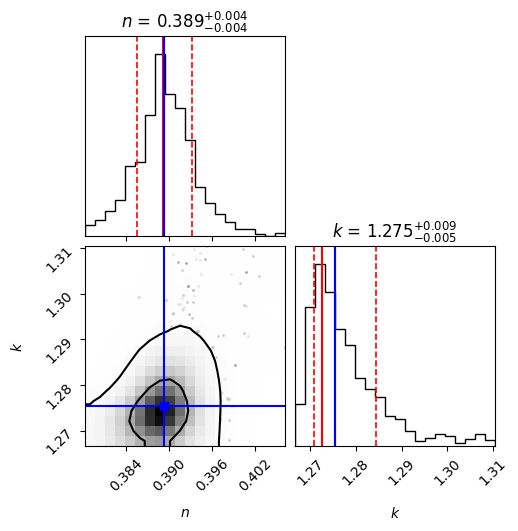

Execution time: 0.2569 seconds


In [71]:
burn_in = nsteps // 4
try:
    tau = backend.get_autocorr_time()
    print("Autocorrelation times:", tau)
    thin = int(0.5 * np.mean(tau))
except:
    thin = 1
flat_samples = backend.get_chain(discard=burn_in, thin=thin, flat=True)

fig, modes, medians, percentiles = plot_corner_inside_out(flat_samples)
#plt.savefig('../outputs/graphs10_JAX_aKSL/corner_plot_inside_out.png', dpi=150, bbox_inches='tight')
plt.show()

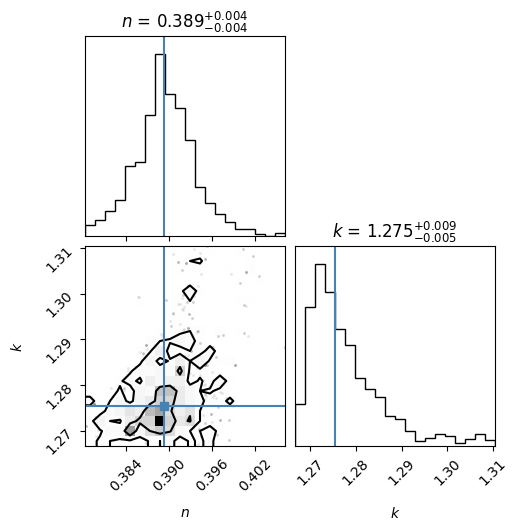

Execution time: 0.0758 seconds


In [72]:
burn_in = nsteps//4
chain = backend.get_chain()
chain_after_burnin = chain[burn_in:, :, :]

flat_samples_burnin = chain_after_burnin.reshape(-1, ndim)

n_median = np.median(flat_samples_burnin[:, 0])
k_median = np.median(flat_samples_burnin[:, 1])

labels = [r"$n$", r"$k$"]

fig = corner.corner(flat_samples_burnin, labels=labels, levels=(1.-np.exp(-0.5), 1.-np.exp(-2.0)), truths=[n_median, k_median], show_titles=True, title_fmt=".3f")

#plt.suptitle(f'emcee Corner Plot (burn-in={burn_in} steps)', y=1.02)
plt.show()
#fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_corner_plot.png")

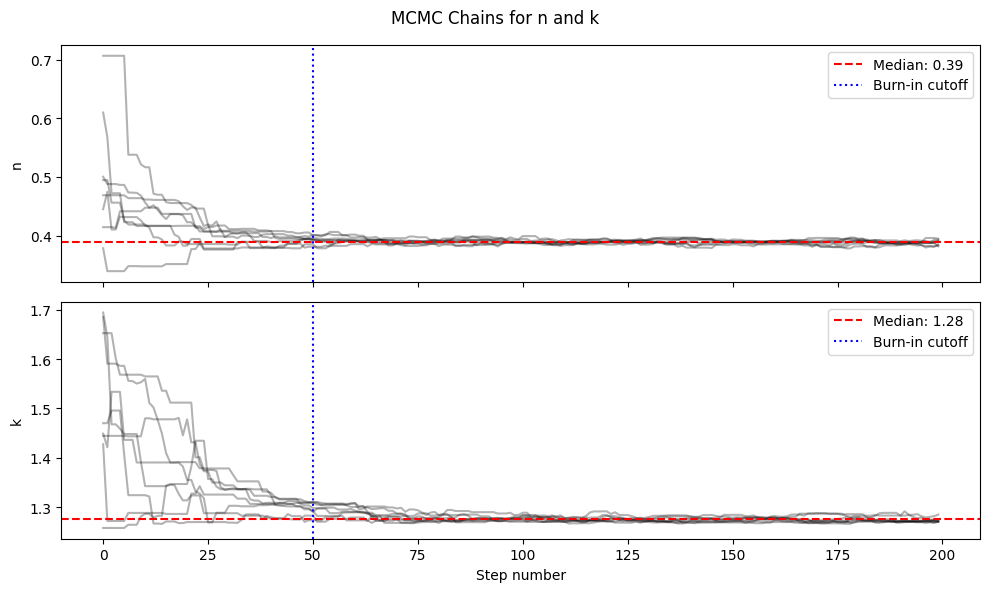

Execution time: 0.0917 seconds


In [73]:
#chain = sampler.get_chain()

fig, axes = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

axes[0].plot(chain[:, :, 0], alpha=0.3, color='k')
axes[0].set_ylabel('n')
axes[0].axhline(n_median, color='r', linestyle='--', label=f'Median: {n_median:.2f}')
axes[0].axvline(burn_in, color='b', linestyle=':', label='Burn-in cutoff')

axes[1].plot(chain[:, :, 1], alpha=0.3, color='k')
axes[1].set_ylabel('k')
axes[1].axhline(k_median, color='r', linestyle='--', label=f'Median: {k_median:.2f}')
axes[1].axvline(burn_in, color='b', linestyle=':', label='Burn-in cutoff')
axes[1].set_xlabel('Step number')

axes[0].legend()
axes[1].legend()
plt.suptitle('MCMC Chains for n and k')
plt.tight_layout()
plt.show()
#fig.savefig("../outputs/graphs10_JAX_aKSL/mcmc_kn_chains.png")

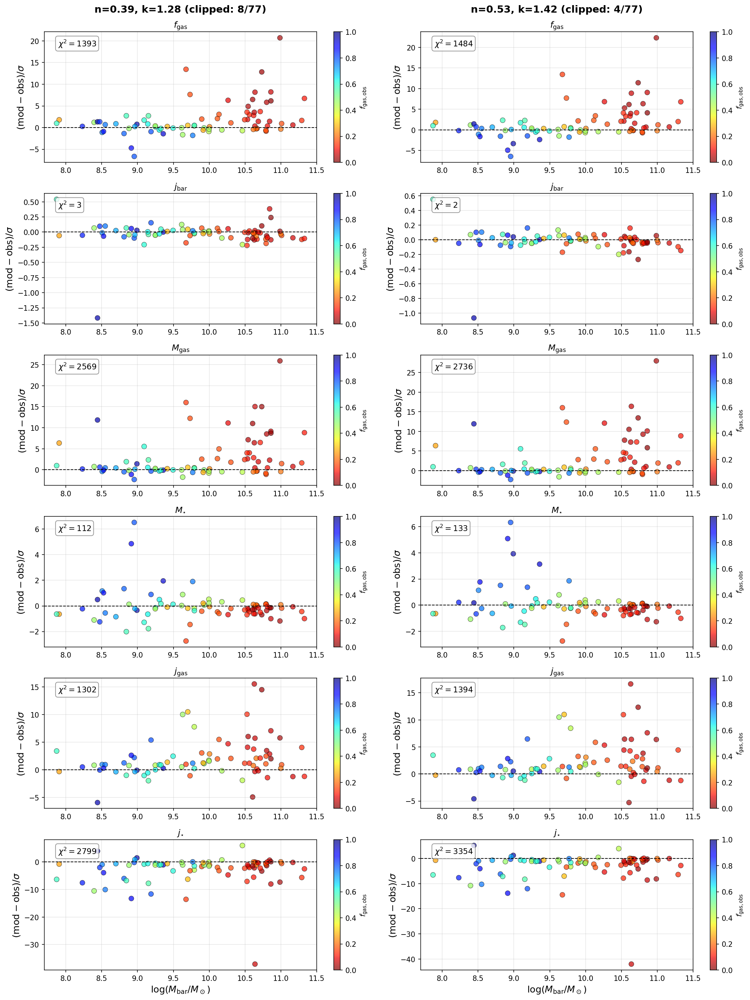

Execution time: 11.1988 seconds


In [74]:
def compute_chi_4obs(n_val, k_val):
    """Run IO model at given (n, k) and return chi arrays for 4 observables."""
    r_acc = jnp.array(build_r_acc_matrix_for_all_M(n_val, k_val, seed=seed), dtype=jnp.float64)

    Mbar = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar)
    j_min = j_max / 10.0
    delta_j = jnp.maximum(k_val * j_max - j_min, 1e-12)
    y_raw = (jbar_obs_jax - j_min) / delta_j

    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_val, 12.0)
    omega_assigned = jnp.where(ok, omega, jnp.where(y_raw < 0.0, 10.0, -10.0))
    was_clipped = (~ok) | (omega_assigned > 10.0) | (omega_assigned < -10.0)
    omega_clipped = jnp.clip(omega_assigned, -10.0, 10.0)
    omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                            jnp.sign(omega_clipped) * 1e-4, omega_clipped)
    t_acc = 1.0 / omega_safe

    fgas_mod, jbar_mod, jgas_mod, jstar_mod, Mstar_mod, Mgas_mod = \
        all_obs_for_galaxies_jax(Mbar, t_acc, "cutoff_ksl", r_acc, logM_grid_jax, at_t0=True)

    def chi(mod, obs, sigma, clip=1e-6):
        return np.array(mod - obs) / np.maximum(np.array(sigma), clip)

    return {
        r"$f_{\rm gas}$":  chi(fgas_mod,  fgas_obs_jax,  sigma_fgas_jax, clip=4e-3),
        r"$j_{\rm bar}$":  chi(jbar_mod,  jbar_obs_jax,  sigma_jbar_jax),
        r"$M_{\rm gas}$":  chi(Mgas_mod,  Mgas_obs_jax,  sigma_Mgas_jax),
        r"$M_{\star}$":    chi(Mstar_mod, Mstar_obs_jax, sigma_Mstar_jax),
        r"$j_{\rm gas}$":  chi(jgas_mod,  jgas_obs_jax,  sigma_jgas_jax),
        r"$j_{\star}$":    chi(jstar_mod, jstar_obs_jax, sigma_jstar_jax),
    }, int(np.sum(np.array(was_clipped)))

n_A, k_A = n_median, k_median
n_B, k_B = 0.53, 1.42 # from previous MCMC with f_gas likelihood

chi_A, nclip_A = compute_chi_4obs(n_A, k_A)
chi_B, nclip_B = compute_chi_4obs(n_B, k_B)

Ngal = len(logM_obs_jax)
logM_np = np.array(logM_obs_jax)
fgas_np = np.array(fgas_obs_jax)
labels = list(chi_A.keys())

fig, axes = plt.subplots(6, 2, figsize=(15, 20), dpi=150)

for row, lbl in enumerate(labels):
    for col, (chi_dict, n_v, k_v, nclip) in enumerate([
        (chi_A, n_A, k_A, nclip_A),
        (chi_B, n_B, k_B, nclip_B),
    ]):
        ax = axes[row, col]
        c = chi_dict[lbl]
        valid = np.isfinite(c)
        chi2 = np.nansum(c[valid]**2)
        sc = ax.scatter(logM_np[valid], c[valid], c=fgas_np[valid],
                        cmap='jet_r', s=50, alpha=0.7, edgecolors='k',
                        linewidths=0.5, vmin=0.0, vmax=1.0)
        ax.axhline(0, color='k', ls='--', lw=1)
        ax.set_ylabel(r"$({\rm mod} - {\rm obs})/\sigma$", fontsize=13)
        ax.set_title(f"{lbl}", fontsize=12) #+ rf"$\chi^2={chi2:.0f}$  $\chi^2/N={chi2/Ngal:.2f}$"
        ax.grid(alpha=0.3)
        fig.colorbar(sc, ax=ax, label=r'$f_{\rm gas,obs}$')
        ax.text(0.05, 0.95,
                rf"$\chi^2={chi2:.0f}$",
                        transform=ax.transAxes,
                ha='left', va='top', fontsize=11,
                bbox=dict(boxstyle='round,pad=0.3',
                facecolor='white', edgecolor='gray',
                alpha=0.8))

for ax in axes[-1]:
    ax.set_xlabel(r'$\log(M_{\rm bar}/M_\odot)$', fontsize=13)

axes[0, 0].text(0.5, 1.15, f"n={n_A:.2f}, k={k_A:.2f} (clipped: {nclip_A}/{Ngal})",
                transform=axes[0, 0].transAxes, ha='center', fontsize=14, fontweight='bold')
axes[0, 1].text(0.5, 1.15, f"n={n_B:.2f}, k={k_B:.2f} (clipped: {nclip_B}/{Ngal})",
                transform=axes[0, 1].transAxes, ha='center', fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('../outputs/graphs10_JAX_aKSL/chi_IO_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [75]:
names = CONVERGED['Name'].values
Mgas_np = np.array(Mgas_obs_jax)
chi_jgas = chi_A[r"$j_{\rm gas}$"]

mask = (Mgas_np >= 1e9) & (Mgas_np <= 1e10)
idx = np.where(mask)[0]
abs_chi = np.abs(chi_jgas[idx])

i_good = idx[np.argmin(abs_chi)]
i_bad = idx[np.argmax(abs_chi)]

print(f"Well reproduced: {names[i_good]}, M_gas = {Mgas_np[i_good]:.2e}, |chi_jgas| = {abs(chi_jgas[i_good]):.2f}, fgas = {fgas_np[i_good]:.2f}")
print(f"Poorly reproduced: {names[i_bad]}, M_gas = {Mgas_np[i_bad]:.2e}, |chi_jgas| = {abs(chi_jgas[i_bad]):.2f}, fgas = {fgas_np[i_bad]:.2f}")

Well reproduced: UGC04278, M_gas = 1.13e+09, |chi_jgas| = 0.00, fgas = 0.64
Poorly reproduced: NGC3627, M_gas = 2.41e+09, |chi_jgas| = 15.56, fgas = 0.06
Execution time: 0.0010 seconds


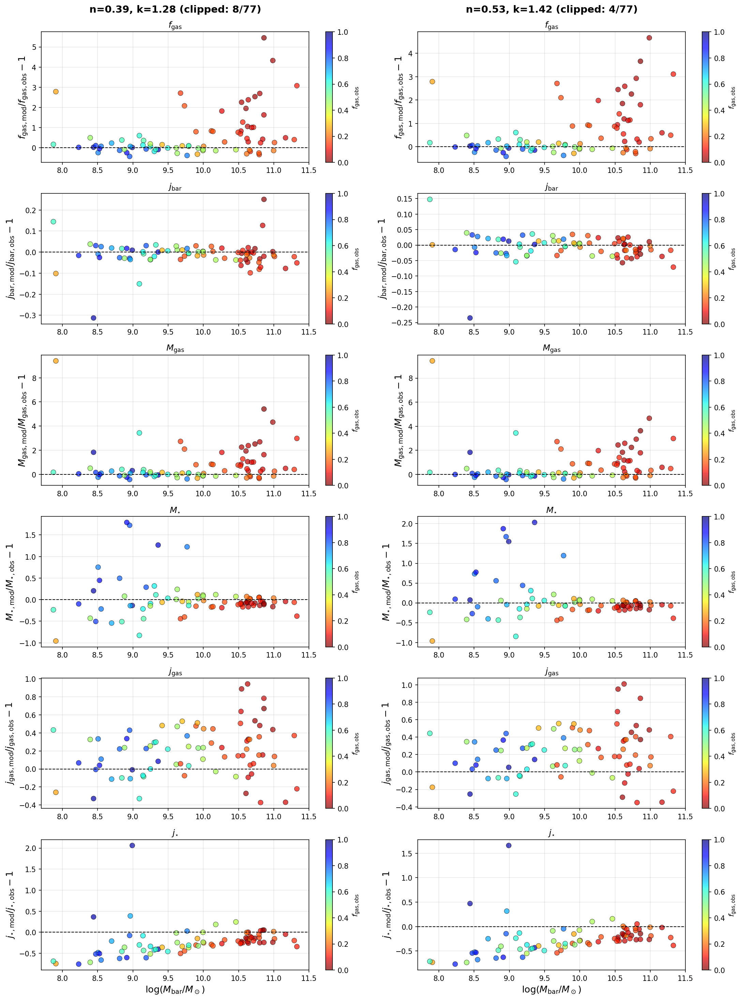

Execution time: 10.3362 seconds


In [76]:
def compute_frac_resid_4obs(n_val, k_val):
    """Run IO model at given (n, k) and return fractional residuals (mod/obs - 1)."""
    r_acc = jnp.array(build_r_acc_matrix_for_all_M(n_val, k_val, seed=seed), dtype=jnp.float64)

    Mbar = 10.0**logM_obs_jax
    j_max = j_maxer(Mbar)
    j_min = j_max / 10.0
    delta_j = jnp.maximum(k_val * j_max - j_min, 1e-12)
    y_raw = (jbar_obs_jax - j_min) / delta_j

    omega, ok = solve_omega_bisect_autobracket_jax(y_raw, n_val, 12.0)
    omega_assigned = jnp.where(ok, omega, jnp.where(y_raw < 0.0, 10.0, -10.0))
    was_clipped = (~ok) | (omega_assigned > 10.0) | (omega_assigned < -10.0)
    omega_clipped = jnp.clip(omega_assigned, -10.0, 10.0)
    omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                            jnp.sign(omega_clipped) * 1e-4, omega_clipped)
    t_acc = 1.0 / omega_safe

    fgas_mod, jbar_mod, jgas_mod, jstar_mod, Mstar_mod, Mgas_mod = \
        all_obs_for_galaxies_jax(Mbar, t_acc, "cutoff_ksl", r_acc, logM_grid_jax, at_t0=True)

    def frac(mod, obs):
        return np.array(mod) / np.array(obs) - 1

    return {
        r"$f_{\rm gas}$":  frac(fgas_mod,  fgas_obs_jax),
        r"$j_{\rm bar}$":  frac(jbar_mod,  jbar_obs_jax),
        r"$M_{\rm gas}$":  frac(Mgas_mod,  Mgas_obs_jax),
        r"$M_{\star}$":    frac(Mstar_mod, Mstar_obs_jax),
        r"$j_{\rm gas}$":  frac(jgas_mod,  jgas_obs_jax),
        r"$j_{\star}$":    frac(jstar_mod, jstar_obs_jax),
    }, int(np.sum(np.array(was_clipped)))

res_A, nclip_A = compute_frac_resid_4obs(n_A, k_A)
res_B, nclip_B = compute_frac_resid_4obs(n_B, k_B)

labels = list(res_A.keys())
fig, axes = plt.subplots(6, 2, figsize=(15, 20), dpi=150)

for row, lbl in enumerate(labels):
    for col, (res_dict, n_v, k_v, nclip) in enumerate([
        (res_A, n_A, k_A, nclip_A),
        (res_B, n_B, k_B, nclip_B),
    ]):
        ax = axes[row, col]
        r = res_dict[lbl]
        valid = np.isfinite(r)
        median_res = np.nanmedian(r[valid])
        sc = ax.scatter(logM_np[valid], r[valid], c=fgas_np[valid],
                        cmap='jet_r', s=50, alpha=0.7, edgecolors='k',
                        linewidths=0.5, vmin=0.0, vmax=1.0)
        ax.axhline(0, color='k', ls='--', lw=1)
        ax.set_ylabel(lbl + r"$_{\rm ,mod}/$" + lbl + r"$_{\rm ,obs} - 1$", fontsize=13)
        ax.set_title(f"{lbl}", fontsize=12)
        # ax.text(0.95, 0.95, f"median = {median_res:.3f}",
        #         transform=ax.transAxes, ha='right', va='top', fontsize=11,
        #         bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='gray', alpha=0.8))
        ax.grid(alpha=0.3)
        fig.colorbar(sc, ax=ax, label=r'$f_{\rm gas,obs}$')

for ax in axes[-1]:
    ax.set_xlabel(r'$\log(M_{\rm bar}/M_\odot)$', fontsize=13)

axes[0, 0].text(0.5, 1.15, f"n={n_A:.2f}, k={k_A:.2f} (clipped: {nclip_A}/{Ngal})",
                transform=axes[0, 0].transAxes, ha='center', fontsize=14, fontweight='bold')
axes[0, 1].text(0.5, 1.15, f"n={n_B:.2f}, k={k_B:.2f} (clipped: {nclip_B}/{Ngal})",
                transform=axes[0, 1].transAxes, ha='center', fontsize=14, fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('../outputs/graphs10_JAX_aKSL/frac_resid_IO_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

# Radial Profiles for Model Comparison

This section computes and saves radial profiles of Σ_gas, Σ_star, Σ_SFR at different times,
as well as the integrated SFH (total SFR vs time), for comparison with the non-inside-out model.

In [90]:
@partial(jax.jit, static_argnames=("sfl_type", "n_r"))
def compute_radial_profiles_jax(log_M_bar, t_acc, 
                                 r_acc_matrix_for_all_M_jax, log_M_bar_array_jax,
                                 sfl_type="cutoff_ksl", n_r=834):
    """
    Compute radial profiles for the inside-out model at a given baryonic mass.
    Fully JAX-compatible and vmappable.
    
    Based on Full_final_definer_jax and full_from_sigma_jax.
    
    Parameters:
    -----------
    log_M_bar : float
        log10(M_bar / Msun)
    t_acc : float
        Accretion timescale (Gyr)
    r_acc_matrix_for_all_M_jax : jax.Array
        Pre-computed r_acc matrix of shape (n_M, n_t) in kpc (NOT pc!)
    log_M_bar_array_jax : jax.Array
        Array of log10(M_bar) values for interpolation
    sfl_type : str
        Star formation law type (static)
    n_r : int
        Number of radial bins (static, default 834 for 0-100 kpc at 120 pc resolution)
    
    Returns:
    --------
    dict with JAX arrays:
        'r_kpc' : radial grid (kpc), shape (n_r,)
        'times' : time grid (Gyr), shape (n_t,)
        'Sigma_gas' : gas surface density (n_r, n_t) in Msun/pc^2
        'Sigma_sfr' : SFR surface density (n_r, n_t) in Msun/pc^2/Gyr
        'Sigma_star' : stellar surface density (n_r, n_t) in Msun/pc^2
        'SFH' : total SFR vs time (n_t,) in Msun/Gyr
        'M_gas_t' : total gas mass vs time (n_t,) in Msun
        'M_star_t' : total stellar mass vs time (n_t,) in Msun
        'f_gas_t' : gas fraction vs time (n_t,)
        'j_bar_t' : baryonic specific angular momentum vs time (n_t,) in kpc km/s
        'j_gas_t' : gas specific angular momentum vs time (n_t,) in kpc km/s
        'j_star_t' : stellar specific angular momentum vs time (n_t,) in kpc km/s
        'r_acc_t' : accretion radius vs time (n_t,) in kpc
    """
    M_bar = 10.0**log_M_bar
    
    # Find mass index (JAX-compatible)
    Mbar_index = jnp.argmin(jnp.abs(log_M_bar_array_jax - log_M_bar))
    r_acc_t_kpc = r_acc_matrix_for_all_M_jax[Mbar_index]
    
    # Radial grid
    res = 120
    Rmax = 100.1
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)
    r_kpc = r_pc / 1000.0
    dr = res
    
    # Compute normalization constant
    C = C_def_jax(M_bar, t_acc)
    
    # Compute gas surface density: shape (n_r, n_t)
    # NOTE: r_acc_matrix_for_all_M_jax is in kpc, Sigma_definer_jax handles conversion internally
    SD_gas = Sigma_definer_jax(r_pc, t_acc, M_bar, C, sfl_type,
                               r_acc_matrix_for_all_M_jax, log_M_bar_array_jax)
    
    # Compute SFR surface density: shape (n_r, n_t)
    R_broad = r_pc[:, None]
    SD_sfr = SFL_jax(SD_gas, sfl_type, R_broad, M_bar)
    
    # Time step
    dt = M_times1_jax[1] - M_times1_jax[0]
    
    # Compute stellar surface density via cumulative integral over time
    # SD_star(r, t) = integral_0^t SD_sfr(r, t') dt'
    SD_star = dt * jnp.cumsum(SD_sfr, axis=-1)
    
    # Radial integration helpers
    r_col = r_pc[:, None]  # shape (n_r, 1)
    r2_col = r_col**2
    
    def integrate_radially(integrand):
        """Integrate using Simpson's rule along radius axis."""
        return simpson_uniform_jax(integrand, dr, axis=0)  # shape (n_t,)
    
    # Mass integrals: M(t) = integral 2*pi*r*Sigma(r,t) dr
    integrand_gas = 2.0 * jnp.pi * r_col * SD_gas
    integrand_sfr = 2.0 * jnp.pi * r_col * SD_sfr
    
    M_gas_t = integrate_radially(integrand_gas)
    M_sfr_t = integrate_radially(integrand_sfr)  # SFR(t) in Msun/Gyr
    M_star_t = dt * jnp.cumsum(M_sfr_t)
    M_bar_t = M_gas_t + M_star_t
    
    # Gas fraction
    f_gas_t = M_gas_t / jnp.where(M_bar_t > 0, M_bar_t, jnp.inf)
    
    # Angular momentum integrals: j = integral(2*pi*r^2*Sigma*v_rot dr) / M
    # v_rot from exponential disk rotation curve
    v_rot = exp_vrot_jax(r_pc, M_bar)[:, None]  # shape (n_r, 1)
    
    integrand_gas_j = 2.0 * jnp.pi * r2_col * SD_gas * v_rot
    integrand_sfr_j = 2.0 * jnp.pi * r2_col * SD_sfr * v_rot
    
    nom_gas = integrate_radially(integrand_gas_j)
    nom_sfr = integrate_radially(integrand_sfr_j)
    nom_star = dt * jnp.cumsum(nom_sfr)
    nom_bar = nom_star + nom_gas
    
    # Specific angular momentum (divide by 1000 to convert from pc*km/s to kpc*km/s)
    j_bar_t = (nom_bar / jnp.where(M_bar_t > 0, M_bar_t, jnp.inf)) / 1000.0
    j_gas_t = (nom_gas / jnp.where(M_gas_t > 0, M_gas_t, jnp.inf)) / 1000.0
    j_star_t = (nom_star / jnp.where(M_star_t > 0, M_star_t, jnp.inf)) / 1000.0
    
    return {
        'log_M_bar': log_M_bar,
        't_acc': t_acc,
        'r_kpc': r_kpc,
        'times': M_times1_jax,
        'Sigma_gas': SD_gas,
        'Sigma_sfr': SD_sfr,
        'Sigma_star': SD_star,
        'SFH': M_sfr_t,
        'M_gas_t': M_gas_t,
        'M_star_t': M_star_t,
        'f_gas_t': f_gas_t,
        'j_bar_t': j_bar_t,
        'j_gas_t': j_gas_t,
        'j_star_t': j_star_t,
        'r_acc_t': r_acc_t_kpc,
    }


def compute_radial_profiles_batch(log_M_bar_arr, t_acc_arr, n, k,
                                   sfl_type="cutoff_ksl"):
    """
    Compute radial profiles for multiple galaxies.
    
    Parameters:
    -----------
    log_M_bar_arr : array-like
        Array of log10(M_bar) values
    t_acc_arr : array-like
        Array of t_acc values (Gyr)
    n, k : float
        Inside-out model parameters
    sfl_type : str
        Star formation law type
        
    Returns:
    --------
    list of dicts, each containing radial profiles for one galaxy
    """
    # Pre-compute r_acc matrix for these n, k values
    r_acc_matrix = build_r_acc_matrix_for_all_M_jax(n, k, key=key)
    
    log_M_bar_arr = jnp.asarray(log_M_bar_arr)
    t_acc_arr = jnp.asarray(t_acc_arr)
    
    # Use vmap over galaxies
    @partial(jax.jit, static_argnames=("sfl_type",))
    def compute_single(log_M, t_acc):
        return compute_radial_profiles_jax(log_M, t_acc, 
                                            r_acc_matrix, log_M_bar_array_jax,
                                            sfl_type=sfl_type)
    
    # vmap returns a dict of arrays, each with leading batch dimension
    profiles_vmapped = jax.vmap(compute_single)(log_M_bar_arr, t_acc_arr)
    
    # Convert to list of dicts for easier handling
    n_gal = len(log_M_bar_arr)
    profiles_list = []
    for i in range(n_gal):
        prof_i = {key: np.array(val[i]) if val.ndim > 0 else float(val[i]) 
                  for key, val in profiles_vmapped.items()}
        prof_i['n'] = n
        prof_i['k'] = k
        profiles_list.append(prof_i)
    
    return profiles_list


def save_radial_profiles(profiles, filename):
    """Save radial profiles to a .npz file."""
    # Convert any JAX arrays to numpy for saving
    profiles_np = {}
    for key, val in profiles.items():
        if hasattr(val, 'shape'):
            profiles_np[key] = np.array(val)
        else:
            profiles_np[key] = val
    np.savez(filename, **profiles_np)
    print(f"Saved radial profiles to {filename}")


def load_radial_profiles(filename):
    """Load radial profiles from a .npz file."""
    data = np.load(filename, allow_pickle=True)
    return {key: data[key] for key in data.files}

Execution time: 0.0140 seconds


In [91]:
def compute_t_acc_for_galaxies(logM_obs, jbar_obs, n, k, 
                                 t0=12.0, omega_min=-10.0, omega_max=10.0):
    """
    Compute t_acc for each galaxy given (n, k) parameters.
    
    Parameters:
    -----------
    logM_obs : array-like
        log10(M_bar) for each galaxy
    jbar_obs : array-like  
        Observed specific angular momentum for each galaxy
    n, k : float
        Inside-out model parameters
    t0 : float
        Present time (Gyr)
    omega_min, omega_max : float
        Bounds for omega
        
    Returns:
    --------
    t_acc : jax.Array
        Accretion timescale for each galaxy (Gyr)
    is_valid : jax.Array
        Boolean mask for galaxies with valid omega solutions
    """
    logM_obs = jnp.asarray(logM_obs)
    jbar_obs = jnp.asarray(jbar_obs)
    
    Mbar_obs = 10.0**logM_obs
    j_max = j_maxer(Mbar_obs)
    j_min = j_max / 10.0
    delta_j = jnp.maximum(k * j_max - j_min, 1e-12)
    y_raw = (jbar_obs - j_min) / delta_j
    
    # Solve for omega
    omega_arr, ok_arr = solve_omega_bisect_autobracket_jax(y_raw, n, t0)
    
    # Assign omega for failed brackets
    omega_assigned = jnp.where(ok_arr, omega_arr, 
                               jnp.where(y_raw < 0.0, omega_max, omega_min))
    
    # Clip omega
    omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)
    
    # Safe omega for t_acc (avoid division by very small numbers)
    omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                           jnp.sign(omega_clipped) * 1e-4, omega_clipped)
    t_acc = 1.0 / omega_safe
    
    # Mark as valid if omega was solved successfully and not clipped
    is_valid = ok_arr & (omega_arr >= omega_min) & (omega_arr <= omega_max)
    
    return t_acc, is_valid


def compute_and_save_all_profiles(logM_obs, jbar_obs, n, k, galaxy_names=None,
                                   output_dir='../outputs/radial_profiles_io',
                                   sfl_type="cutoff_ksl"):
    """
    Compute and save radial profiles for all galaxies.
    
    Parameters:
    -----------
    logM_obs : array-like
        log10(M_bar) for each galaxy
    jbar_obs : array-like
        Observed specific angular momentum
    n, k : float
        Inside-out model parameters
    galaxy_names : list or None
        Names for each galaxy (for output filenames)
    output_dir : str
        Directory to save profiles
    sfl_type : str
        Star formation law type
    """
    os.makedirs(output_dir, exist_ok=True)
    
    logM_obs = jnp.asarray(logM_obs)
    jbar_obs = jnp.asarray(jbar_obs)
    n_gal = len(logM_obs)
    
    if galaxy_names is None:
        galaxy_names = [f"galaxy_{i:03d}" for i in range(n_gal)]
    
    # Compute t_acc for all galaxies
    print(f"Computing t_acc for {n_gal} galaxies with n={n:.4f}, k={k:.4f}...")
    t_acc_arr, is_valid = compute_t_acc_for_galaxies(logM_obs, jbar_obs, n, k)
    
    n_valid = int(jnp.sum(is_valid))
    print(f"  {n_valid}/{n_gal} galaxies have valid omega solutions")
    
    # Pre-compute r_acc matrix
    print("Building r_acc matrix...")
    r_acc_matrix = build_r_acc_matrix_for_all_M_jax(n, k, key=key)
    
    # Compute profiles for each galaxy
    print("Computing radial profiles...")
    all_profiles = []
    
    for i in range(n_gal):
        logM_i = float(logM_obs[i])
        t_acc_i = float(t_acc_arr[i])
        name_i = galaxy_names[i]
        valid_i = bool(is_valid[i])
        
        # Compute profile
        profile = compute_radial_profiles_jax(
            logM_i, t_acc_i,
            r_acc_matrix, log_M_bar_array_jax,
            sfl_type=sfl_type
        )
        
        # Convert to numpy and add metadata
        profile_np = {
            'galaxy_name': name_i,
            'log_M_bar': logM_i,
            't_acc': t_acc_i,
            'n': n,
            'k': k,
            'is_valid': valid_i,
            'r_kpc': np.array(profile['r_kpc']),
            'times': np.array(profile['times']),
            'Sigma_gas': np.array(profile['Sigma_gas']),
            'Sigma_sfr': np.array(profile['Sigma_sfr']),
            'Sigma_star': np.array(profile['Sigma_star']),
            'SFH': np.array(profile['SFH']),
            'M_gas_t': np.array(profile['M_gas_t']),
            'M_star_t': np.array(profile['M_star_t']),
            'f_gas_t': np.array(profile['f_gas_t']),
            'j_bar_t': np.array(profile['j_bar_t']),
            'j_gas_t': np.array(profile['j_gas_t']),
            'j_star_t': np.array(profile['j_star_t']),
            'r_acc_t': np.array(profile['r_acc_t']),
        }
        all_profiles.append(profile_np)
        
        # Save individual profile
        filename = os.path.join(output_dir, f"{name_i}_profile.npz")
        save_radial_profiles(profile_np, filename)
        
        if (i + 1) % 20 == 0:
            print(f"  Processed {i+1}/{n_gal} galaxies...")
    
    # Save summary file with all profiles
    summary_file = os.path.join(output_dir, f"all_profiles_n{n:.3f}_k{k:.3f}.npz")
    np.savez(summary_file,
             n=n, k=k,
             galaxy_names=galaxy_names,
             log_M_bar=np.array(logM_obs),
             t_acc=np.array(t_acc_arr),
             is_valid=np.array(is_valid),
             r_kpc=all_profiles[0]['r_kpc'],  # Same for all
             times=all_profiles[0]['times'],  # Same for all
    )
    print(f"\nSaved summary to {summary_file}")
    print(f"Individual profiles saved to {output_dir}/")
    
    return all_profiles, t_acc_arr, is_valid

Execution time: 0.0050 seconds


In [92]:
# Run radial profile computation for all observed galaxies
bary_names = list(BARY['Name'].values)
hix_names = [f"HIX_{i:02d}" for i in range(len(HIX_data))]
all_galaxy_names = bary_names + hix_names

print(f"Using n = {n_median:.3f}, k = {k_median:.3f}")
print(f"Total galaxies: {len(logM_obs_jax)} ({len(bary_names)} BARY + {len(hix_names)} HIX)")

# Compute and save profiles
all_profiles, t_acc_computed, is_valid = compute_and_save_all_profiles(
    logM_obs_jax, 
    jbar_obs_jax, 
    n_median, 
    k_median,
    galaxy_names=all_galaxy_names,
    output_dir='../outputs/model_radial_profiles/io/',
    sfl_type="cutoff_ksl"
)

print(f"\nDone! Computed profiles for {len(all_profiles)} galaxies.")

Using n = 0.389, k = 1.275
Total galaxies: 77 (105 BARY + 12 HIX)
Computing t_acc for 77 galaxies with n=0.3893, k=1.2755...
  69/77 galaxies have valid omega solutions
Building r_acc matrix...
Computing radial profiles...
Saved radial profiles to ../outputs/model_radial_profiles/io/CVIDWA_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO064_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO101_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO126_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO133_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO154_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO168_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/DDO50_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/io/KK251_profile.npz
Saved radial profiles to ../outputs/model_radial_profiles/i

In [217]:
def run_single_galaxy_io(logM_obs, jbar_obs, n, k, 
                         r_acc_matrix_for_all_M_jax, log_M_bar_array_jax,
                         t0=12.0, omega_min=-10.0, omega_max=10.0):
    """
    Run IO model for a single galaxy, returning f_gas and j_bar predictions.
    Fully JAX-compatible.
    """
    Mbar_obs = 10.0**logM_obs
    j_max = j_maxer(Mbar_obs)
    j_min = j_max / 10.0
    delta_j = jnp.maximum(k * j_max - j_min, 1e-12)
    y_raw = (jbar_obs - j_min) / delta_j

    # Solve for omega
    omega_arr, ok_arr = solve_omega_bisect_autobracket_jax(jnp.array([y_raw]), n, t0)
    omega = omega_arr[0]
    ok = ok_arr[0]

    # Assign omega for failed brackets
    omega_assigned = jnp.where(ok, omega, 
                               jnp.where(y_raw < 0.0, omega_max, omega_min))

    # Check if clipped
    was_clipped = (~ok) | (omega_assigned > omega_max) | (omega_assigned < omega_min)
    
    # Clip omega
    omega_clipped = jnp.clip(omega_assigned, omega_min, omega_max)

    # Safe omega for t_acc
    omega_safe = jnp.where(jnp.abs(omega_clipped) < 1e-4,
                           jnp.sign(omega_clipped) * 1e-4, omega_clipped)
    t_acc = 1.0 / omega_safe

    # Run model
    Mbar_arr = jnp.array([Mbar_obs])
    t_acc_arr = jnp.array([t_acc])
    fgas_mod, jbar_mod = fgas_and_jbar_for_galaxies_jax(
        Mbar_arr, t_acc_arr, "cutoff_ksl",
        r_acc_matrix_for_all_M_jax, log_M_bar_array_jax, at_t0=True)

    return float(fgas_mod[0]), float(jbar_mod[0]), bool(was_clipped)


Execution time: 0.0011 seconds


In [ ]:
# Compute per-galaxy f_gas predictions and chi-squared
f_gas_preds_io = []
was_clipped_io = []

for i in range(len(logM_obs_jax)):
    f_mod, j_mod, clipped = run_single_galaxy_io(
        float(logM_obs_jax[i]), float(jbar_obs_jax[i]), 
        n_median, k_median,
        build_r_acc_matrix_for_all_M(n_median, k_median, seed=seed), log_M_bar_array_jax)
    f_gas_preds_io.append(f_mod)
    was_clipped_io.append(clipped)

f_gas_preds_io = np.array(f_gas_preds_io)
residuals_io = (fgas_obs_jax - f_gas_preds_io) / jnp.maximum(sigma_fgas_jax, 4e-3)
chi2_fgas_io = np.sum(residuals_io**2)

print(f"f_gas χ² = {chi2_fgas_io:.2f}")
print(f"Clipped galaxies: {sum(was_clipped_io)}/117")

f_gas χ² = 2396.15
Clipped galaxies: 9/117
Execution time: 22.9061 seconds


In [224]:
# Save BIC data for model comparison
flat_logp = sampler.get_log_prob(flat=True)
log_L_max_io = np.max(flat_logp)

n_data = 117  # 105 BARY + 12 HIX galaxies
k_params = 2  # n, k

np.savez('../outputs/mcmc_results/bic_data_io_model.npz',
         log_L_max=log_L_max_io,
         best_n=best_n,
         best_k=best_k,
         n_data=n_data,
         k_params=k_params,
         chi2_fgas=chi2_fgas_io,  # add this
         n_clipped=sum(was_clipped_io),  # add this
         model_name='inside_out')

print(f"Saved BIC data: log_L_max={log_L_max_io:.2f}, n={best_n:.4f}, k={best_k:.4f}")

Saved BIC data: log_L_max=-1213.26, n=0.5319, k=1.4143
Execution time: 0.0076 seconds


### Grid Search

In [ ]:
n_grid = np.arange(0.3, 0.8, 0.05)#np.array([0.1, 0.25, 0.4, 0.6, 1.])
k_grid = np.arange(1.0, 2.0, 0.05)#np.array([1.0, 1.5, 1.75, 2.0, 2.5])

logL_grid = np.zeros((len(n_grid), len(k_grid)))
for i, n_val in enumerate(n_grid):
    for j, k_val in enumerate(k_grid):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val, seed=seed)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_grid[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_grid[i, j]}")

Computed logL at n=0.3, k=1.0: -1571.247420870023
Computed logL at n=0.3, k=1.05: -1555.5735438816837
Computed logL at n=0.3, k=1.1: -1573.2476102538433
Computed logL at n=0.3, k=1.1500000000000001: -1610.6097349227239
Computed logL at n=0.3, k=1.2000000000000002: -1661.974842441382
Computed logL at n=0.3, k=1.2500000000000002: -1735.8428610450458
Computed logL at n=0.3, k=1.3000000000000003: -1827.3624087490105
Computed logL at n=0.3, k=1.3500000000000003: -1934.7647220439771
Computed logL at n=0.3, k=1.4000000000000004: -2052.6954708295007
Computed logL at n=0.3, k=1.4500000000000004: -2177.3490320587125
Computed logL at n=0.3, k=1.5000000000000004: -2306.978275091246
Computed logL at n=0.3, k=1.5500000000000005: -2442.1424468089626
Computed logL at n=0.3, k=1.6000000000000005: -2584.3739496791854
Computed logL at n=0.3, k=1.6500000000000006: -2733.797617854334
Computed logL at n=0.3, k=1.7000000000000006: -2888.031545965233
Computed logL at n=0.3, k=1.7500000000000007: -3046.0996926

Best fit: n=0.550, k=1.500, logL=-1217.39


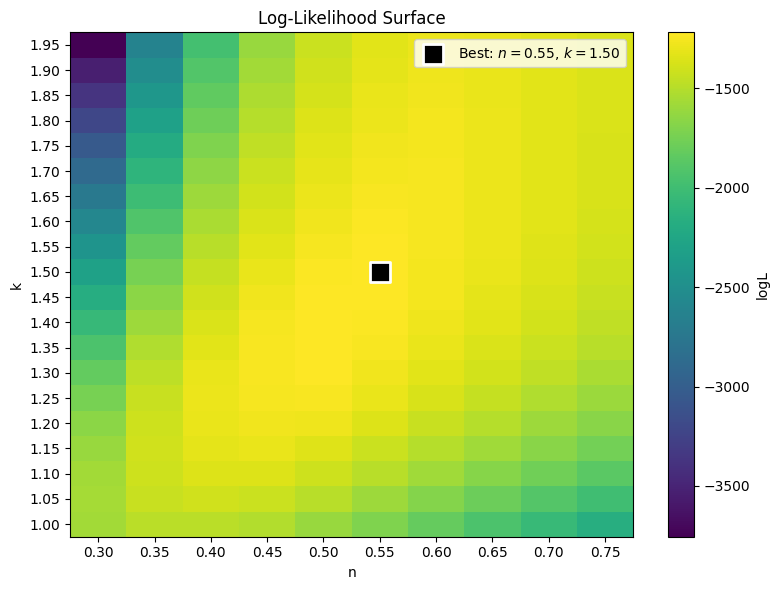

Execution time: 0.1276 seconds


In [146]:
# Find best fit
imax = np.unravel_index(np.argmax(logL_grid), logL_grid.shape)
n_best, k_best = n_grid[imax[0]], k_grid[imax[1]]
print(f"Best fit: n={n_best:.3f}, k={k_best:.3f}, logL={logL_grid[imax]:.2f}")

plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_grid, k_grid, logL_grid.T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_grid)
plt.yticks(k_grid)
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

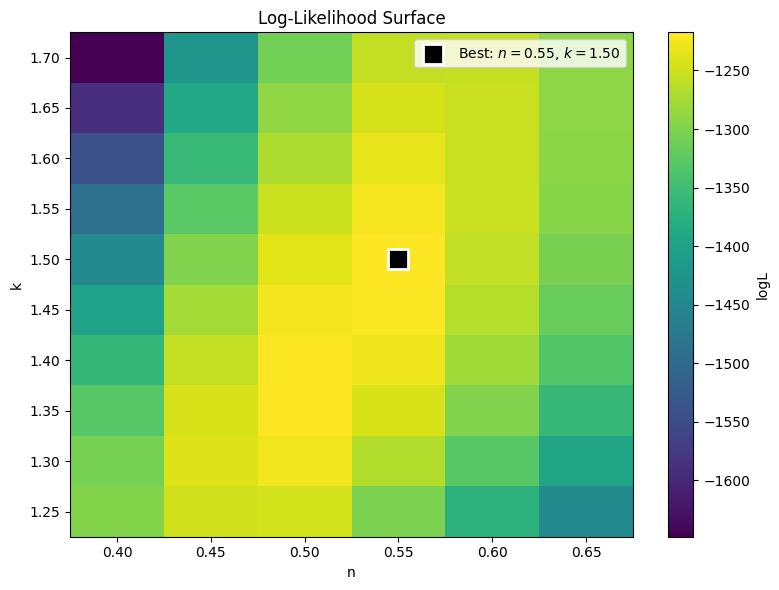

Execution time: 0.0635 seconds


In [150]:
plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_grid[2:8], k_grid[5:-5], logL_grid[2:8, 5:-5].T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_grid[2:8])
plt.yticks(k_grid[5:-5])
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

In [71]:
Mbar_obs = 10.0**obs_log_Mbar_mcmc

j_max = j_maxer(Mbar_obs)
j_min = j_max / 10.0

# k_min for each galaxy: from j_obs <= k*j_max
# At y=1 boundary: j_obs - j_min = k*j_max - j_min  =>  j_obs = k*j_max  =>  k = j_obs/j_max
k_min_per_galaxy = obs_jbar_mcmc / j_max

mask = obs_jbar_mcmc > j_min

if np.any(mask):
    k_min_sample = np.max(k_min_per_galaxy[mask])
    k_min = max(1.0, k_min_sample)
else:
    # All galaxies have j_obs <= j_min, so k >= 1 already makes them solvable
    k_min = 1.0

print(f"Suggested k_min from j_obs <= k*j_max: {k_min:.3f}")

Suggested k_min from j_obs <= k*j_max: 2.100
Execution time: 0.0070 seconds


In [72]:
names_comp = np.concatenate((BARY['Name'], ['HIX_galaxy']*len(HIX_data)))

idx_sorted = np.argsort(k_min_per_galaxy[mask])[::-1]
for i in idx_sorted[:5]:
    print(i, names_comp[i], obs_log_Mbar_mcmc[i], obs_jbar_mcmc[i], j_max[i], k_min_per_galaxy[i])
    
print("\nk_min values for top 5 galaxies:")
for i in idx_sorted[:5]:    
    print(f"{k_min_per_galaxy[i]:.3f}")
    
print([names_comp[i] for i in idx_sorted[:5]])

114 HIX_galaxy 10.59246815 6377.799997397691 3037.3983276937197 2.0997575257902774
5 DDO154     8.44715803134222 147.6 82.49456995133419 1.7892086726080674
2 DDO101     7.90687353472207 52.0 33.267309630764835 1.5630960416441855
85 UGC06446   9.093421685162236 355.8 244.45438396696355 1.4554862720240032
12 LVHIS030   8.991226075692495 259.3 205.87093419554284 1.259526999346632

k_min values for top 5 galaxies:
2.100
1.789
1.563
1.455
1.260
['HIX_galaxy', 'DDO154    ', 'DDO101    ', 'UGC06446  ', 'LVHIS030  ']
Execution time: 0.0035 seconds


In [ ]:
# zoom in around best n, k
n_zoom = np.arange(0.49, 0.56, 0.01)
k_zoom = np.arange(1.35, 1.47, 0.01)

logL_zoom = np.zeros((len(n_zoom), len(k_zoom)))
for i, n_val in enumerate(n_zoom):
    for j, k_val in enumerate(k_zoom):
        theta_ij = jnp.array([n_val, k_val], dtype=jnp.float64)

        r_acc_matrix_np_ij = build_r_acc_matrix_for_all_M(n_val, k_val, seed=seed)
        r_acc_matrix_jax_ij = jnp.array(r_acc_matrix_np_ij, dtype=jnp.float64)

        logL_ij = logL_jax(theta_ij,
                           logM_obs_jax,
                           jbar_obs_jax,
                           fgas_obs_jax,
                           sigma_fgas_jax,
                           sigma_jbar_jax,
                           r_acc_matrix_jax_ij,
                           logM_grid_jax)

        logL_zoom[i, j] = float(logL_ij)
        
        print(f"Computed logL at n={n_val}, k={k_val}: {logL_zoom[i, j]}")

Computed logL at n=0.49, k=1.35: -1219.8581390179568
Computed logL at n=0.49, k=1.36: -1219.6866020752511
Computed logL at n=0.49, k=1.37: -1219.8471225757446
Computed logL at n=0.49, k=1.3800000000000001: -1220.326141683889
Computed logL at n=0.49, k=1.3900000000000001: -1221.1988595717442
Computed logL at n=0.49, k=1.4000000000000001: -1222.3920957492878
Computed logL at n=0.49, k=1.4100000000000001: -1223.8442503703966
Computed logL at n=0.49, k=1.4200000000000002: -1225.5372425650316
Computed logL at n=0.49, k=1.4300000000000002: -1227.4621798152994
Computed logL at n=0.49, k=1.4400000000000002: -1229.5963297886556
Computed logL at n=0.49, k=1.4500000000000002: -1231.9342714237023
Computed logL at n=0.49, k=1.4600000000000002: -1234.467396942379
Computed logL at n=0.5, k=1.35: -1218.0081360886966
Computed logL at n=0.5, k=1.36: -1217.425736700277
Computed logL at n=0.5, k=1.37: -1217.170838902578
Computed logL at n=0.5, k=1.3800000000000001: -1217.2256196662966
Computed logL at n=0

Best fit: n=0.530, k=1.410, logL=-1213.42


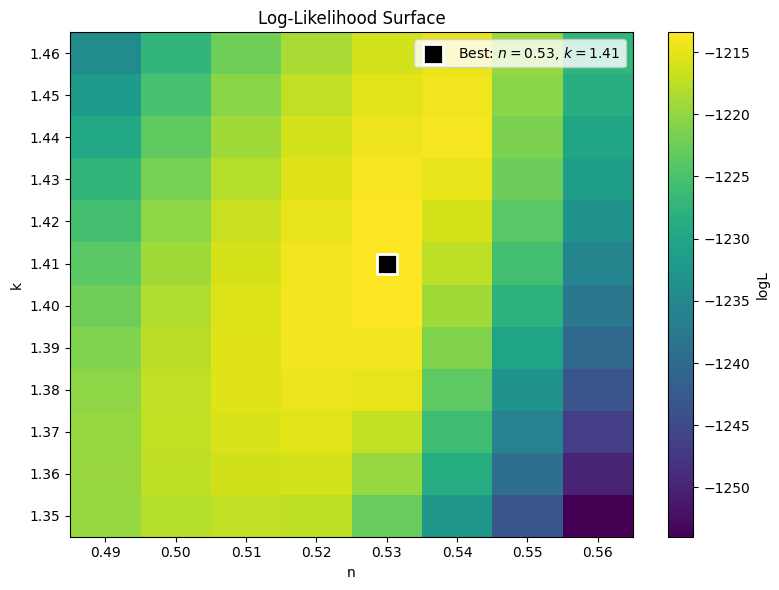

Execution time: 0.0683 seconds


In [152]:
# Find best fit
imax = np.unravel_index(np.argmax(logL_zoom), logL_zoom.shape)
n_best, k_best = n_zoom[imax[0]], k_zoom[imax[1]]
print(f"Best fit: n={n_best:.3f}, k={k_best:.3f}, logL={logL_zoom[imax]:.2f}")

plt.figure(figsize=(8,6))

axl = plt.pcolormesh(n_zoom, k_zoom, logL_zoom.T, 
                      cmap='viridis',
                      shading='auto')

plt.scatter([n_best], [k_best], color='k', marker='s', s=200, 
            edgecolors='white', linewidths=2, 
            label=r'Best: $n=%.2f$, $k=%.2f$' % (n_best, k_best))
plt.colorbar(axl, label='logL')
plt.xticks(n_zoom)
plt.yticks(k_zoom)
plt.xlabel('n')
plt.ylabel('k')
plt.title('Log-Likelihood Surface')
plt.legend()
plt.tight_layout()
#plt.savefig("../outputs/graphs10_JAX_aKSL/logL_surface.png", dpi=150)
plt.show()

# Final Plots

In [76]:
def Full_final_definer_jax_lambda(Mbar,
                                   t_acc_arr,
                                   star_formation_law,
                                   r_acc_vec,
                                   res=120,
                                   Rmax=100.1,
                                   at_t0=True):
    """
    Fully JAX version that takes r_acc_vec directly.
    Used with the λ-scatter 3D r_acc matrix.

    Mbar : scalar (Msun)
    t_acc_arr : 1D jnp.array (n_tacc,) of accretion times (Gyr)
    r_acc_vec : 1D jnp.array (n_t,) - r_acc(t) for this specific (mass, λ)
    """

    # radius grid in pc (static because res, Rmax are static)
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)

    # precompute C(t_acc) for all t_acc
    C_vals = C_def_jax(Mbar, t_acc_arr)   # shape (n_tacc,)

    # vectorised call to Sigma_definer_jax_lambda over t_acc
    def sigma_for_one_tacc(t_acc_single, C_single):
        return Sigma_definer_jax_lambda(
            r_pc,
            t_acc_single,
            Mbar,
            C_single,
            star_formation_law,
            r_acc_vec,
        )

    SD_gas = jax.vmap(sigma_for_one_tacc, in_axes=(0, 0))(t_acc_arr, C_vals)

    # post-process entirely in JAX
    return full_from_sigma_jax(
        SD_gas,
        Mbar,
        r_pc,
        dt,
        star_formation_law,
        at_t0=at_t0,
    )


@partial(jax.jit, static_argnames=("star_formation_law",))
def run_all_galaxies_lambda(Mbar_grid,
                             t_acc_arr,
                             r_acc_matrix_3d_jax,
                             star_formation_law):
    """
    Run model for all (mass, λ, t_acc) combinations.
    
    Parameters:
    -----------
    Mbar_grid : jnp.array, shape (n_masses,)
        Baryonic masses in Msun.
    t_acc_arr : jnp.array, shape (n_tacc,)
        Accretion timescales in Gyr.
    r_acc_matrix_3d_jax : jnp.array, shape (n_masses, n_lambda, n_t)
        3D r_acc matrix from build_r_acc_matrix_for_all_M_lambda_jax.
    star_formation_law : str
        Star formation law type.
    
    Returns:
    --------
    f_gas_all : shape (n_masses, n_lambda, n_tacc)
    j_bar_all : shape (n_masses, n_lambda, n_tacc)
    j_gas_all : shape (n_masses, n_lambda, n_tacc)
    j_star_all : shape (n_masses, n_lambda, n_tacc)
    Ms_all : shape (n_masses, n_lambda, n_tacc)
    Mg_all : shape (n_masses, n_lambda, n_tacc)
    """
    
    def per_mass_lambda(Mbar, r_acc_vec):
        # For one (mass, λ) pair, run all t_acc values
        return Full_final_definer_jax_lambda(
            Mbar,
            t_acc_arr,
            star_formation_law,
            r_acc_vec,
            at_t0=True,
        )
    
    def per_mass(mass_idx):
        Mbar = Mbar_grid[mass_idx]
        r_acc_for_this_mass = r_acc_matrix_3d_jax[mass_idx]  # shape (n_lambda, n_t)
        
        # vmap over λ dimension
        f_gas, j_bar, j_gas, j_star, Ms, Mg = jax.vmap(
            lambda r_acc_vec: per_mass_lambda(Mbar, r_acc_vec)
        )(r_acc_for_this_mass)
        
        return f_gas, j_bar, j_gas, j_star, Ms, Mg
    
    # vmap over mass indices
    mass_indices = jnp.arange(len(Mbar_grid))
    f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all = jax.vmap(per_mass)(mass_indices)
    
    return f_gas_all, j_bar_all, j_gas_all, j_star_all, Ms_all, Mg_all

Execution time: 0.0015 seconds


## Final Plot (10 $t_{acc}$ and 50 $M_{bar}$)

In [95]:
ns = n_median#0.355#1.118
ks = k_median#1.791#2.264

r_acc_matrix_np  = build_r_acc_matrix_for_all_M(ns, ks, seed=seed)
r_acc_matrix_jax = jnp.array(r_acc_matrix_np, dtype=jnp.float64)

log_M_bar_array = np.linspace(8,11.5,50)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

omega_acc_array = np.array([-1.9, -1, -0.3, 0.1, 1/3, 0.75, 1, 2, 4, 8, 10], dtype=float)
t_acc_array = 1/omega_acc_array#np.array([1, 2, 3, 10, 25, -25, -10, -3], dtype=float)
t_acc_jax = jnp.array(t_acc_array, dtype=jnp.float64)

Mbar_grid = 10.0**log_M_bar_array
Mbar_grid_jax = jnp.array(Mbar_grid, dtype=jnp.float64)

f_gas_j, j_bar_j, j_gas_j, j_star_j, Ms_j, Mg_j = run_all_masses(
    Mbar_grid_jax,
    t_acc_jax,
    r_acc_matrix_jax,
    logM_grid_jax,
    star_formation_law="cutoff_ksl"
)

f_gas_array_10_50_cutoff_ksl = np.array(f_gas_j)
j_bar_array_10_50_cutoff_ksl = np.array(j_bar_j)
j_gas_array_10_50_cutoff_ksl = np.array(j_gas_j)
j_star_array_10_50_cutoff_ksl = np.array(j_star_j)
Mstar_grid = np.array(Ms_j)
Mgas_grid = np.array(Mg_j)
np.savetxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt', f_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt', j_bar_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt', j_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt', j_star_array_10_50_cutoff_ksl)
np.savetxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt', Mstar_grid)
np.savetxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt', Mgas_grid)

Execution time: 19.3080 seconds


In [ ]:
# FINAL PLOT WITH λ SCATTER

ns = n_median
ks = k_median

# Build 3D r_acc matrix with λ scatter: shape (50, 5, n_t)
r_acc_matrix_3d_np = build_r_acc_matrix_for_all_M_lambda(ns, ks)
r_acc_matrix_3d_jax = jnp.array(r_acc_matrix_3d_np, dtype=jnp.float64)

log_M_bar_array = np.linspace(8, 11.5, 50)
logM_grid_jax = jnp.array(log_M_bar_array, dtype=jnp.float64)

omega_acc_array = np.array([-0.3, 0.1, 1/3, 0.5, 0.75, 1, 4, 8, 10], dtype=float)
t_acc_array = 1/omega_acc_array
t_acc_jax = jnp.array(t_acc_array, dtype=jnp.float64)

Mbar_grid = 10.0**log_M_bar_array
Mbar_grid_jax = jnp.array(Mbar_grid, dtype=jnp.float64)

# Run model for all (mass, λ, t_acc) combinations
f_gas_j, j_bar_j, j_gas_j, j_star_j, Ms_j, Mg_j = run_all_galaxies_lambda(
    Mbar_grid_jax,
    t_acc_jax,
    r_acc_matrix_3d_jax,
    star_formation_law="cutoff_ksl"
)

f_gas_array_lambda = np.array(f_gas_j)
j_bar_array_lambda = np.array(j_bar_j)
j_gas_array_lambda = np.array(j_gas_j)
j_star_array_lambda = np.array(j_star_j)
Mstar_grid_lambda = np.array(Ms_j)
Mgas_grid_lambda = np.array(Mg_j)

# For plotting: flatten to 1D arrays
# Each mass now has n_lambda×n_tacc galaxies instead of just n_tacc
n_masses, n_lambda, n_tacc = f_gas_array_lambda.shape
n_galaxies_per_mass = n_lambda * n_tacc

f_gas_flat = f_gas_array_lambda.reshape(n_masses, -1)
j_bar_flat = j_bar_array_lambda.reshape(n_masses, -1)
j_gas_flat = j_gas_array_lambda.reshape(n_masses, -1)
j_star_flat = j_star_array_lambda.reshape(n_masses, -1)
Mstar_flat = Mstar_grid_lambda.reshape(n_masses, -1)
Mgas_flat = Mgas_grid_lambda.reshape(n_masses, -1)

Mbar_expanded = np.tile(Mbar_grid[:, np.newaxis], (1, n_galaxies_per_mass))

np.savetxt('../data/data9_JAX_aKSL/final_f_gas_lambda.txt', f_gas_flat)
np.savetxt('../data/data9_JAX_aKSL/final_j_bar_lambda.txt', j_bar_flat)
np.savetxt('../data/data9_JAX_aKSL/final_j_gas_lambda.txt', j_gas_flat)
np.savetxt('../data/data9_JAX_aKSL/final_j_star_lambda.txt', j_star_flat)
np.savetxt('../data/data9_JAX_aKSL/final_Mstar_lambda.txt', Mstar_flat)
np.savetxt('../data/data9_JAX_aKSL/final_Mgas_lambda.txt', Mgas_flat)

NameError: name 'run_all_galaxies_lambda' is not defined

Execution time: 0.7150 seconds


### Plot

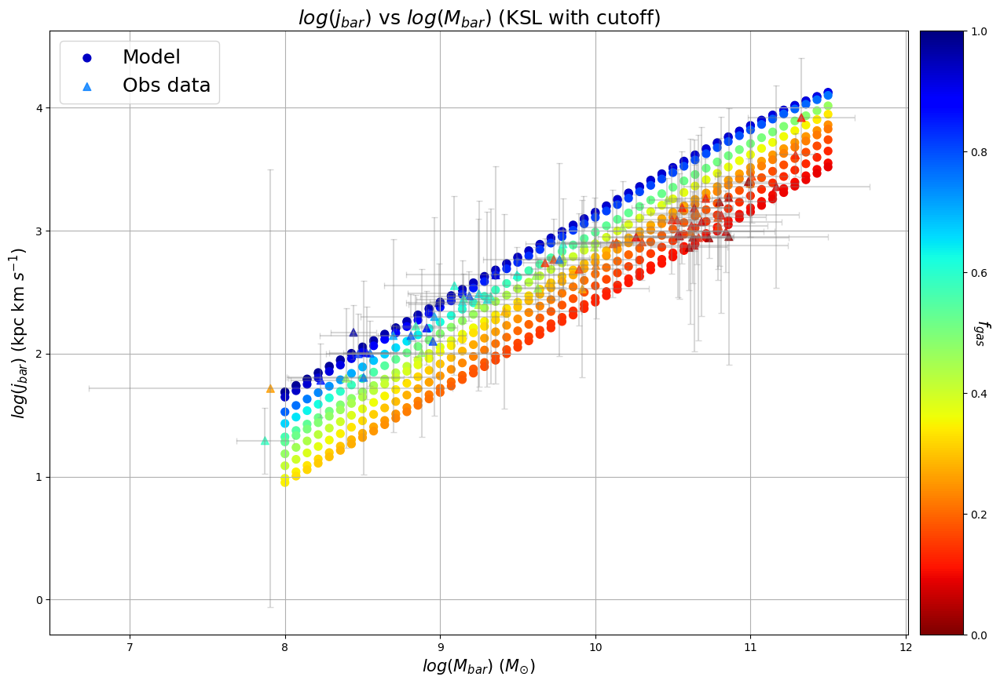

Execution time: 0.1769 seconds


In [96]:
f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'), nan=np.nan, posinf=1.0, neginf=0.0)
j_bar_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt'), nan=np.nan, posinf=1.0, neginf=0.0)
log_M_bar_array = np.linspace(8,11.5,50)

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=50)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(obs_fgas), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig(f'../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (50 masses, cutoff KSL, k{ks}, n{ns}).png')

# Interpolate at constant $M_{bar}$

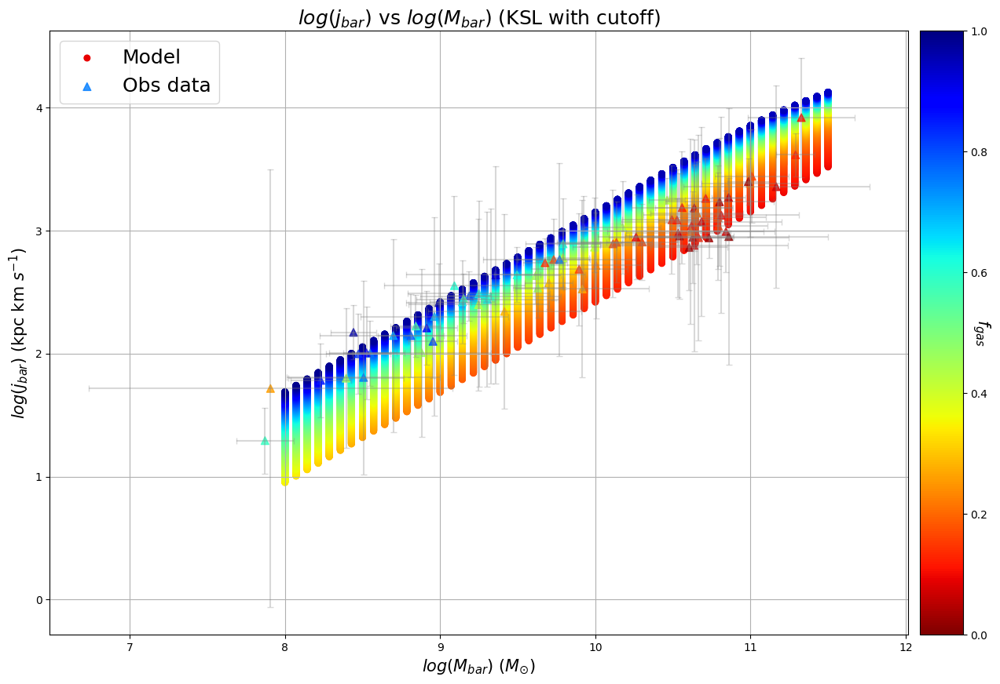

Execution time: 0.8608 seconds


In [97]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10), facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

n=1000
interp_f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    interp_f_gas_array_10_50_cutoff_ksl[i] = np.linspace(f_gas_array_10_50_cutoff_ksl[i].min(),f_gas_array_10_50_cutoff_ksl[i].max(),n)

interp_j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    ipl_10_50 = spl.interp1d(f_gas_array_10_50_cutoff_ksl[i], log_j_bar_array_10_50[i], kind='linear')
    interp_j_bar_array_10_50_cutoff_ksl[i] = ipl_10_50(interp_f_gas_array_10_50_cutoff_ksl[i])

for x, y, z in zip(log_M_bar_array, interp_j_bar_array_10_50_cutoff_ksl, interp_f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=30)
mod.set_label("Model")
cbar = fig.colorbar(mod, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_log_Mbar, obs_log_jbar, label="Obs data", marker="^", facecolors=cmap(obs_fgas), s=50, alpha=0.8)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (cutoff KSL).png')

## Interpolator

In [98]:
def modelled_j_bar2(f_gas_array, j_bar_array, f_gas_value, kind=1):
    """
    The function takes as input the arrays for f_gas and j_bar (possibly already interpolated), 
    together with a wanted value of f_gas for which to slice out the 1D array. 
    
    ------------
    Inputs:
    - f_gas_array = interpolated 2D array of f_gas
    - j_bar_array = interpolated 2D array of j_bar
    - f_gas_value = value of f_gas for which to slice the f_gas/j_bar arrays
    - kind = Inerpolation type (default is 1 - linear)
    
    The function does the following
    - Creates a list 'index_array', which has the indexes of constant f_gas_value chosen as elements.
    - Then, it iteratively takes from the j_bar_array the values corresponding to the indexes from index_array
    - Finally it interpolates the indexed j_bar_array through the M_bar_array, to get a plottable linear function.
    
    Returns:
    - indexed_M_array_lin = A simple linspace with the initial and final values of the original log_M_bar_array
    """
    indexed_j_array = []
    index_array = []
    true_list = []
    
    for i in range(len(log_M_bar_array)):
        if f_gas_value>np.min(f_gas_array[i]) and f_gas_value<np.max(f_gas_array[i]):
            index_array.append(np.argwhere(f_gas_array[i] == min(f_gas_array[i], key=lambda x:abs(x-f_gas_value))))
            true_list.append(1)
        else:
            index_array.append(0)
            true_list.append(0)
    
    j = 0
    while (j<50):
        if (true_list[j]==1):
            indexed_j_array.append(j_bar_array[j][index_array[j]])
        j += 1
    
    if len(indexed_j_array)>kind:
        index = np.argwhere(np.array(true_list) == 1)
        indexed_M_array = log_M_bar_array[index]
        indexed_M_array_lin = np.linspace(indexed_M_array[0], indexed_M_array[-1], 1000)
        interpolation = spl.InterpolatedUnivariateSpline(indexed_M_array.reshape(len(indexed_M_array),), indexed_j_array, k=kind)
        interpolated_j_array = interpolation(indexed_M_array_lin).reshape(len(indexed_M_array_lin),)
    else:
        indexed_M_array_lin = []
        interpolated_j_array = []
    
    return indexed_M_array_lin, interpolated_j_array

Execution time: 0.0016 seconds


## Final Graph -- interpolation at constant $f_{gas}$

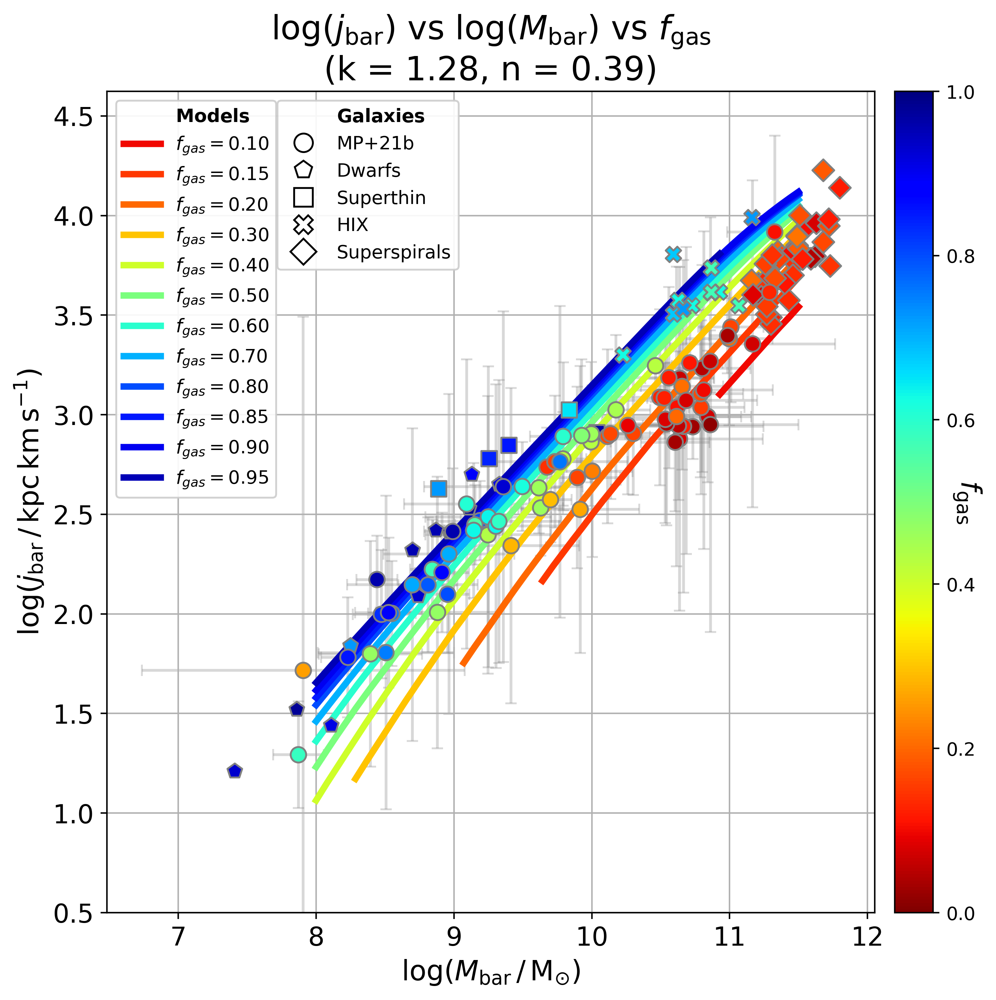

Execution time: 0.7696 seconds


In [99]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

mods = frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05, 0.075, 0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9,0.95]
colors = cmap(f_gas_values)
ax1s = []
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)
    if len(indexed_M_array_lin) > 0:
        ax1s.append(ax1[0])

#Data
ax2 = frame.scatter(obs_log_Mbar, obs_log_jbar, label="MP+21b", marker="o", facecolors=cmap(obs_fgas), edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_log_Mbar, obs_log_jbar, xerr=obs_log_Mbar_errors, yerr=obs_log_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's', 
    'HIX': 'X',
    'Superspirals': 'D',
    #'UDGs': 'P',
    #'GLSBs': '^'
}
# scatter_legends = []
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    # print(idx, marker)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=idx, marker=marker, facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)
    # scatter_legends.append(scatter)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s
 
galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals'] #, 'UDGs', 'GLSBs'
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', bbox_to_anchor=(0.21, 1.0), framealpha=0.9)
# frame.legend(handles=models_legend_elements + galaxies_legend_elements, 
#              ncol=2, columnspacing=2.0, loc='upper left')
    
# scatter_legend_elements = [
#     plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
#     for marker, name in zip(('p', 's', 'X', 'D', 'P', '^'), ('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GLSBs'))
# ]
    
# legend_elements = scatter_legend_elements + [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")] + mods + ax1s

frame.set_title(rf"$\log(j_{{\rm bar}})$ vs $\log(M_{{\rm bar}})$ vs $f_{{\rm gas}}$" + '\n' + f"(k = {ks:.2f}, n = {ns:.2f})", fontsize = 18)
frame.set_xlabel(r"$\log(M_{\rm bar} \, / \, \rm M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$\log(j_{\rm bar} \, / \, \rm kpc \, km \, s^{-1})$", fontsize = 15)
#frame.legend(handles=legend_elements, ncol=2)
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
frame.set_ylim(0.5)
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL).png')

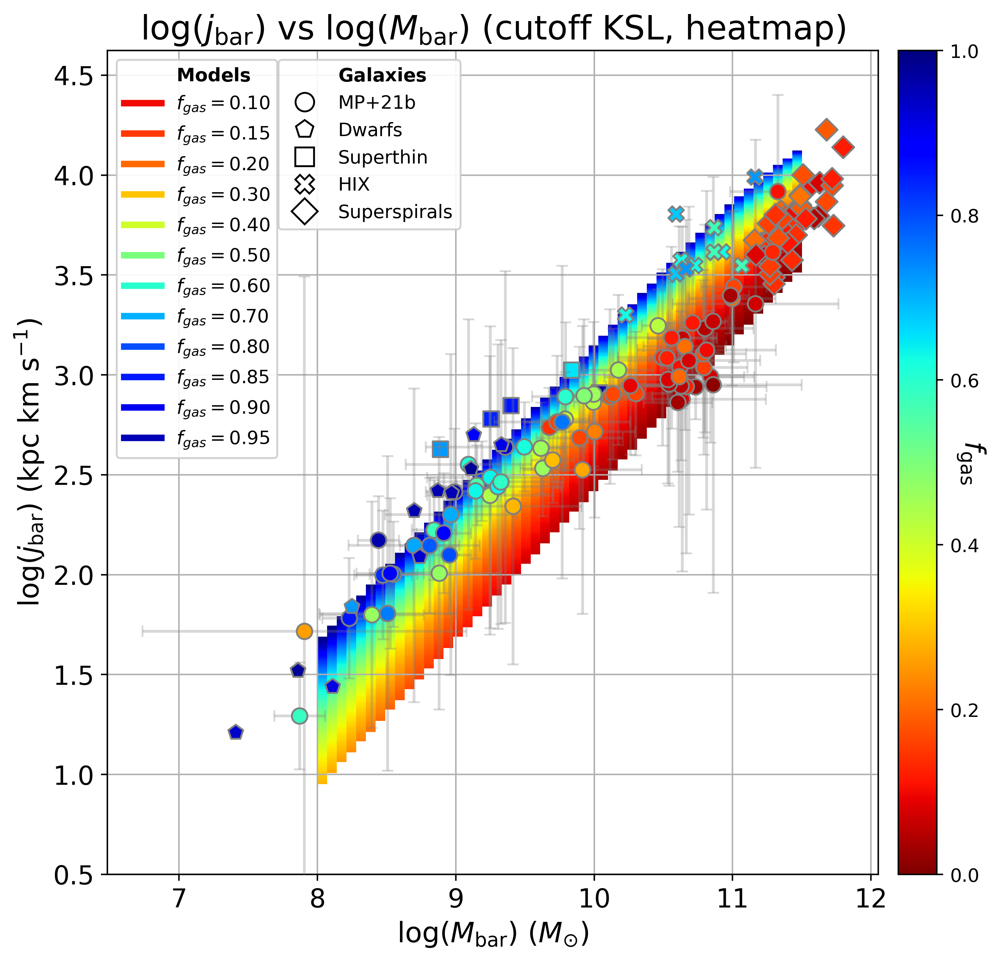

Execution time: 0.5547 seconds


In [100]:
logj_min = np.nanmin(interp_j_bar_array_10_50_cutoff_ksl)
logj_max = np.nanmax(interp_j_bar_array_10_50_cutoff_ksl)

n_j = 400 # number of j grid points
logj_grid = np.linspace(logj_min, logj_max, n_j)

n_M = len(log_M_bar_array)
F_grid = np.full((n_M, n_j), np.nan)  # F_grid[i_M, i_j] = f_gas at (logM[i_M], logj_grid[i_j])

for iM in range(n_M):
    logj_i = interp_j_bar_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)
    f_i    = interp_f_gas_array_10_50_cutoff_ksl[iM]      # shape (n_interp,)

    mask = np.isfinite(logj_i) & np.isfinite(f_i)
    if mask.sum() < 2:
        continue

    logj_i = logj_i[mask]
    f_i    = f_i[mask]

    # sort by log j so interpolation is well-defined
    order = np.argsort(logj_i)
    logj_i = logj_i[order]
    f_i    = f_i[order]

    # f_gas as a function of log j for this mass
    f_interp = spl.interp1d(
        logj_i, f_i,
        kind='linear',
        bounds_error=False,
        fill_value=np.nan
    )

    F_grid[iM, :] = f_interp(logj_grid)

# --- 2. Plot heatmap + data ---

cmap = cm.jet_r
plt.rc("image", cmap="jet_r")

fig = plt.figure(figsize=(8, 8), dpi=400, facecolor='w')
frame = fig.add_subplot(1, 1, 1)

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

# imshow wants (Ny, Nx); our F_grid is (n_M, n_j),
# so transpose and map x -> log M, y -> log j
F_im = np.ma.masked_invalid(F_grid.T)  # shape (n_j, n_M)

im = frame.imshow(
    F_im,
    origin='lower',
    aspect='auto',
    extent=[
        log_M_bar_array.min(), log_M_bar_array.max(),
        logj_min, logj_max
    ],
    cmap=cmap,
    interpolation='nearest',
    vmin=np.nanmin(F_grid),
    vmax=np.nanmax(F_grid),
)

# --- overlay observational points (same as before) ---

# main MP+21 sample
ax2 = frame.scatter(
    obs_log_Mbar,
    obs_log_jbar,
    label="MP+21b",
    marker="o",
    facecolors=cmap(obs_fgas),
    edgecolors="grey",
    s=70,
    zorder=5,
)
frame.errorbar(
    obs_log_Mbar,
    obs_log_jbar,
    xerr=obs_log_Mbar_errors,
    yerr=obs_log_jbar_errors,
    fmt=' ',
    ecolor='grey',
    capsize=3,
    alpha=0.3,
    zorder=4,
)

cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's', 
    'HIX': 'X',
    'Superspirals': 'D',
    #'UDGs': 'P',
    #'GLSBs': '^'
}
# scatter_legends = []
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    # print(idx, marker)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=idx, marker=marker, facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)
    # scatter_legends.append(scatter)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s
 
galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals']
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', bbox_to_anchor=(0.21, 1.0), framealpha=0.9)

frame.set_title(r"$\log(j_{\rm bar})$ vs $\log(M_{\rm bar})$ (cutoff KSL, heatmap)", fontsize=18)
frame.set_xlabel(r"$\log(M_{\rm bar})\ (M_{\odot})$", fontsize=15)
frame.set_ylabel(r"$\log(j_{\rm bar})$ (kpc km s$^{-1}$)", fontsize=15)
frame.tick_params(labelsize=14)
#frame.legend(handles=legend_elements)
frame.grid(zorder=1)
frame.set_ylim(0.5)
plt.show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log_jbar_vs_logMbar_heatmap_cutoffKSL.png')

### $j_{\rm bar}$ vs $f_{\rm gas}$ at fixed $M_{\rm bar}$

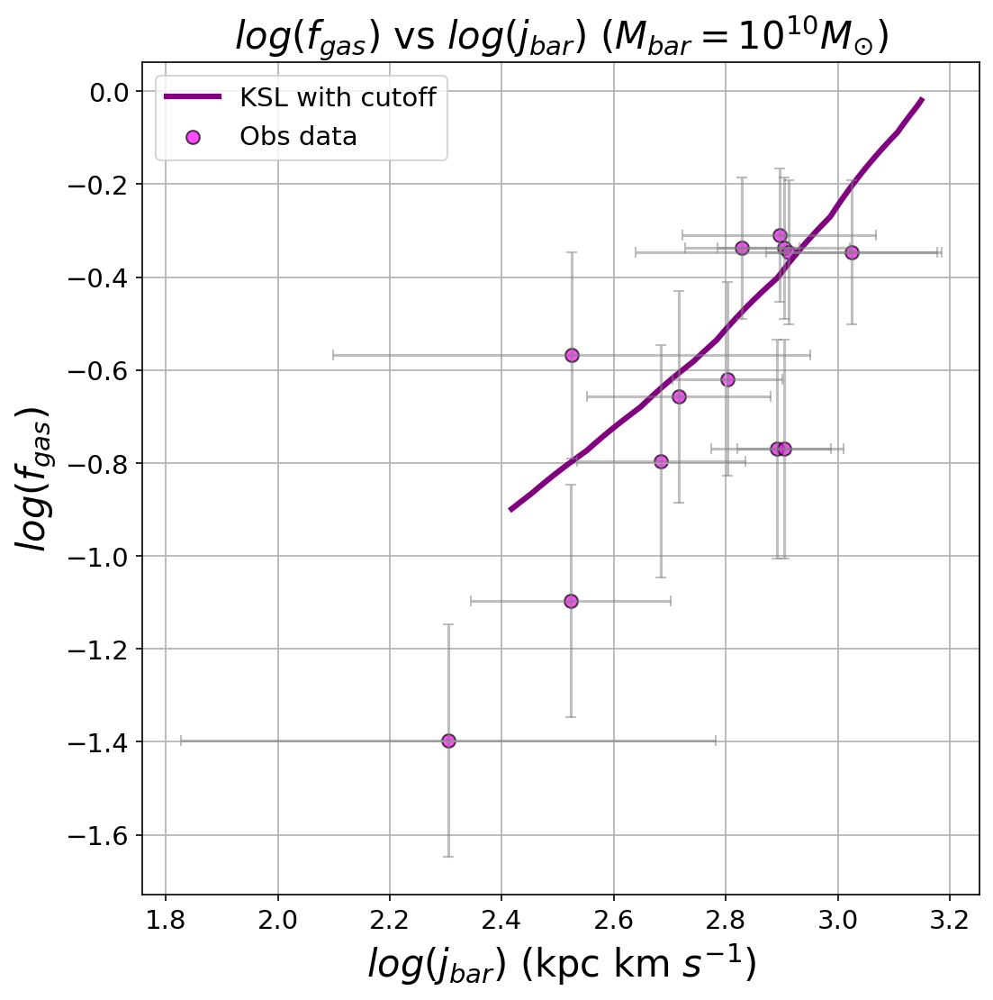

Execution time: 0.1138 seconds


In [101]:
BARY_10 = pd.read_csv('../data/baryons_10.csv')

BARY_10['j'] =  pd.to_numeric(BARY_10['j'], errors='coerce')
BARY_10['e_j'] =  pd.to_numeric(BARY_10['e_j'], errors='coerce')
BARY_10['fgas'] =  pd.to_numeric(BARY_10['fgas'], errors='coerce')
BARY_10['e_fgas'] =  pd.to_numeric(BARY_10['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_10['fgas'])
obs_fgas_errors_10 = BARY_10['e_fgas']/BARY_10['fgas']
obs_jbar_10 = np.log10(BARY_10['j'])
obs_jbar_errors_10 = BARY_10['e_j']/BARY_10['j']

M_bar_index_10 = np.argwhere(log_M_bar_array == 10)[0][0]

HIX_indices_10 = np.where((HIX_data['logMbar'] >= 9.8) & (HIX_data['logMbar'] <= 10.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_10]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_10]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_10], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_10]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_10]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
#frame.scatter(np.log10(HIX_fgas[HIX_indices_10]), np.log10(HIX_jbar[HIX_indices_10]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{10} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1.75,0)
frame.grid()
show()

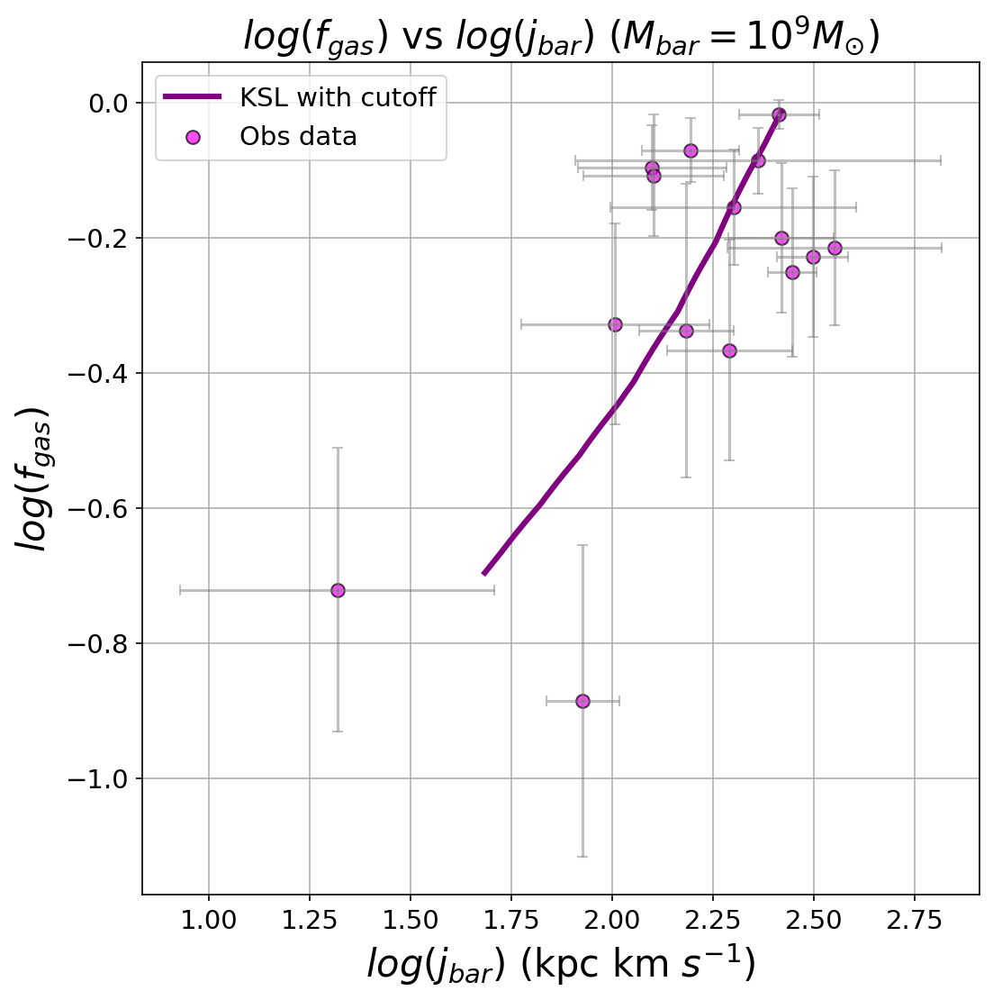

Execution time: 0.0772 seconds


In [102]:
BARY_9 = pd.read_csv('../data/baryons_9.csv')

BARY_9['j'] =  pd.to_numeric(BARY_9['j'], errors='coerce')
BARY_9['e_j'] =  pd.to_numeric(BARY_9['e_j'], errors='coerce')
BARY_9['fgas'] =  pd.to_numeric(BARY_9['fgas'], errors='coerce')
BARY_9['e_fgas'] =  pd.to_numeric(BARY_9['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_9['fgas'])
obs_fgas_errors_10 = BARY_9['e_fgas']/BARY_9['fgas']
obs_jbar_10 = np.log10(BARY_9['j'])
obs_jbar_errors_10 = BARY_9['e_j']/BARY_9['j']

M_bar_index_9 = np.argwhere(log_M_bar_array == 9)[0][0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_9]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_9]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_9], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_9]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_9]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{9} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

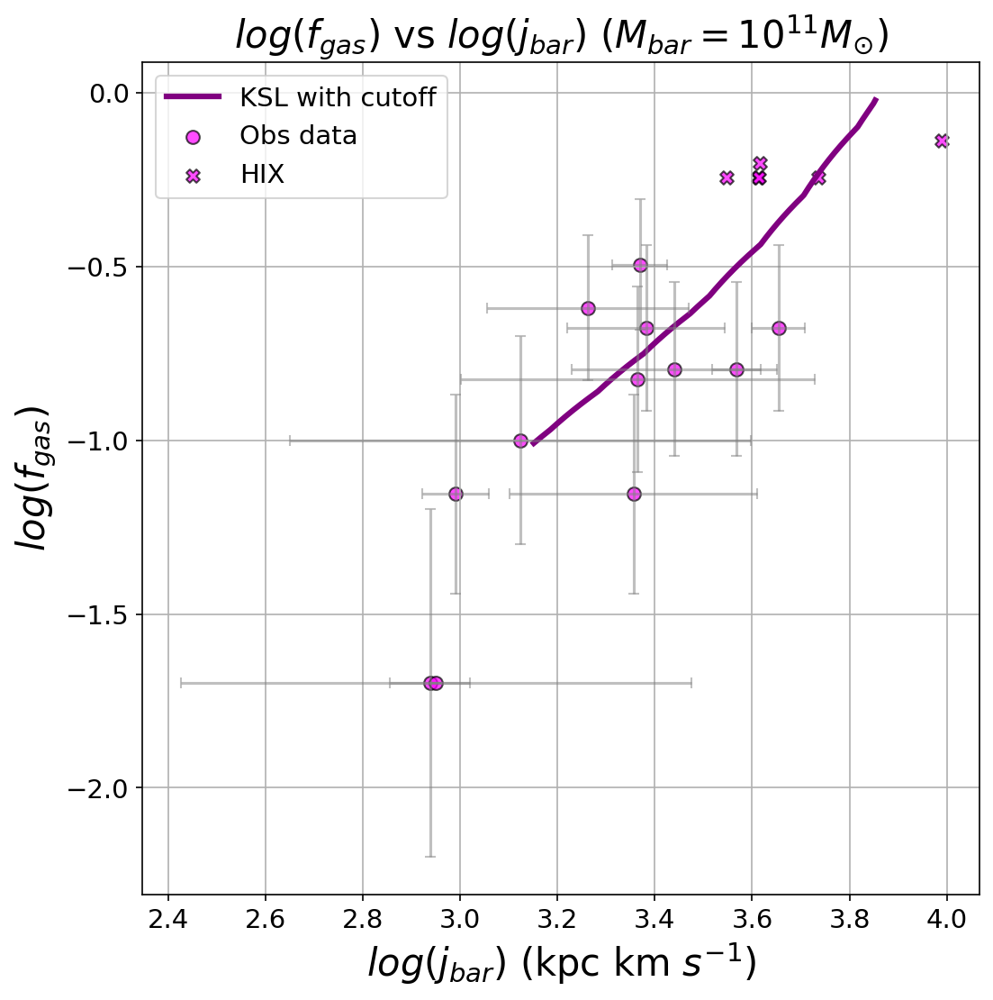

Execution time: 0.0796 seconds


In [103]:
BARY_11 = pd.read_csv('../data/baryons_11.csv')

BARY_11['j'] =  pd.to_numeric(BARY_11['j'], errors='coerce')
BARY_11['e_j'] =  pd.to_numeric(BARY_11['e_j'], errors='coerce')
BARY_11['fgas'] =  pd.to_numeric(BARY_11['fgas'], errors='coerce')
BARY_11['e_fgas'] =  pd.to_numeric(BARY_11['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_11['fgas'])
obs_fgas_errors_10 = BARY_11['e_fgas']/BARY_11['fgas']
obs_jbar_10 = np.log10(BARY_11['j'])
obs_jbar_errors_10 = BARY_11['e_j']/BARY_11['j']

M_bar_index_11 = np.argwhere(log_M_bar_array == 11)[0][0]

HIX_indices_11 = np.where((HIX_data['logMbar'] >= 10.8) & (HIX_data['logMbar'] <= 11.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_11]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_11]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_11], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_11]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_11]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.scatter(np.log10(HIX_data['Jbar'][HIX_indices_11]), np.log10(HIX_data['fgas'][HIX_indices_11]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{11} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

logM=9 (actual: 9.00):
  j_bar range: [48.3, 262.1] kpc km/s
  f_gas range: [0.201, 0.968]
logM=10 (actual: 10.00):
  j_bar range: [261.5, 1407.6] kpc km/s
  f_gas range: [0.126, 0.956]
logM=11 (actual: 11.00):
  j_bar range: [1415.8, 7128.5] kpc km/s
  f_gas range: [0.098, 0.950]


/var/folders/hz/s07cwl6d5_v5tr1l0jp_v5dr0000gn/T/ipykernel_59236/1505926430.py:96: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(hix_j, np.log10(hix_f), c='magenta', s=50, edgecolors='k',


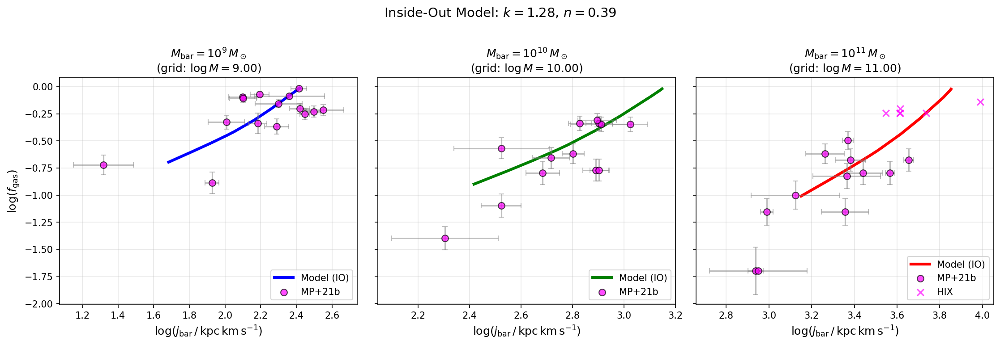

Execution time: 0.4169 seconds


In [104]:
BARY_9 = pd.read_csv('../data/baryons_9.csv')
BARY_10 = pd.read_csv('../data/baryons_10.csv')
BARY_11 = pd.read_csv('../data/baryons_11.csv')

for df in [BARY_9, BARY_10, BARY_11]:
    df['j'] = pd.to_numeric(df['j'], errors='coerce')
    df['e_j'] = pd.to_numeric(df['e_j'], errors='coerce')
    df['fgas'] = pd.to_numeric(df['fgas'], errors='coerce')
    df['e_fgas'] = pd.to_numeric(df['e_fgas'], errors='coerce')

# HIX indices for logM=11 panel
HIX_indices_11 = np.where((HIX_data['logMbar'] >= 10.8) & (HIX_data['logMbar'] <= 11.2))[0]

# Load the model arrays (use the non-lambda versions for now)
f_gas_model = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'), nan=np.nan)
j_bar_model = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_bar_cutoff_ksl.txt'), nan=np.nan)

# Mass grid used in the model
log_M_bar_array_plot = np.linspace(8, 11.5, 50)

# Target masses for the mosaic
masses = [9, 10, 11]
model_profiles = {}

for logM in masses:
    # Find closest mass index
    mass_idx = np.argmin(np.abs(log_M_bar_array_plot - logM))
    actual_logM = log_M_bar_array_plot[mass_idx]
    
    # Extract f_gas and j_bar for this mass (across all omega_acc values)
    f_gas_at_mass = f_gas_model[mass_idx, :]
    j_bar_at_mass = j_bar_model[mass_idx, :]
    
    # Filter valid points and sort by f_gas
    valid = (f_gas_at_mass > 0.01) & (f_gas_at_mass < 0.99) & (j_bar_at_mass > 0)
    f_gas_valid = f_gas_at_mass[valid]
    j_bar_valid = j_bar_at_mass[valid]
    
    # Sort by f_gas for clean line plotting
    sort_idx = np.argsort(f_gas_valid)
    
    model_profiles[logM] = {
        'f_gas': f_gas_valid[sort_idx],
        'j_bar': j_bar_valid[sort_idx],
        'actual_logM': actual_logM,
    }
    
    # Save as CSV
    df_save = pd.DataFrame({
        'j_bar_kpc_km_s': model_profiles[logM]['j_bar'],
        'f_gas': model_profiles[logM]['f_gas'],
    })
    df_save.to_csv(f'../outputs/jbar_fgas_profiles/io/jbar_fgas_logM{logM}.csv', index=False)
    
    print(f"logM={logM} (actual: {actual_logM:.2f}):")
    print(f"  j_bar range: [{model_profiles[logM]['j_bar'].min():.1f}, {model_profiles[logM]['j_bar'].max():.1f}] kpc km/s")
    print(f"  f_gas range: [{model_profiles[logM]['f_gas'].min():.3f}, {model_profiles[logM]['f_gas'].max():.3f}]")

# Create mosaic plot
fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=150, sharey=True)

obs_data = {9: BARY_9, 10: BARY_10, 11: BARY_11}
colors = {9: 'blue', 10: 'green', 11: 'red'}

for i, logM in enumerate(masses):
    ax = axes[i]
    
    # Model curve
    j_bar_mod = model_profiles[logM]['j_bar']
    f_gas_mod = model_profiles[logM]['f_gas']
    actual_logM = model_profiles[logM]['actual_logM']
    
    ax.plot(np.log10(j_bar_mod), np.log10(f_gas_mod), 
            color=colors[logM], lw=3, label='Model (IO)')
    
    # Observed data
    df_obs = obs_data[logM]
    valid_obs = (df_obs['j'] > 0) & (df_obs['fgas'] > 0)
    obs_j = np.log10(df_obs.loc[valid_obs, 'j'].values)
    obs_f = np.log10(df_obs.loc[valid_obs, 'fgas'].values)
    obs_j_err = df_obs.loc[valid_obs, 'e_j'].values / df_obs.loc[valid_obs, 'j'].values / np.log(10)
    obs_f_err = df_obs.loc[valid_obs, 'e_fgas'].values / df_obs.loc[valid_obs, 'fgas'].values / np.log(10)
    
    ax.scatter(obs_j, obs_f, c='magenta', s=50, edgecolors='k', 
               alpha=0.7, zorder=5, label='MP+21b')
    ax.errorbar(obs_j, obs_f, xerr=obs_j_err, yerr=obs_f_err,
                fmt=' ', ecolor='grey', capsize=3, alpha=0.5, zorder=4)
    
    # Add HIX galaxies for logM=11 panel
    if logM == 11:
        hix_j = HIX_data['logjbar'].iloc[HIX_indices_11].values
        hix_f = HIX_data['fgas'].iloc[HIX_indices_11].values
        # hix_j_err = 0.13*(10**hix_j) / np.log(10)
        # hix_f_err = 0.21*hix_f
        
        ax.scatter(hix_j, np.log10(hix_f), c='magenta', s=50, edgecolors='k',
                   alpha=0.7, zorder=5, marker='x', label='HIX')
        # ax.errorbar(hix_j, hix_f, xerr=hix_j_err, yerr=hix_f_err,
        #             fmt=' ', ecolor='grey', capsize=3, alpha=0.5, zorder=4)
    
    ax.set_title(rf'$M_{{\rm bar}} = 10^{{{logM}}} \, M_\odot$' + '\n' + 
                 rf'(grid: $\log M = {actual_logM:.2f}$)',
                 fontsize=12)
    ax.set_xlabel(r'$\log(j_{\rm bar} \, / \, {\rm kpc \, km \, s^{-1}})$', fontsize=12)
    if i == 0:
        ax.set_ylabel(r'$\log(f_{\rm gas})$', fontsize=12)
    ax.legend(loc='lower right', fontsize=10)
    ax.grid(alpha=0.3)

plt.suptitle(rf'Inside-Out Model: $k = {ks:.2f}$, $n = {ns:.2f}$',
             fontsize=14, y=1.02)
plt.tight_layout()
plt.savefig('../outputs/jbar_fgas_profiles/io/jbar_vs_fgas_mosaic.png', dpi=300, bbox_inches='tight')
plt.show()

### Stellar Relation

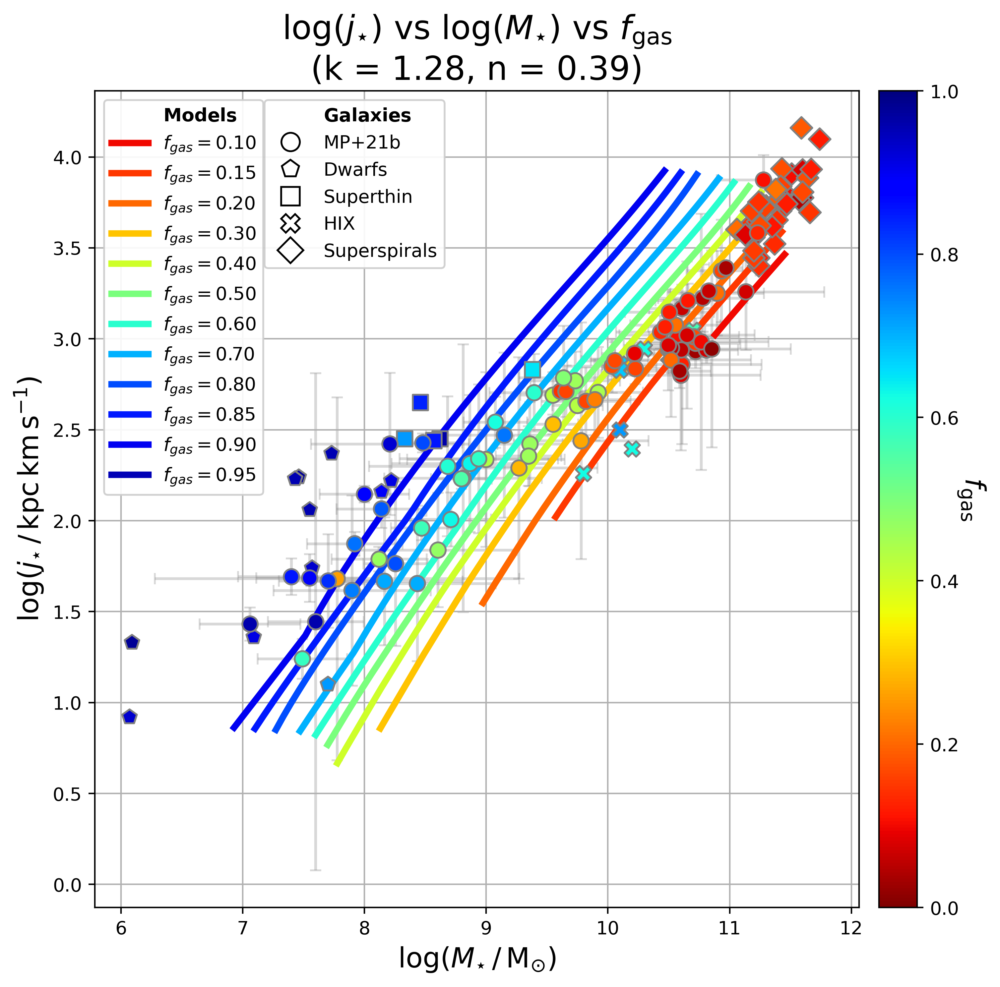

Execution time: 0.4773 seconds


In [110]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
j_star_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_star_cutoff_ksl.txt'))
M_star_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mstar_grid_cutoff_ksl.txt'))
log_M_star_array = np.linspace(7,11.5,50)

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_star_array_10_50 = np.log10(
    j_star_array_10_50_cutoff_ksl,
    where=(j_star_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_star_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMstar = []
f_to_logjstar = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_star_array_cutoff_ksl[i]) & (M_star_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_star_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMstar.append(None); f_to_logjstar.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_star_array_cutoff_ksl[i, m][order])
    yJ = log_j_star_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMstar.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjstar.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400,  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMstar])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjstar])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mstar, obs_log_jstar, label="MP+21b", marker="o",
                    facecolors=cmap(obs_fgas), 
                    edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_log_Mstar, obs_log_jstar, 
               xerr=obs_log_Mstar_errors, yerr=obs_log_jstar_errors,
               fmt=' ', ecolor='grey', capsize=3, alpha=0.3, zorder=0)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's',
    'HIX': 'X',
    'Superspirals': 'D',
}
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    frame.scatter(df['logMstar'], df['logjstar'], marker=marker,
                  facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)

cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15, labelpad=15)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s

galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', 
               markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none',
               markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals']
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', 
                    bbox_to_anchor=(0.21, 1.0), framealpha=0.9)

title_str = (rf"$\log(j_{{\star}})$ vs $\log(M_{{\star}})$ vs $f_{{\rm gas}}$" + "\n" +
            f"(k = {ks:.2f}, n = {ns:.2f})")
frame.set_title(title_str, fontsize=18)
frame.set_xlabel(r"$\log(M_{\star} \, / \, \rm M_{\odot})$", fontsize=15)
frame.set_ylabel(r"$\log(j_{\star} \, / \, \rm kpc \, km \, s^{-1})$", fontsize=15)
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_star vs log_M_star with Pavel (interpolated, cutoff KSL).png')

### Gas Relation

In [113]:
def compute_gas_with_threshold(Mbar, t_acc, r_acc_matrix_jax, logM_grid_jax,
                                threshold=1.0, star_formation_law="cutoff_ksl",
                                res=120, Rmax=100.1):
    """
    Compute M_gas and j_gas within radius where Σ_gas > threshold.
    
    Parameters:
    -----------
    threshold : float
        Surface density threshold in M_sun/pc²
    """
    r_pc = jnp.arange(0.0, 1000.0*Rmax, res, dtype=jnp.float64)
    dr = res
    
    # Get Σ_gas profile
    C = C_def_jax(Mbar, jnp.array([t_acc], dtype=jnp.float64))
    SD_gas = Sigma_definer_jax(r_pc, t_acc, Mbar, C[0], star_formation_law,
                               r_acc_matrix_jax, logM_grid_jax)
    
    # Get profile at t0 (last time index)
    SD_gas_t0 = SD_gas[:, -1]  # shape (n_R,)
    
    # Create mask: 1 where Σ_gas >= threshold, 0 otherwise
    mask = jnp.where(SD_gas_t0 >= threshold, 1.0, 0.0)
    
    # Compute M_gas within threshold
    r_weighted = r_pc * SD_gas_t0 * mask
    M_gas_thresh = 2 * jnp.pi * jnp.trapezoid(r_weighted, dx=dr)
    
    # Compute j_gas within threshold
    v_rot_profile = exp_vrot(r_pc, Mbar)
    j_numerator = r_pc**2 * SD_gas_t0 * v_rot_profile * mask
    j_gas_numerator = 2 * jnp.pi * jnp.trapezoid(j_numerator, dx=dr)
    j_gas_thresh = j_gas_numerator / M_gas_thresh / 1000.0
    
    return M_gas_thresh, j_gas_thresh

THRESHOLD = 1.0
omega_acc_array = np.array([-0.3, 0.1, 1/3, 0.5, 0.75, 1, 4, 8, 10], dtype=float)
t_acc_array = 1/omega_acc_array

M_gas_thresh_list = []
j_gas_thresh_list = []

for i, logM in enumerate(log_M_bar_array):
    Mbar = 10.0**logM
    M_gas_row = []
    j_gas_row = []
    for t_acc in t_acc_array:
        M_g, j_g = compute_gas_with_threshold(
            Mbar, t_acc, r_acc_matrix_jax, logM_grid_jax,
            threshold=THRESHOLD, star_formation_law="cutoff_ksl"
        )
        M_gas_row.append(float(M_g))
        j_gas_row.append(float(j_g))
    M_gas_thresh_list.append(M_gas_row)
    j_gas_thresh_list.append(j_gas_row)

M_gas_array_thresh = np.array(M_gas_thresh_list)
j_gas_array_thresh = np.array(j_gas_thresh_list)

print(rf"Computed ${{\rm M_{{gas}}}}$ and ${{j_{{\rm gas}}}}$ with ${{\Sigma_{{\rm gas}}}}$ > {THRESHOLD} $M_\odot/pc^2$ threshold")
print(rf"$M_{{\rm gas}}$ range: [{np.nanmin(M_gas_array_thresh):.2e}, {np.nanmax(M_gas_array_thresh):.2e}]")
print(rf"$j_{{\rm gas}}$ range: [{np.nanmin(j_gas_array_thresh):.2f}, {np.nanmax(j_gas_array_thresh):.2f}]")

Computed ${\rm M_{gas}}$ and ${j_{\rm gas}}$ with ${\Sigma_{\rm gas}}$ > 1.0 $M_\odot/pc^2$ threshold
$M_{\rm gas}$ range: [2.92e+07, 2.17e+11]
$j_{\rm gas}$ range: [13.01, 14293.61]
Execution time: 30.7065 seconds


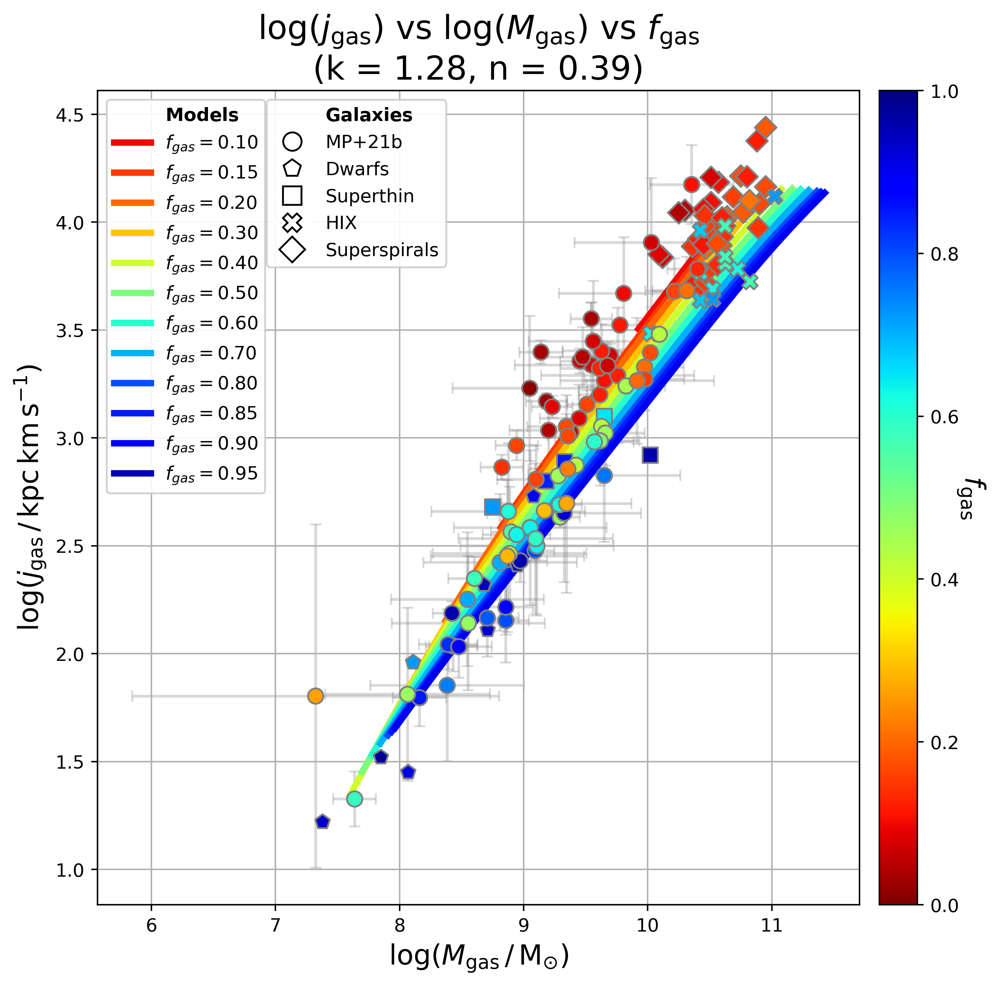

Execution time: 0.7423 seconds


In [109]:
# Final plot with j_gas and M_gas instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_f_gas_cutoff_ksl.txt'))
# OLD:
j_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_j_gas_cutoff_ksl.txt'))
M_gas_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data9_JAX_aKSL/final_Mgas_grid_cutoff_ksl.txt'))

# NEW:
# j_gas_array_10_50_cutoff_ksl = np.nan_to_num(j_gas_array_thresh)
# M_gas_array_cutoff_ksl = np.nan_to_num(M_gas_array_thresh)

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_gas_array_10_50 = np.log10(
    j_gas_array_10_50_cutoff_ksl,
    where=(j_gas_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_gas_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMgas = []
f_to_logjgas = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_gas_array_cutoff_ksl[i]) & (M_gas_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_gas_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMgas.append(None); f_to_logjgas.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_gas_array_cutoff_ksl[i, m][order])
    yJ = log_j_gas_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMgas.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjgas.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.15,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMgas])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjgas])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_log_Mgas, obs_log_jgas, label="MP+21b", marker="o",
                    facecolors=cmap(obs_fgas), 
                    edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_log_Mgas, obs_log_jgas, 
               xerr=obs_log_Mgas_errors, yerr=obs_log_jgas_errors,
               fmt=' ', ecolor='grey', capsize=3, alpha=0.3, zorder=0)

marker_map = {
    'Dwarfs': 'p',
    'Superthin': 's',
    'HIX': 'X',
    'Superspirals': 'D',
}
for i, (idx, df) in enumerate(pavel_data.items(), start=3):
    marker = marker_map[idx]
    frame.scatter(df['logMgas'], df['logjgas'], marker=marker,
                  facecolors=cmap(df['fgas'].values.copy()), edgecolors="grey", s=70, zorder=i)

cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{\rm gas}$", rotation=270, fontsize=15, labelpad=15)

# Legend
models_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Models}$")
models_legend_elements = [models_header] + ax1s

galaxies_header = plt.Line2D([0], [0], color='none', label=r"$\mathbf{Galaxies}$")
galaxy_legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', 
               markeredgecolor='k', markersize=10, label="MP+21b")
] + [
    plt.Line2D([0], [0], marker=marker_map[name], color='w', markerfacecolor='none',
               markeredgecolor='k', markersize=10, label=name)
    for name in ['Dwarfs', 'Superthin', 'HIX', 'Superspirals']
]
galaxies_legend_elements = [galaxies_header] + galaxy_legend_elements

leg1 = frame.legend(handles=models_legend_elements, loc='upper left', framealpha=0.9)
frame.add_artist(leg1)
leg2 = frame.legend(handles=galaxies_legend_elements, loc='upper left', 
                    bbox_to_anchor=(0.21, 1.0), framealpha=0.9)

title_str = (rf"$\log(j_{{\rm gas}})$ vs $\log(M_{{\rm gas}})$ vs $f_{{\rm gas}}$" + "\n" +
            f"(k = {ks:.2f}, n = {ns:.2f})")
frame.set_title(title_str, fontsize=18)
frame.set_xlabel(r"$\log(M_{\rm gas} \, / \, \rm M_{\odot})$", fontsize=15)
frame.set_ylabel(r"$\log(j_{\rm gas} \, / \, \rm kpc \, km \, s^{-1})$", fontsize=15)
frame.grid()
show()
fig.savefig('../outputs/graphs10_JAX_aKSL/log j_gas vs log_M_gas with Pavel (interpolated, cutoff KSL).png')

## Save comparison profiles for IO vs NIO figure

In [93]:
# Compute and save two IO profiles for the comparison figure:
# logM=10, k=1.5, n=0.5 (fixed j_acc(t) for all galaxies)
# Two omega values: +1/3 (decaying accretion) and -1/3 (growing accretion)

logM_comp = 10.0
M_bar_comp = 10.0**logM_comp
k_comp, n_comp = 1.5, 0.5

# Build r_acc matrix for these k, n values
r_acc_matrix_comp = build_r_acc_matrix_for_all_M_jax(n_comp, k_comp, key=None)

# Two omega values
omega_pos = 1.0 / 3.0   # t_acc = 3 Gyr (decaying M_dot)
omega_neg = -1.0 / 3.0  # t_acc = -3 Gyr (growing M_dot)

t_acc_pos = 1.0 / omega_pos  # 3.0 Gyr
t_acc_neg = 1.0 / omega_neg  # -3.0 Gyr

# Compute C for each
C_pos = float(C_def_jax(M_bar_comp, t_acc_pos))
C_neg = float(C_def_jax(M_bar_comp, t_acc_neg))

print(f"logM = {logM_comp}, k = {k_comp}, n = {n_comp}")
print(f"Positive omega: omega = {omega_pos:.4f}, t_acc = {t_acc_pos:.2f} Gyr, C = {C_pos:.4e}")
print(f"Negative omega: omega = {omega_neg:.4f}, t_acc = {t_acc_neg:.2f} Gyr, C = {C_neg:.4e}")

# Compute j_acc(t) — same for both (this is what's fixed in IO model)
j_max_comp = j_maxer(M_bar_comp)
j_acc_t = np.array(j_acc_def(j_max_comp, M_times1, n=n_comp, con=k_comp))
print(f"j_acc(0) = {j_acc_t[0]:.2f}, j_acc(12) = {j_acc_t[-1]:.2f} kpc km/s")

# Compute profiles
profile_pos = compute_radial_profiles_jax(
    logM_comp, t_acc_pos, r_acc_matrix_comp, log_M_bar_array_jax
)
profile_neg = compute_radial_profiles_jax(
    logM_comp, t_acc_neg, r_acc_matrix_comp, log_M_bar_array_jax
)

# Save
out_dir = '../outputs/model_radial_profiles/io/'
os.makedirs(out_dir, exist_ok=True)

for label, prof, omega_val, t_acc_val, C_val in [
    ('pos_omega', profile_pos, omega_pos, t_acc_pos, C_pos),
    ('neg_omega', profile_neg, omega_neg, t_acc_neg, C_neg),
]:
    save_dict = {}
    for key, val in prof.items():
        save_dict[key] = np.array(val) if hasattr(val, 'shape') else val
    save_dict['omega'] = omega_val
    save_dict['C'] = C_val
    save_dict['M_bar'] = M_bar_comp
    save_dict['j_acc_t'] = j_acc_t
    save_dict['k'] = k_comp
    save_dict['n'] = n_comp
    
    fname = os.path.join(out_dir, f'comparison_io_{label}.npz')
    np.savez(fname, **save_dict)
    print(f"Saved {fname}")
    f_gas_final = np.array(prof['f_gas_t'])[-1]
    j_bar_final = np.array(prof['j_bar_t'])[-1]
    print(f"  f_gas(t0) = {f_gas_final:.4f}, j_bar(t0) = {j_bar_final:.2f} kpc km/s")

logM = 10.0, k = 1.5, n = 0.5
Positive omega: omega = 0.3333, t_acc = 3.00 Gyr, C = 3.3955e+09
Negative omega: omega = -0.3333, t_acc = -3.00 Gyr, C = 6.2191e+07
j_acc(0) = 112.20, j_acc(12) = 1689.56 kpc km/s
Saved ../outputs/model_radial_profiles/io/comparison_io_pos_omega.npz
  f_gas(t0) = 0.3984, j_bar(t0) = 788.09 kpc km/s
Saved ../outputs/model_radial_profiles/io/comparison_io_neg_omega.npz
  f_gas(t0) = 0.8536, j_bar(t0) = 1475.62 kpc km/s
Execution time: 0.3119 seconds
